In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import random
from itertools import count
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
from matplotlib.animation import FuncAnimation
from scipy import stats
import pathlib
import sys
import re
import os

In [2]:
print(sys.path)

['/scicore/home/jenal/hernan0000/BACMMAN/bacmman_results/2022-05-26_long_channels', '/scicore/home/jenal/hernan0000/miniconda3/envs/i2i_env_fluo_res/lib/python39.zip', '/scicore/home/jenal/hernan0000/miniconda3/envs/i2i_env_fluo_res/lib/python3.9', '/scicore/home/jenal/hernan0000/miniconda3/envs/i2i_env_fluo_res/lib/python3.9/lib-dynload', '', '/scicore/home/jenal/hernan0000/miniconda3/envs/i2i_env_fluo_res/lib/python3.9/site-packages']


In [3]:
proj_dir = pathlib.Path(pathlib.Path.home(), 'BACMMAN', 'bacmman_results', '2022-05-26_long_channels')
df_name = proj_dir / '2022-05-26_long_channels_1_produced_2024-04-16.csv'
selections = proj_dir / '2022-05-26_long_channels_Selections_produced_2024-04-13.csv'

In [4]:
# Load data 
data = pd.read_csv(df_name, sep=';')

# Convert Frame to Time
data['Time']=data['Frame']*10/60
data['NextDivisionTime']=data['NextDivisionFrame']*10/60
data['PreviousDivisionTime']=data['PreviousDivisionFrame']*10/60

# Print
data.columns

/scratch/hernan0000/slurm-job.64485813/ipykernel_264154/2435967724.py:2: DtypeWarning: Columns (10,12) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv(df_name, sep=';')


Index(['Position', 'PositionIdx', 'Indices', 'Frame', 'Idx', 'Time',
       'BacteriaLineage', 'NextDivisionFrame', 'PreviousDivisionFrame',
       'SizeRatio', 'TrackErrorSizeRatio', 'EndOfChannelContact',
       'TruncatedDivision', 'TrackHeadIndices', 'TrackLength',
       'TrackObjectCount', 'ParentTrackHeadIndices', 'TrackErrorNext',
       'TrackErrorPrev', 'Prev', 'Next', 'GrowthRateSize', 'SizeAtBirthSize',
       'Size', 'GrowthRateFeretMax', 'SizeAtBirthFeretMax', 'FeretMax',
       'GrowthRateSpinelength', 'SizeAtBirthSpinelength', 'Spinelength',
       'GrowthRateSpineWidth', 'SizeAtBirthSpineWidth', 'SpineWidth',
       'GrowthRateLocalThickness', 'SizeAtBirthLocalThickness',
       'LocalThickness', 'MeanIntensityRFP', 'MeanIntensityGFP', 'BoundsXMin',
       'BoundsXMax', 'BoundsYMin', 'BoundsYMax', 'BoundsZMin', 'BoundsZMax',
       'MJD', 'MSD_1', 'IntervalCount_1', 'RelativeCoordX', 'RelativeCoordY',
       'RelativeCoordZ', 'NextDivisionTime', 'PreviousDivisionTime']

In [5]:
print(data['RelativeCoordY'].describe()) # computes xyz coordinates of the objects relative to the objects from another object class (degined in reference object) in unit (um).
print(data['BoundsYMin'].describe()) # computes the coordinate sof the bounding box of the object (minimal rectangle that includes the object)
print(data['BoundsYMin'].describe()) # computes the coordinate sof the bounding box of the object (minimal rectangle that includes the object)

#Use these features for filtering
print(data['MJD'].describe()) # computes the mean jump distance (average displacement) 
print(data['MSD_1'].describe()) # computes the mean squeared displacement

count    2.448343e+06
mean    -4.369781e-01
std      7.126202e+01
min     -4.015240e+04
25%     -9.593675e+00
50%     -3.606100e-01
75%      8.829565e+00
max      5.207100e+04
Name: RelativeCoordY, dtype: float64
count    2.715817e+06
mean     3.214882e+02
std      1.809746e+02
min      0.000000e+00
25%      1.670000e+02
50%      3.220000e+02
75%      4.770000e+02
max      6.430000e+02
Name: BoundsYMin, dtype: float64


# Add extra info to entire dataset

In [6]:
def add_info(df):
    
    ChIdx = [int(re.split("\-",ind)[1]) for ind in df['Indices']]
    df['ChannelIdx'] = ChIdx
    
    ChPos = [int(re.split("\-",ind)[2]) for ind in df['Indices']]
    df['CellPosChannel'] = ChPos 
    
    #combine PositionIdx-ChannelIdx-BacteriaLineage into single string and add string lin_id_str property
    df['lin_id_str_long'] = df['PositionIdx'].map(str) + '-' + df['ChannelIdx'].map(str) + '-' + df['BacteriaLineage'].map(str)
    
    #combine PositionIdx-ChannelIdx-BacteriaLineage into single string and add string lin_id_str property
    df['lin_id_str'] = df['Position'].map(str) + '-' + df['Indices'].map(str)

    #combine PositionIdx-ChannelIdx-BacteriaLineage into single string and add string lin_id_str property
    df['lin_id_str_Prev'] = np.where(~df['Prev'].isna(), df['Position'].astype(str) + '-' + df['Prev'].astype(str), np.nan)
    
    #combine Position and ChannelIdx to group persister cells selections 
    df['lin_id_str2'] = df['PositionIdx'].map(str) + '-' + df['ChannelIdx'].map(str)  
    
    #convert the ID to a unique integer
    df['id_cell'] = df.groupby(['lin_id_str_long']).ngroup()
    
    #combine PositionIdx-ParentTrackHeadIndices into single string and add eternal cell_id_str property 
    #df['et_id_string'] = df['Position'].map(str) + '-' + df[' '].map(str)
    #df['et_id_cell']= df.groupby(['et_id_string']).ngroup()
    
    return None

In [7]:
# Print dataset with extra info
add_info(data)
#print(data.columns)
print(np.unique(data['Position']))

['xy00' 'xy01' 'xy02' 'xy03' 'xy04' 'xy05' 'xy06' 'xy07' 'xy08' 'xy09'
 'xy10' 'xy11' 'xy12' 'xy13' 'xy14' 'xy15' 'xy16' 'xy17' 'xy18' 'xy19'
 'xy20' 'xy21' 'xy22' 'xy23' 'xy24' 'xy25' 'xy26' 'xy27' 'xy28' 'xy29'
 'xy30' 'xy31' 'xy32' 'xy33']


# Import bacmman selections

In [8]:
# Import bacmman selections
df_selections = pd.read_csv(selections, sep=';')
print(df_selections['SelectionName'].unique())
positions_with_persisters = np.unique(df_selections['PositionIdx'])
print(positions_with_persisters)

['persisters' 'susceptible_sisters' 'susceptibles']
[ 0  1  2  3  4  5  6  7  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 30 31 32 33]


# Add extra info to selections dataset

In [9]:
def add_info2(df):
    
    ChIdx = [int(re.split("\-",ind)[1]) for ind in df['Indices']]
    df['ChannelIdx'] = ChIdx

    ChPos = [int(re.split("\-",ind)[2]) for ind in df['Indices']]
    df['CellPosChannel'] = ChPos 
    
    #combine PositionIdx-ChannelIdx-BacteriaLineage into single string and add string lin_id_str property
    #df['lin_id_str'] = df['PositionIdx'].map(str) + '-' + df['ChannelIdx'].map(str) + '-' + df['BacteriaLineage'].map(str)
    
    #combine PositionIdx-ChannelIdx-BacteriaLineage into single string and add string lin_id_str property
    df['lin_id_str'] = df['Position'].map(str) + '-' + df['Indices'].map(str)                           
    
    #combine Position and ChannelIdx to group persister cells selections 
    df['lin_id_str2'] = df['PositionIdx'].map(str) + '-' + df['ChannelIdx'].map(str) 
    
    #convert the ID to a unique integer
    df['id_cell'] = df.groupby(['lin_id_str']).ngroup()
    
    #combine PositionIdx-ParentTrackHeadIndices into single string and add eternal cell_id_str property 
    #df['et_id_string'] = df['Position'].map(str) + '-' + df[' '].map(str)
    #df['et_id_cell']= df.groupby(['et_id_string']).ngroup()
    
    return None

In [10]:
#Add extra info to selections 
add_info2(df_selections)

# Print number of selections 
df_selections['SelectionName'].unique()

array(['persisters', 'susceptible_sisters', 'susceptibles'], dtype=object)

# Selections dataframe

In [11]:
# Make dataframe with Selections
pd.options.mode.copy_on_write = True # to avoid warnings

df2 = data.copy() # copy data

# Persisters
persisters = df_selections.loc[df_selections['SelectionName']== 'persisters']
df_persisters = df2[df2['lin_id_str'].isin(persisters['lin_id_str'])]
df_persisters['cell_type'] = 'persister'
#print(type(data_persisters))

# Susceptibles Sisters
sisters = df_selections.loc[df_selections['SelectionName']== 'susceptible_sisters']
df_sisters = df2[df2['lin_id_str'].isin(sisters['lin_id_str'])]
df_sisters['cell_type'] = 'susceptible_sister'
#print(susceptible_sisters)

# Remove persisters and sisters data after Frame > 111 from susceptibles data.
selections_after_drug = df_selections.loc[(df_selections['SelectionName'] == 'persisters') & (df_selections['SelectionName'] == 'susceptible_sisters') & (df_selections['Frame'] > 111)]

# Susceptibles
data_non_persisters = df2[~df2['lin_id_str'].isin(selections_after_drug['lin_id_str'])]
data_non_persisters['cell_type'] = ''


In [12]:
# Get number of cell divisions of selections at different phases using bacmman lineages. Short working version for multiple Selections: here applied to persisters and susceptible sisters. 

# Make copies of the merged DataFrames
dfs = [df_persisters.copy(), df_sisters.copy()]

# List to store the final concatenated DataFrames
concatenated_dfs = []

# Iterate over the list of DataFrames
unique_lineage_id_selections =[]
Bacterialineage_selections =[]
for df in dfs:
    # Grouping operation
    groups = df.groupby('lin_id_str2')
    group_dfs = []

    for group_name, group_df in groups:
        max_frame = group_df['Frame'].max()
        max_frame_rows = group_df[group_df['Frame'] == max_frame]
        group_df['unique_lineage_id'] = max_frame_rows['lin_id_str'].values[0] # assigns the max value of lin_id_str as unique_lineage_id since we are reconstructing the lineage backwards 
        unique_lineage_id_selections.append(max_frame_rows['lin_id_str'].values[0]) # store unique_lineage_id
        Bacterialineage_selections.append(max_frame_rows['BacteriaLineage'].values[0]) # store Bacterialineage_selections 

        # Get number of cell divisions using lineages from bacmman (length_drops are more accurate for counting number of divisions for Selections)
        num_div_exp_phase = group_df[(group_df['Frame'] >= 0) & (group_df['Frame'] <= 30)]['PreviousDivisionFrame'].isna().sum()
        num_div_grad_phase = group_df[(group_df['Frame'] >= 30) & (group_df['Frame'] <= 45)]['PreviousDivisionFrame'].isna().sum()
        num_div_stat_phase = group_df[(group_df['Frame'] >= 45) & (group_df['Frame'] <= 93)]['PreviousDivisionFrame'].isna().sum()
        num_div_drug_phase = group_df[(group_df['Frame'] >= 93) & (group_df['Frame'] <= 111)]['PreviousDivisionFrame'].isna().sum()

        group_df['num_div_exp_phase'] = num_div_exp_phase
        group_df['num_div_grad_phase'] = num_div_grad_phase
        group_df['num_div_stat_phase'] = num_div_stat_phase
        group_df['num_div_drug_phase'] = num_div_drug_phase

        # number of divisions during recovery phase 
        
        #if (group_df['Frame'] > 111).any():
        #    notna_after111 = group_df['NextDivisionFrame'].notna()
        #    num_div_rec_phase = notna_after111.sum()
        #    group_df['num_div_rec_phase'] = num_div_rec_phase

        group_dfs.append(group_df)

    # Concatenate DataFrames
    concatenated_df = pd.concat(group_dfs)
    concatenated_dfs.append(concatenated_df)

# Concatenate both merged DataFrames
df_selections_merged = pd.concat(concatenated_dfs)


In [13]:
# Group by unique ID
chekpoint_cell_divisions_selections = df_selections_merged.groupby('unique_lineage_id')

# Print cell divisions at each phase
#for group_name, group_df in chekpoint_cell_divisions_selections:
#    print(group_df[['num_div_exp_phase', 'num_div_stat_phase', 'num_div_drug_phase']].describe())

## Remove data of cells in Selections at frame > 111

In [14]:
# Remove data of cells in Selections at frame > 111 for 'persisters'
persisters_after_drug = df_selections.loc[(df_selections['SelectionName'] == 'persisters') & (df_selections['Frame'] > 111)]

# Remove data of cells in Selections at frame > 111 for 'susceptible_sisters'
sisters_after_drug = df_selections.loc[(df_selections['SelectionName'] == 'susceptible_sisters') & (df_selections['Frame'] > 111)]

# Concatenate the results from both lines
selections_after_drug = pd.concat([persisters_after_drug, sisters_after_drug])

# Remove persisters data from susceptibles df2
df_nonpersisters = df2[~df2['lin_id_str'].isin(selections_after_drug['lin_id_str'])] # VERY IMPORTANT: speeds up lineage reconstruction of non-persisters, avoid error, and reduces memory usage

# Reset the 'cell_type' column to empty string
df_nonpersisters['cell_type'] = ''

# Ancestry reconstruction

In [15]:
# Copy data
df2 = data.copy()
# Print
df2[['lin_id_str_Prev', 'Prev']]

,lin_id_str_Prev,Prev
0,NaN,NaN
1,NaN,NaN
2,NaN,NaN
3,NaN,NaN
4,NaN,NaN
...,...,...
2715812,xy33-257-24-4,257-24-4
2715813,xy33-257-24-5,257-24-5
2715814,xy33-257-24-5,257-24-5
2715815,xy33-257-24-6,257-24-6


## Working version 1: removes repeated data from treated lineages.

This version of ancestry reconstruction reconstruct full cell lineages by 1. fitering dataframe at a specific time of treatment (a range would be also possible), 2. finds the 'BacteriaLineage' at that time, 3. substracts 1 letter to 'BacteriaLineage', 4. adds a unique_lineage_id (i.e.,'lin_id_str' at the selected time) to all data points of the full 'BacteriaLineage' resulting from step 3.

In [16]:
positions_with_persisters

array([ 0,  1,  2,  3,  4,  5,  6,  7,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 30, 31, 32, 33])

2702


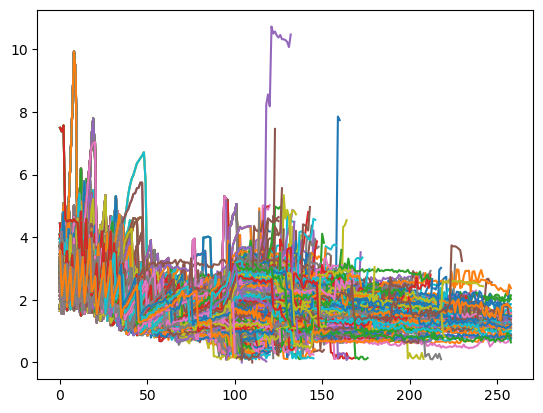

In [18]:
# Working version 1: removes repeated data from treated lineages.
filtered_df = pd.DataFrame(df_nonpersisters)  # Important: data_non_persisters exclude lin_id_str of persisters from Frames > 111. See above
upper_limit_frame = 112
lower_limit_frame = 92
frame_range = list(range(128))
positions = [1, 10, 20, 30] # test
# microchannels = [1] # test

lineage_dfs = []

# Positions data
#positions = filtered_df['PositionIdx'].unique() # all positions
#positions = positions_with_persisters
for position in positions:
    position_df = filtered_df[filtered_df['PositionIdx'] == position]
    # print('Position Idx:', position_df['PositionIdx'].unique())

    # Microchannels data
    microchannels = position_df['ChannelIdx'].unique()  # all microchannels
    for channel in microchannels:
        channel_df = position_df[position_df['ChannelIdx'] == channel]
        # print('Channel Idx:', channel_df['ChannelIdx'].unique())

        # Filter data during drug treatment 
        drug_frm_range = channel_df[(channel_df['Frame'] >= 93) & (channel_df['Frame'] <= 111)]

        # Only use BacteriaLineages & corresponding lin_id_str that were treated with drug       
        treated_lineages = drug_frm_range.loc[drug_frm_range['BacteriaLineage'].notna(), ['BacteriaLineage', 'lin_id_str', 'Frame', 'lin_id_str_long']] # use 'lin_id_str_long' for checking
        
        # Loop through frames in reverse order
        for frame in range(upper_limit_frame, lower_limit_frame, -1):
            previous_frame_treated_lineages = None
            if frame < upper_limit_frame:
                previous_frame_treated_lineages = treated_lineages[treated_lineages['Frame'] == frame + 1]['BacteriaLineage'].unique()

            frame_treated_lineages = treated_lineages[treated_lineages['Frame'] == frame]

            for index, row in frame_treated_lineages.iterrows():
                treated_BacteriaLineage = row['BacteriaLineage']
                treated_lin_id_str = row['lin_id_str']

                # Skip reconstruction if treated lineage is already present in the previous frame
                if previous_frame_treated_lineages is not None and treated_BacteriaLineage in previous_frame_treated_lineages:
                    continue
                #print('treated_lin_id_str', treated_lin_id_str)
                reconstructed_lineage_back = [treated_BacteriaLineage[:i] for i in range(len(treated_BacteriaLineage), 0, -1)]

                # Filter data during drug treatment
                filtered_BacteriaLineage_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_back)]

                # Add treated 'lin_id_str' as unique_lineage_id to all data of reconstructed lineage
                filtered_BacteriaLineage_df['unique_lineage_id'] = treated_lin_id_str

                # Add cell type to all data of reconstructed lineage. Since we know all persisters and sister cells in dataset, cell_type here is non-persister
                filtered_BacteriaLineage_df['cell_type'] = 'susceptible'

                # Count number of divisions using lineage information
                num_div_exp_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 0) & (
                            filtered_BacteriaLineage_df['Frame'] <= 30)]['PreviousDivisionFrame'].isna().sum()
                num_div_grad_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 30) & (
                            filtered_BacteriaLineage_df['Frame'] <= 45)]['PreviousDivisionFrame'].isna().sum()
                num_div_stat_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 45) & (
                            filtered_BacteriaLineage_df['Frame'] <= 93)]['PreviousDivisionFrame'].isna().sum()
                num_div_drug_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 93) & (
                            filtered_BacteriaLineage_df['Frame'] <= 111)]['PreviousDivisionFrame'].isna().sum()

                filtered_BacteriaLineage_df['num_div_exp_phase'] = num_div_exp_phase
                filtered_BacteriaLineage_df['num_div_grad_phase'] = num_div_grad_phase
                filtered_BacteriaLineage_df['num_div_stat_phase'] = num_div_stat_phase
                filtered_BacteriaLineage_df['num_div_drug_phase'] = num_div_drug_phase

                # Checkpoint: existence of lineages
                frames_full_lineage_exists = filtered_BacteriaLineage_df["Frame"].tolist()
                missing_frames_lineage = [frame for frame in frame_range if frame not in frames_full_lineage_exists]  # find missing frames in lineage data

                plt.plot(filtered_BacteriaLineage_df['Frame'], filtered_BacteriaLineage_df['Spinelength'], linestyle='-')

                # Append lineage_df to lineage_dfs list
                lineage_dfs.append(filtered_BacteriaLineage_df)

# Concatenate all lineage_dfs in list and make a master_df
df_non_persisters_merged = pd.concat(lineage_dfs, ignore_index=True)
print(df_non_persisters_merged['unique_lineage_id'].nunique())


## # Working Version 2: does not remove repeated data of treated lineages

2127


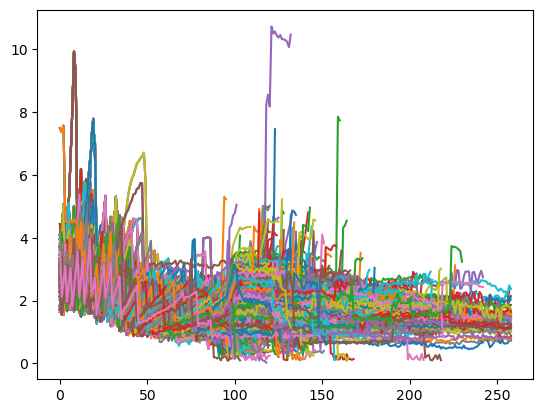

In [67]:
# Working Version 2: does not remove repeated data of treated lineages
filtered_df= pd.DataFrame(df_nonpersisters) # Important: data_non_persisters exclude lin_id_str of persisters from Frames > 111. See above
starting_frame = 259
frame_range = list(range(128))
positions = [1, 10, 20, 30] # test
#microchannels = [1] # test

lineage_dfs = []

# Positions data
#positions = filtered_df['PositionIdx'].unique() # all positions
#positions = positions_with_persisters
for position in positions:
    position_df = filtered_df[filtered_df['PositionIdx'] == position]
    #print('Position Idx:', position_df['PositionIdx'].unique())

    # Microchannels data
    microchannels = position_df['ChannelIdx'].unique() # all microchannels
    for channel in microchannels:
        channel_df = position_df[position_df['ChannelIdx'] == channel]
        #print('Channel Idx:', channel_df['ChannelIdx'].unique())

        # Filter data during drug treatment 
        #drug_frm_range = channel_df[(channel_df['Frame'] >= 93) & (channel_df['Frame'] <= 111)]

        drug_frm_range = channel_df[(channel_df['Frame'] == 93)]

        # Only use BacteriaLineages & corresponding lin_id_str that were treated with drug       
        treated_lineages = drug_frm_range.loc[drug_frm_range['BacteriaLineage'].notna(), ['BacteriaLineage', 'lin_id_str', 'Frame', 'lin_id_str_long']] # use 'lin_id_str_long' for checking
        #print('Treated lineages:', treated_lineages)

        for index, row in treated_lineages.iterrows():
            # Get treated BacteriaLineages    
            treated_BacteriaLineage = row['BacteriaLineage']
            # Get corresponding treated lin_id_str
            treated_lin_id_str = row['lin_id_str']
            # Reconstruct full lineage backwards by removing a letter from each BacteriaLineage
            reconstructed_lineage_back = [treated_BacteriaLineage[:i] for i in range(len(treated_BacteriaLineage), 0, -1)]
            #print('Reconstructed lineage back:', reconstructed_lineage_back)
            
            # Create df with data of full reconstructed lineage 
            filtered_BacteriaLineage_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_back)]
            #print(filtered_BacteriaLineage_df['lin_id_str'].unique())

            # Add temporary unique_lineage_id # NEEDED? CHECK.
            
            # Add treated 'lin_id_str' as unique_lineage_id to all data of reconstructed lineage
            filtered_BacteriaLineage_df['unique_lineage_id'] = treated_lin_id_str 
            # Check that all data in filtered_BacteriaLineage_df has the same treated_lin_id_str
            #print(filtered_BacteriaLineage_df['unique_lineage_id'].unique())
            # Add cell type to all data of reconstructed lineage. Since we know all persisters and sister cells in dataset, cell_type here is non-persister 
            filtered_BacteriaLineage_df['cell_type']= 'susceptible' 
            
            # Count number of divisions using lineage information
            num_div_exp_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 0) & (filtered_BacteriaLineage_df['Frame'] <= 30)]['PreviousDivisionFrame'].isna().sum()
            num_div_grad_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 30) & (filtered_BacteriaLineage_df['Frame'] <= 45)]['PreviousDivisionFrame'].isna().sum()
            num_div_stat_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 45) & (filtered_BacteriaLineage_df['Frame'] <= 93)]['PreviousDivisionFrame'].isna().sum()
            num_div_drug_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 93) & (filtered_BacteriaLineage_df['Frame'] <= 111)]['PreviousDivisionFrame'].isna().sum()
            #num_div_reco_phase = filtered_BacteriaLineage_df[(filtered_BacteriaLineage_df['Frame'] >= 129) & (filtered_BacteriaLineage_df['Frame'] <= 276)]['PreviousDivisionFrame'].isna().sum()
            
            filtered_BacteriaLineage_df['num_div_exp_phase'] = num_div_exp_phase
            filtered_BacteriaLineage_df['num_div_grad_phase'] = num_div_grad_phase
            filtered_BacteriaLineage_df['num_div_stat_phase'] = num_div_stat_phase
            filtered_BacteriaLineage_df['num_div_drug_phase'] = num_div_drug_phase
            #filtered_BacteriaLineage_df['num_div_reco_phase'] = num_div_reco_phase

            #if (filtered_BacteriaLineage_df['Frame'] > 111).any():
            #    notna_after111 = filtered_BacteriaLineage_df['NextDivisionFrame'].notna()
            #    num_div_rec_phase = notna_after111.sum()
            #    filtered_BacteriaLineage_df['num_div_rec_phase'] = num_div_rec_phase

            # Checkpoint: existence of lineages
            frames_full_lineage_exists = filtered_BacteriaLineage_df["Frame"].tolist()
            missing_frames_lineage = [frame for frame in frame_range if frame not in frames_full_lineage_exists] # find missing frames in lineage data
            #print('missing_frames_lineage', missing_frames_lineage)

            plt.plot(filtered_BacteriaLineage_df['Frame'], filtered_BacteriaLineage_df['Spinelength'], linestyle='-')

            # Append lineage_df to lineage_dfs list
            lineage_dfs.append(filtered_BacteriaLineage_df)

# Concatenate all lineage_dfs in list and make a master_df
df_non_persisters_merged = pd.concat(lineage_dfs, ignore_index=True) 
print(df_non_persisters_merged['unique_lineage_id'].nunique())

## Functions for ancestry reconstruction using dictionary (alternative under development)

In [152]:
# Short working version 

def find_lineage_indices(df, frame, unique_lineage_id_selections):
    seed_lineages = df[df["Frame"] == frame]["lin_id_str"].unique()
    seed_lineages = set(seed_lineages) - (set(seed_lineages) & set(unique_lineage_id_selections)) # it should remove persister lineages from seed_lineages found
    return seed_lineages

def find_prev_recursive(df, seeds):
    prev_dict = {}
    for seed in seeds:
        index = seed
        prev_list = {col: [] for col in df.columns}
        while True:
            # Check if the index is in the DataFrame
            if index in df["lin_id_str"].values:
                prev_row = df[df["lin_id_str"] == index].iloc[0]
                if pd.isna(prev_row["lin_id_str_Prev"]) or prev_row["Frame"] < 0:
                    break
                for key in prev_list.keys():
                    prev_list[key].append(prev_row[key])
                index = prev_row["lin_id_str_Prev"]
            else:
                break
        
        # Check if any of the lists in prev_list are non-empty
        if any(prev_list.values()):
            prev_dict[seed] = prev_list
        
    return prev_dict


In [46]:
# Short working version  under development to remove redundant data of non-persisters

def find_lineage_indices(df, frame, unique_lineage_id_selections): 
    seed_lineages = df[df["Frame"] == frame]["lin_id_str"].unique().tolist()
    seed_bl = df[df["Frame"] == frame]["BacteriaLineage"].dropna().unique().tolist()
    #print('seed_lineages', seed_lineages)
    #print('seed_BacteriaLineage', seed_bl)
    #seed_lineages = set(seed_lineages) - (set(seed_lineages) & set(unique_lineage_id_selections)) # it should remove persister lineages from seed_lineages found
    #seed_bl = set(seed_bl) - (set(seed_bl) & set(unique_bacterialineage)) # it should remove persister lineages from seed_lineages found
    lineage_vector = [seed_lineages, seed_bl] # make vector containing both numbers
    #print('lineage_vector', lineage_vector)
    return lineage_vector

#seeds is now a vector
def find_prev_recursive(df, seeds):
    prev_dict = {} # make a new dictionary to start data of previous time point
    for idx, seed in enumerate(seeds):
        print('seed inside find_prev_recursive 1', idx, seed[0]) # seed[0] because seeds is now a vector
        index = seed[0] # access seed_lineages
        prev_list = {col: [] for col in df.columns} # make a column for each column in input df
        while True:
            # Check if the index is in the DataFrame
            if index in df["lin_id_str"].values: # and seed[1] not in df["BacteriaLineage"].values: # make sure that seed is in current lin_id_str and that BacteriaLineage is not repeated
                prev_row = df[df["lin_id_str"] == index].iloc[0]
                print('prev_row_BacteriaLineage', prev_row['BacteriaLineage']) # check ['BacteriaLineage'] in previous lin_id_str selected
                if pd.isna(prev_row["lin_id_str_Prev"]) or prev_row["Frame"] < 0:
                    break
                for key in prev_list.keys():
                    prev_list[key].append(prev_row[key]) # key is lin_id_str
                index = prev_row["lin_id_str_Prev"]
            else:
                break
        
        # Check if any of the lists in prev_list are non-empty
        if any(prev_list.values()):
            prev_dict[seed] = prev_list
        
    return prev_dict


## Apply alternative ancestry reconstruction functions using dictionary

This version of ancestry reconstruction uses functions 1. find_lineage_indices to find current lin_id_str and BacteriaLineage and 2. find_prev_recursive to reconstruct lineage recursively. NOT WORKING AS EXPECTED YET!

In [51]:
# Todo: use "BacteriaLineage" to remove redundant data for non-persister cells at frame < 93

# Working version
filtered_df= pd.DataFrame(df_nonpersisters) # Important: data_non_persisters exclude lin_id_str of persisters from Frames > 111. See above
upper_limit_frame = 111
lower_limit_frame = 93
positions = [1, 10, 20, 30] # test
#microchannels = [1] # test

lineage_dfs = []

# Positions data
#positions = filtered_df['PositionIdx'].unique() # all positions
#positions = positions_with_persisters
for position in positions:
    position_df = filtered_df[filtered_df['PositionIdx'] == position]
    #print('Position Idx:', position_df['PositionIdx'].unique())

    # Microchannels data
    #microchannels = position_df['ChannelIdx'].unique() # all microchannels
    for channel in microchannels:
        channel_df = position_df[position_df['ChannelIdx'] == channel]
        #print('Channel Idx:', channel_df['ChannelIdx'].unique())

        # Loop through frames decreasing from 258 to 0
        for frame in range(upper_limit_frame,lower_limit_frame -1, -1):
            # Starting Frame
            # Task 1: Find lineages at current Frame
            lineage_vector = find_lineage_indices(channel_df, frame, unique_lineage_id_selections) # unique_lineage_id_selections defined above
            #print('lineage_vector', lineage_vector)
            lineage_seed = lineage_vector[0]
            lineage_bl = lineage_vector[1]
            print('seed_lineages', lineage_seed)
            #print('seed_BacteriaLineage', lineage_bl)
            #seed_lineages =  set(seed_lineages) - set(unique_lineage_id_selections)
            #seed_lineages = ["10-1-0"] # test
            #print("Seed Lineages:", seed_lineages)

            # Task 2: Find prev recursively
            prev_dict = find_prev_recursive(channel_df, lineage_seed) # IMPORTANT: this prev_dict is not added to the final df. Not a problem for this experiment when starting at late Frames
            #print("Starting prev_dict:", prev_dict[lineage_seed]['BacteriaLineage']) # get BacteriaLineage of lineage_seed

            # Previous frame
            new_frame = frame - 1
            # Task 1: Find lineages at current Frame
            new_lineage_vector = find_lineage_indices(channel_df, new_frame, unique_lineage_id_selections) # unique_lineage_id_selections defined above
            new_lineage_seed = new_lineage_vector[0]
            new_lineage_bl = new_lineage_vector[1]
            #new_lineage_vector =  set(new_lineage_seed) - set(unique_lineage_id_selections)
            #print("Prev Seed Lineages:", new_lineage_vector)
            
            # Make a new dictionary with data of lin_id_str of Prev element
            new_prev_values = {prev_dict[key]['lin_id_str_Prev'][0] if new_lineage_bl not in (prev_dict[key]['BacteriaLineage']) and prev_dict[key]['lin_id_str_Prev'] else None for key in prev_dict}
            print("Prev Prev Lineages:", new_prev_values)
            only_current_lineages = set(new_lineage_seed) - set(new_prev_values) # compare current and prev seed lineages
            print("Current lineages:", only_current_lineages)

            # Task 2: Find prev recursively of missing lineages
            prev_dict = find_prev_recursive(channel_df, only_current_lineages) # apply function only to missing lineages that have not been reconstructed previously
            print("Following prev_dict:", prev_dict)

            # Extract df from prev_dict
            for key, value in prev_dict.items():
                # Find the maximum length of arrays in the dictionary value
                max_length = max(len(v) for v in value.values())
                
                # Pad or truncate arrays to make them all of the same length
                for k, v in value.items():
                    if len(v) < max_length:
                        value[k] = v + [None] * (max_length - len(v))
                    elif len(v) > max_length:
                        value[k] = v[:max_length]

                #print("Making df of:", 'P:', position, 'C:', channel, 'F:', frame,'Seed:', key)
                # Create DataFrame from dictionary value
                lineage_df = pd.DataFrame(value)
                # Add key value as unique indentifier for lineage
                #print('key', key)
                lineage_df['unique_lineage_id'] = key
                #print('unique_lineage_id', set(lineage_df['unique_lineage_id']))

                # Count number of divisions at different experiment phases
                num_div_exp_phase = lineage_df[(lineage_df['Frame'] >= 0) & (lineage_df['Frame'] <= 30)]['PreviousDivisionFrame'].isna().sum()
                num_div_stat_phase = lineage_df[(lineage_df['Frame'] >= 30) & (lineage_df['Frame'] <= 93)]['PreviousDivisionFrame'].isna().sum()
                num_div_drug_phase = lineage_df[(lineage_df['Frame'] >= 93) & (lineage_df['Frame'] <= 111)]['PreviousDivisionFrame'].isna().sum()
                num_div_rec_phase =  lineage_df[(lineage_df['Frame'] > 111)]['PreviousDivisionFrame'].isna().sum()

                # Add cell divisions counts
                lineage_df['num_div_exp_phase']= num_div_exp_phase
                lineage_df['num_div_stat_phase']= num_div_stat_phase
                lineage_df['num_div_drug_phase']= num_div_drug_phase
                lineage_df['num_div_rec_phase']= num_div_rec_phase

                # Non-persister lineage rules 
                # Filter 1: cell lineage  experienced drug tratment 
                if ((lineage_df['Frame'] >= 93) & (lineage_df['Frame'] <= 111)).any():
                # Case 1: 'non-persister_killed_after_drug'
                    if (lineage_df['num_div_rec_phase'].max() <= 10)& (min(lineage_df['Frame'])< 10):
                        print('Case 1 cell_type', lineage_df['cell_type'])
                        lineage_df['cell_type'] = 'non-persister_killed_after_drug'
                        #print('non-persister_killed_after_drug, frmin, frmax, numdivrec:', lineage_df['Frame'].min(), lineage_df['Frame'].max(), lineage_df['num_div_rec_phase'].max())
                        
                 # Case 2: 'non-persister_killed_during_drug'
                elif len(np.unique(lineage_df['Frame'])) >= 93 & len(np.unique(lineage_df['Frame'])) <= 111:
                    lineage_df['cell_type'] = 'non-persister_killed_during_drug'
                    #print('non-persister_killed_before_drug, frmin, frmax, numdivrec:', lineage_df['Frame'].min(), lineage_df['Frame'].max(), lineage_df['num_div_rec_phase'].max())
                     
                # Case 3: 'non-persister_killed_at_drug'
                elif len(np.unique(lineage_df['Frame'])) == 93:
                    lineage_df['cell_type'] = 'non-persister_killed_at_drug'
                    #print('non-persister_killed_before_drug, frmin, frmax, numdivrec:', lineage_df['Frame'].min(), lineage_df['Frame'].max(), lineage_df['num_div_rec_phase'].max())

                # Non-treated lineages    
                else:
                    #print('Not_exposed_to_drug')
                    lineage_df['cell_type'] = 'non_treated'
                    #print('non_treated, frmin, frmax, numdivrec:', lineage_df['Frame'].min(), lineage_df['Frame'].max(), lineage_df['num_div_rec_phase'].max())

                # Append lineage_df to lineage_dfs list
                lineage_dfs.append(lineage_df)

# Concatenate all lineage_dfs in list and make a master_df
df_non_persisters_merged = pd.concat(lineage_dfs, ignore_index=True) 
print(df_non_persisters_merged['unique_lineage_id'].nunique())

seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}
seed_lineages []
Prev Prev Lineages: set()
Current lineages: set()
Following prev_dict: {}

ValueError: No objects to concatenate

## Checkpoint: compare columns of persisters and non-persisters dfs

In [70]:
# Check columns of persisters and non-persisters dfs
df1=df_non_persisters_merged
df2=df_selections_merged

common_columns = set(df1.columns) & set(df2.columns)
columns_only_in_df1 = set(df1.columns) - set(df2.columns)
columns_only_in_df2 = set(df2.columns) - set(df1.columns)

print("Common columns:", common_columns)
print("Columns only in df1:", columns_only_in_df1)
print("Columns only in df2:", columns_only_in_df2)


Common columns: {'lin_id_str_Prev', 'TrackErrorSizeRatio', 'TrackErrorPrev', 'TrackObjectCount', 'BacteriaLineage', 'PreviousDivisionTime', 'num_div_stat_phase', 'RelativeCoordZ', 'PositionIdx', 'unique_lineage_id', 'Indices', 'num_div_exp_phase', 'CellPosChannel', 'BoundsXMin', 'EndOfChannelContact', 'SizeAtBirthSize', 'BoundsYMax', 'num_div_grad_phase', 'BoundsZMax', 'SpineWidth', 'LocalThickness', 'GrowthRateSpineWidth', 'Idx', 'Spinelength', 'BoundsYMin', 'num_div_drug_phase', 'ChannelIdx', 'Next', 'BoundsZMin', 'id_cell', 'cell_type', 'Time', 'Position', 'TruncatedDivision', 'GrowthRateLocalThickness', 'TrackLength', 'BoundsXMax', 'lin_id_str_long', 'IntervalCount_1', 'Frame', 'GrowthRateSize', 'GrowthRateSpinelength', 'NextDivisionTime', 'TrackHeadIndices', 'GrowthRateFeretMax', 'RelativeCoordX', 'lin_id_str2', 'lin_id_str', 'ParentTrackHeadIndices', 'FeretMax', 'MeanIntensityGFP', 'SizeAtBirthSpinelength', 'MSD_1', 'SizeAtBirthFeretMax', 'SizeAtBirthLocalThickness', 'Prev', 'Siz

# Final working df

In [19]:
final_df = pd.concat([df_non_persisters_merged, df_selections_merged], ignore_index=True)
#final_df.head()

In [20]:
final_df['cell_type'].unique()

array(['susceptible', 'persister', 'susceptible_sister'], dtype=object)

In [21]:
number_of_persisters = final_df.loc[(final_df['cell_type'] == 'persister')]['unique_lineage_id'].nunique()
print('number_of_persisters',number_of_persisters)
number_of_susceptibles = final_df.loc[(final_df['cell_type'] == 'susceptible')]['unique_lineage_id'].nunique()
print('number_of_susceptibles', number_of_susceptibles)
persisters_frequency = number_of_persisters/number_of_susceptibles
print('persisters_frequency',persisters_frequency)

number_of_persisters 206
number_of_susceptibles 2702
persisters_frequency 0.07623982235381199


# Plot random persister and non-persister cells 

random_susceptible xy30-111-20-20
length 126
<bound method Series.unique of 320899      NaN
320900      NaN
320901      2.0
320902      2.0
320903      4.0
          ...  
321020    101.0
321021    101.0
321022    101.0
321023    101.0
321024    101.0
Name: PreviousDivisionFrame, Length: 126, dtype: float64>
random_persister xy13-258-22-0


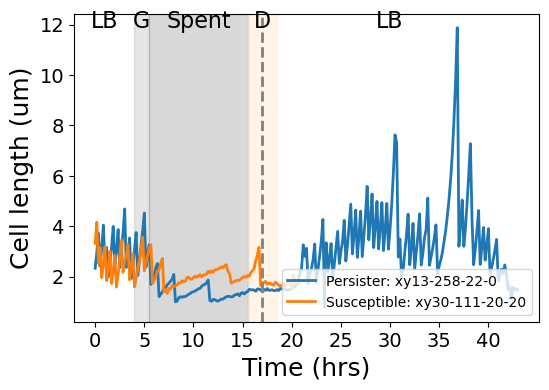

In [28]:
# Filter 'non-persisters'
df_non_persisters_random = df_non_persisters_merged[df_non_persisters_merged['cell_type']=='susceptible']

# Get unique lineage ids of 'non-persisters'
unique_lineage_id_non_persisters=list(df_non_persisters_random.loc[df_non_persisters_random['cell_type'] == 'susceptible', 'unique_lineage_id'].unique())

# Select random persister and non_persister lineages for plotting
random_non_persister = random.choice(unique_lineage_id_non_persisters)
print('random_susceptible', random_non_persister)

df_non_persisters_random = df_non_persisters_merged[df_non_persisters_merged['unique_lineage_id']== random_non_persister]
print('length', df_non_persisters_random['Spinelength'].nunique())#min(df_non_persisters_random['Frame']), max(df_non_persisters_random['Frame']))
print(df_non_persisters_random['PreviousDivisionFrame'].unique)

# Filter 'persisters'
df_persisters_random = df_selections_merged[df_selections_merged['cell_type']=='persister']

# Get unique lineage ids of 'non-persisters'
unique_lineage_id_persisters=list(df_persisters_random.loc[df_persisters_random['cell_type'] == 'persister', 'unique_lineage_id'].unique())

# Select random persister and non_persister lineages for plotting
random_persister = random.choice(unique_lineage_id_persisters)
print('random_persister', random_persister)
df_persisters_random = df_selections_merged[df_selections_merged['unique_lineage_id']==random_persister]


plt.figure(figsize=(6, 4))  # Set figure size for each plot

# Plot data from random_persister
plt.plot(df_persisters_random['Time'], df_persisters_random['Spinelength'],lw=2, label=f'Persister: {random_persister}')

# Plot data from random persister and non_persister
plt.plot(df_non_persisters_random['Time'], df_non_persisters_random['Spinelength'], lw=2, label=f'Susceptible: {random_non_persister}')
max_spinelength = max(df_non_persisters_random['Spinelength'].max(), df_persisters_random['Spinelength'].max())

# Add vertical lines and spans
plt.axvspan(xmin=4, xmax=5.5, color='gray', alpha=0.2)
plt.axvspan(xmin=5.5, xmax=15.5, color='gray', alpha=0.3)
plt.axvspan(xmin=15.5, xmax=18.5, color='bisque', alpha=0.4)
plt.axvline(x=17, color='gray', lw=2, ls='--')
plt.text(1,max_spinelength, 'LB', fontsize=16, color='black', ha='center')
plt.text(4.7, max_spinelength, 'G', fontsize=16, color='black', ha='center')
plt.text(10.5, max_spinelength, 'Spent', fontsize=16, color='black', ha='center')
plt.text(17, max_spinelength, 'D', fontsize=16, color='black', ha='center')
plt.text(30, max_spinelength, 'LB', fontsize=16, color='black', ha='center')

# Add legend
plt.legend(loc='lower right')
plt.xlabel("Time (hrs)", fontsize=18)
plt.ylabel("Cell length (um)", fontsize=18)
plt.xticks(np.arange(0, 45 , step=5), fontsize=14)
plt.yticks(fontsize=14)

# Save the plot as an SVG file
plt.savefig(proj_dir/'plt_cell_length_per_and_nonper.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()


# Plot random persister and sister cells 

In [ ]:
# Group by 'lin_id_str2'
groups = df_selections_merged.groupby('lin_id_str2')
# Specify the desired order of cell_types for plotting
cell_type_order = ['persister', 'susceptible_sister']

# Iterate over groups
for group_name, group_df in groups:
    # Create a new plot for each group
    plt.figure(figsize=(6, 4))  # Set figure size for each plot
    
    # Plot persister and sister
    for cell_type, cell_group in group_df.groupby('cell_type'):
        plt.plot(cell_group['Time'], cell_group['Spinelength'],lw=2, label=cell_type)
    
    # Plot non-persister 
    #plt.plot(df_non_persister['Time'], df_non_persister['Spinelength'], lw=2,label=f'non-persister') #label=f'Non-persister: {random_non_persister}')
    
    # Calculate the maximum y value within the current group
    max_spinelength = group_df['Spinelength'].max()
    
    # Set plot title and labels
    # Add vertical lines and spans
    plt.axvspan(xmin=4, xmax=5.5, color='gray', alpha=0.2)
    plt.axvspan(xmin=5.5, xmax=15.5, color='gray', alpha=0.3)
    plt.axvspan(xmin=15.5, xmax=18.5, color='bisque', alpha=0.4)
    plt.axvline(x=17, color='gray', lw=2, ls='--')
    plt.text(1,max_spinelength, 'LB', fontsize=16, color='black', ha='center')
    plt.text(4.7, max_spinelength, 'G', fontsize=16, color='black', ha='center')
    plt.text(10.5, max_spinelength, 'Spent', fontsize=16, color='black', ha='center')
    plt.text(17, max_spinelength, 'D', fontsize=16, color='black', ha='center')
    plt.text(30, max_spinelength, 'LB', fontsize=16, color='black', ha='center')
    
    # Add legend
    plt.legend(loc='lower right')
    plt.xlabel("Time (hrs)", fontsize=18)
    plt.ylabel("Cell length (um)", fontsize=18)
    plt.xticks(np.arange(0, 45 , step=5), fontsize=14)
    plt.yticks(fontsize=14)

    # Save the plot as an SVG file
    plt.savefig(proj_dir/'plt_cell_length_per_and_sis.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)
    
    # Show plot
    plt.show()

### Specify the desired order of cell_types for plotting


In [ ]:
# Specify the desired order of cell_types for plotting

# Group by 'lin_id_str2'
groups = df_selections_merged.groupby('lin_id_str2')

# Define custom colors for each cell_type
custom_colors = {'persister': '#1f77b4', 'sister': '#ff7f0e'} 

# Iterate over groups
for group_name, group_df in groups:
    # Create a new plot for each group
    plt.figure(figsize=(6, 4))  # Set figure size for each plot
    
    # Plot each cell_type in the specified order with custom colors
    for cell_type in cell_type_order:
        if cell_type in group_df['cell_type'].unique():
            cell_group = group_df[group_df['cell_type'] == cell_type]
            plt.plot(cell_group['Time'], cell_group['Spinelength'], lw=2, label=cell_type, color=custom_colors[cell_type])
    
    # Calculate the maximum y value within the current group
    max_spinelength = group_df['Spinelength'].max()
    
    # Add vertical lines and spans
    plt.axvspan(xmin=4, xmax=5.5, color='gray', alpha=0.2)
    plt.axvspan(xmin=5.5, xmax=15.5, color='gray', alpha=0.3)
    plt.axvspan(xmin=15.5, xmax=18.5, color='bisque', alpha=0.4)
    plt.axvline(x=17, color='gray', lw=2, ls='--')
    plt.text(1,max_spinelength, 'LB', fontsize=13, color='black', ha='center')
    plt.text(4.7, max_spinelength, 'G', fontsize=13, color='black', ha='center')
    plt.text(10.5, max_spinelength, 'Spent', fontsize=13, color='black', ha='center')
    plt.text(17, max_spinelength, 'D', fontsize=13, color='black', ha='center')
    plt.text(30, max_spinelength, 'LB', fontsize=13, color='black', ha='center')
    
    # Add legend with specified order and inverted colors
    handles, labels = plt.gca().get_legend_handles_labels()
    ordered_handles = [handles[cell_type_order.index(cell_type)] for cell_type in cell_type_order if cell_type in labels]
    ordered_labels = [cell_type for cell_type in cell_type_order if cell_type in labels]
    plt.legend(reversed(ordered_handles), reversed(ordered_labels), loc='lower right')
    
    plt.xlabel("Time (hrs)", fontsize=16)
    plt.ylabel("Cell length (um)", fontsize=16)
    plt.xticks(np.arange(0, 45, step=5), fontsize=14)
    plt.yticks(fontsize=14)

    # Save the plot as an SVG file
    plt.savefig(proj_dir/'plt_cell_length_per_and_sis2.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)
    
    # Show plot
    plt.show()


# Rolling function

In [22]:
def derivative(y, frm_interval=1, log = False):
    if y.size > 2:
        y = np.log(y) if log else y
        x = np.arange(y.size) * frm_interval
        p = np.polyfit(x, y, 1) #simply 1st order polynomial fit / regression (numpy.polyfit)
        ddt = p[0] #slope of first order fit in python p[0]
    else: 
        ddt = np.nan 
    return ddt


In [23]:
# Define a function that calculates all the features above

# Time window use during rolling function
window = 5

def moving_rms(y):
    return np.sqrt(np.mean(y**2))

def calculations_windows(df):

    # CELL FEATURES
    
    df['red'] = pd.to_numeric(df['MeanIntensityRFP'])
    df['green'] = pd.to_numeric(df['MeanIntensityGFP'])
    df['fluo_ratio'] =  pd.to_numeric(df['green']/df['red']) # fluorescence ratio 
    df['GrowthRateSize'] = pd.to_numeric(df['GrowthRateSize'])
    df['SizeAtBirthSize'] = pd.to_numeric(df['SizeAtBirthSize'])
    df['Size'] = pd.to_numeric(df['Size'])
    df['GrowthRateFeretMax'] = pd.to_numeric(df['GrowthRateFeretMax'])
    df['FeretMax'] = pd.to_numeric(df['FeretMax'])
    df['GrowthRateSpinelength'] = pd.to_numeric(df['GrowthRateSpinelength'])
    df['SizeAtBirthSpinelength'] = pd.to_numeric(df['SizeAtBirthSpinelength'])
    df['Spinelength'] = pd.to_numeric(df['Spinelength'])
    df['GrowthRateSpineWidth'] = pd.to_numeric(df['GrowthRateSpineWidth'])
    df['SizeAtBirthSpineWidth'] = pd.to_numeric(df['SizeAtBirthSpineWidth'])
    df['SpineWidth'] = pd.to_numeric(df['SpineWidth'])
    df['GrowthRateLocalThickness'] = pd.to_numeric(df['GrowthRateLocalThickness'])
    df['SizeAtBirthLocalThickness'] = pd.to_numeric(df['SizeAtBirthLocalThickness'])
    df['LocalThickness'] = pd.to_numeric(df['LocalThickness'])
    
    # NORMALIZATIONS 
    
    # FlUO/LENGTH normalization 
    df['red_normalized_with_length']=  pd.to_numeric(df['MeanIntensityRFP'])/pd.to_numeric(df['Spinelength'])
    df['green_normalized_with_length']=  pd.to_numeric(df['MeanIntensityGFP'])/pd.to_numeric(df['Spinelength'])
    df['fluo_ratio_normalized_with_length']= pd.to_numeric(df['green']/df['red'])/pd.to_numeric(df['Spinelength'])
    
    # FlUO/SIZE normalization
    
    df['red_normalized_with_size']=  pd.to_numeric(df['MeanIntensityRFP'])/pd.to_numeric(df['Size'])
    df['green_normalized_with_size']= pd.to_numeric(df['MeanIntensityGFP'])/pd.to_numeric(df['Size'])
    df['fluo_ratio_normalized_with_size']= pd.to_numeric(df['green']/df['red'])/pd.to_numeric(df['Size'])

    # Min-Max Normalization
    
    df['MeanIntensityGFP_normalized'] = (df['MeanIntensityGFP'] - df['MeanIntensityGFP'].min()) / (df['MeanIntensityGFP'].max() - df['MeanIntensityGFP'].min())
    df['MeanIntensityRFP_normalized'] = (df['MeanIntensityRFP'] - df['MeanIntensityRFP'].min()) / (df['MeanIntensityRFP'].max() - df['MeanIntensityRFP'].min())
    
    # Z-Score Standardization
    df['MeanIntensityGFP_standardized'] = (df['MeanIntensityGFP'] - df['MeanIntensityGFP'].mean()) / df['MeanIntensityGFP'].std()
    df['MeanIntensityRFP_standardized'] = (df['MeanIntensityRFP'] - df['MeanIntensityRFP'].mean()) / df['MeanIntensityRFP'].std()

    df['GFP_RFP_ratio_normalized'] = (df['fluo_ratio'] - df['fluo_ratio'].min()) / (df['fluo_ratio'].max() - df['fluo_ratio'].min())
    df['GFP_RFP_ratio_standardized'] = (df['fluo_ratio'] - df['fluo_ratio'].mean()) / df['fluo_ratio'].std()

    
    # ABSOLUTE DELTAS ('dx','dy' missing)
    df[['dl']] = df.groupby('unique_lineage_id')[['Spinelength']].diff(periods=-1) # keep negative values as well so we can find the length drops associated to cell division
    df['length_drop'] = np.where(df['dl'] > 0.4, 1, 0)
    df[['dfluo_ratio']] = df.groupby('unique_lineage_id')[['fluo_ratio']].diff(periods=-1) # keep negative values as well so we can find the length drops associated to cell division

    # ABSOLUTE DELTAS
    abs_deltas = np.abs(df.groupby('unique_lineage_id')[['red', 'green', 'fluo_ratio', 'MeanIntensityGFP_normalized', 'MeanIntensityRFP_normalized', 'MeanIntensityGFP_standardized', 'MeanIntensityRFP_standardized', 'GFP_RFP_ratio_normalized', 'GFP_RFP_ratio_standardized','GrowthRateSize', 'SizeAtBirthSize', 'Size', 'GrowthRateFeretMax', 'FeretMax', 'GrowthRateSpinelength', 'SizeAtBirthSpinelength', 'Spinelength',  'GrowthRateSpineWidth', 'SizeAtBirthSpineWidth', 'SpineWidth', 'GrowthRateLocalThickness', 'SizeAtBirthLocalThickness', 'LocalThickness']].diff(periods=-1))
    
    # Assigning absolute deltas to the specified columns
    df[['dred','dgreen', 'dfluo_ratio_abs', 'dMeanIntensityGFP_normalized', 'dMeanIntensityRFP_normalized', 'dMeanIntensityGFP_standardized', 'dMeanIntensityRFP_standardized', 'dGFP_RFP_ratio_normalized', 'dGFP_RFP_ratio_standardized', 'dGrowthRateSize', 'dSizeAtBirthSize', 'dSize', 'dGrowthRateFeretMax', 'dFeretMax', 'dGrowthRateSpinelength', 'dSizeAtBirthSpinelength', 'dSpinelength', 'dGrowthRateSpineWidth', 'dSizeAtBirthSpineWidth', 'dSpineWidth', 'dGrowthRateLocalThickness', 'dSizeAtBirthLocalThickness', 'dLocalThickness']] = abs_deltas
    #df[['dl_abs', 'dred','dgreen', 'dfluo_ratio_abs', 'dGrowthRateSize', 'dSizeAtBirthSize', 'dSize', 'dGrowthRateFeretMax', 'dFeretMax', 'dGrowthRateSpinelength', 'dSizeAtBirthSpinelength', 'dSpinelength', 'dGrowthRateSpineWidth', 'dSizeAtBirthSpineWidth', 'dSpineWidth', 'dGrowthRateLocalThickness', 'dSizeAtBirthLocalThickness', 'dLocalThickness']] = np.abs(df.groupby('unique_lineage_id')[['Spinelength', 'red','green', 'fluo_ratio', 'GrowthRateSize', 'SizeAtBirthSize', 'Size', 'GrowthRateFeretMax', 'FeretMax', 'GrowthRateSpinelength', 'SizeAtBirthSpinelength', 'Spinelength', 'GrowthRateSpineWidth', 'SizeAtBirthSpineWidth', 'SpineWidth', 'GrowthRateLocalThickness', 'SizeAtBirthLocalThickness', 'LocalThickness']].diff(periods=-1))

    # DISPLACEMENT IN 2D
    #df['displacement'] = np.sqrt(np.array(df['dx'],dtype=np.float64)**2 + np.array(df['dy'],dtype=np.float64)**2)
    
    # DISPLACEMENT IN 1D
    #df['displacement'] = df['dy']
    #print("DataFrame shape:", df.shape)
    #print("Absolute deltas shape:", abs_deltas.shape)
    
    # Max value over window ROLLLING ('dx','dy' missing)
    #df['max_abs_dred'] = df.groupby('unique_lineage_id')['dred'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dgreen'] = df.groupby('unique_lineage_id')['dgreen'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dfluo_ratio'] = df.groupby('unique_lineage_id')['dfluo_ratio_abs'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dGrowthRateSize'] = df.groupby('unique_lineage_id')['dGrowthRateSize'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dSizeAtBirthSize'] = df.groupby('unique_lineage_id')['dSizeAtBirthSize'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dSize'] = df.groupby('unique_lineage_id')['dSize'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dGrowthRateFeretMax'] = df.groupby('unique_lineage_id')['dGrowthRateFeretMax'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dSizeAtBirthSpinelength'] = df.groupby('unique_lineage_id')['dSizeAtBirthSpinelength'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dGrowthRateSpinelength'] = df.groupby('unique_lineage_id')['dGrowthRateSpinelength'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dSpinelength'] = df.groupby('unique_lineage_id')['dSpinelength'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dGrowthRateSpineWidth'] = df.groupby('unique_lineage_id')['dGrowthRateSpineWidth'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dSizeAtBirthSpineWidth'] = df.groupby('unique_lineage_id')['dSizeAtBirthSpineWidth'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dSpineWidth'] = df.groupby('unique_lineage_id')['dSpineWidth'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dGrowthRateLocalThickness'] = df.groupby('unique_lineage_id')['dGrowthRateLocalThickness'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dSizeAtBirthLocalThickness'] = df.groupby('unique_lineage_id')['dSizeAtBirthLocalThickness'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)
    #df['max_abs_dLocalThickness'] = df.groupby('unique_lineage_id')['dLocalThickness'].rolling(window, min_periods=window, center=True).apply(np.max).reset_index(0,drop=True)

    #df['rms_displacement'] = df.groupby('unique_lineage_id')['displacement'].rolling(window, min_periods=window, center=True).apply(moving_rms).reset_index(0,drop=True)
    
    # Average value over window ROLLLING ('dx','dy' missing)
    #df['av_red'] = df.groupby('unique_lineage_id')['red'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_fluo_ratio'] = df.groupby('unique_lineage_id')['fluo_ratio'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_green'] = df.groupby('unique_lineage_id')['green'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_GrowthRateSize'] = df.groupby('unique_lineage_id')['GrowthRateSize'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_SizeAtBirthSize'] = df.groupby('unique_lineage_id')['SizeAtBirthSize'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_Size'] = df.groupby('unique_lineage_id')['Size'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_GrowthRateFeretMax'] = df.groupby('unique_lineage_id')['GrowthRateFeretMax'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_SizeAtBirthSpinelength'] = df.groupby('unique_lineage_id')['SizeAtBirthSpinelength'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_GrowthRateSpinelength'] = df.groupby('unique_lineage_id')['GrowthRateSpinelength'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_Spinelength'] = df.groupby('unique_lineage_id')['Spinelength'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_GrowthRateSpineWidth'] = df.groupby('unique_lineage_id')['GrowthRateSpineWidth'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_SizeAtBirthSpineWidth'] = df.groupby('unique_lineage_id')['SizeAtBirthSpineWidth'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_SpineWidth'] = df.groupby('unique_lineage_id')['SpineWidth'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_GrowthRateLocalThickness'] = df.groupby('unique_lineage_id')['GrowthRateLocalThickness'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_SizeAtBirthLocalThickness'] = df.groupby('unique_lineage_id')['SizeAtBirthLocalThickness'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)
    #df['av_LocalThickness'] = df.groupby('unique_lineage_id')['LocalThickness'].rolling(window, min_periods=window, center=True).apply(np.mean).reset_index(0,drop=True)

    #add log transforms ROLLLING
    min_value = 1E-1 # to avoid error
    #df['log_max_abs_dl'] = np.log10(df['max_abs_dl']+ min_value)
    #df['log_max_abs_df1'] = np.log10(df['max_abs_dred']+ min_value)
    #df['log_max_abs_df2'] = np.log10(df['max_abs_dgreen']+ min_value)
    #df['log_displacement'] = np.log10(df['rms_displacement']+min_value)
    
    # LOG2 TRANSFORMATIONS
    #df['log2_fluo_ratio'] = np.log2(df['fluo_ratio']+ min_value)
    #df['log2_GFP_RFP_ratio_normalized'] = np.log2(df['GFP_RFP_ratio_normalized']+ min_value)
    #df['log2_GFP_RFP_ratio_standardized'] = np.log2(df['GFP_RFP_ratio_standardized']+ min_value)
    df['log2_fluo_ratio_abs'] = np.log2(df['dfluo_ratio_abs']+ min_value)
    
    # max value (not during rolling function)
    #max_values = df.groupby('unique_lineage_id')[['red','green', 'fluo_ratio', 'GrowthRateSize', 'SizeAtBirthSize', 'Size', 'GrowthRateFeretMax', 'FeretMax', 'GrowthRateSpinelength', 'SizeAtBirthSpinelength', 'Spinelength', 'GrowthRateSpineWidth', 'SizeAtBirthSpineWidth', 'SpineWidth', 'GrowthRateLocalThickness', 'SizeAtBirthLocalThickness', 'LocalThickness', 'dl', 'dred', 'dgreen', 'dfluo_ratio', 'dGrowthRateSize', 'dSizeAtBirthSize', 'dSize', 'dGrowthRateFeretMax', 'dFeretMax', 'dGrowthRateSpinelength', 'dSizeAtBirthSpinelength', 'dSpinelength', 'dGrowthRateSpineWidth', 'dSizeAtBirthSpineWidth', 'dSpineWidth', 'dGrowthRateLocalThickness', 'dSizeAtBirthLocalThickness', 'dLocalThickness']].max()

    # Renaming columns for clarity
    #max_values.columns = ['max_red','max_green', 'max_fluo_ratio', 'max_GrowthRateSize', 'max_SizeAtBirthSize', 'max_Size', 'max_GrowthRateFeretMax', 'max_FeretMax', 'max_GrowthRateSpinelength', 'max_SizeAtBirthSpinelength', 'max_Spinelength', 'max_GrowthRateSpineWidth', 'max_SizeAtBirthSpineWidth', 'max_SpineWidth', 'max_GrowthRateLocalThickness', 'max_SizeAtBirthLocalThickness', 'max_LocalThickness', 'max_dl', 'max_dred', 'max_dgreen', 'max_dfluo_ratio', 'max_dGrowthRateSize', 'max_dSizeAtBirthSize', 'max_dSize', 'max_dGrowthRateFeretMax', 'max_dFeretMax', 'max_dGrowthRateSpinelength', 'max_dSizeAtBirthSpinelength', 'max_dSpinelength', 'max_dGrowthRateSpineWidth', 'max_dSizeAtBirthSpineWidth', 'max_dSpineWidth', 'max_dGrowthRateLocalThickness', 'max_dSizeAtBirthLocalThickness', 'max_dLocalThickness']

    # Merging the maximum values back to the original DataFrame based on 'id_cell'
    #df['rms_displacement'] = df.groupby('unique_lineage_id')['displacement'].rolling(window, min_periods=window, center=True).apply(moving_rms).reset_index(0,drop=True)
 
    # mean value (not during rolling function)
    mean_values = df.groupby('unique_lineage_id')[['red','green', 'fluo_ratio', 'GrowthRateSize', 'SizeAtBirthSize', 'Size', 'GrowthRateFeretMax', 'FeretMax', 'GrowthRateSpinelength', 'SizeAtBirthSpinelength', 'Spinelength', 'GrowthRateSpineWidth', 'SizeAtBirthSpineWidth', 'SpineWidth', 'GrowthRateLocalThickness', 'SizeAtBirthLocalThickness', 'LocalThickness', 'dl', 'dred', 'dgreen', 'dfluo_ratio', 'dGrowthRateSize', 'dSizeAtBirthSize', 'dSize', 'dGrowthRateFeretMax', 'dFeretMax', 'dGrowthRateSpinelength', 'dSizeAtBirthSpinelength', 'dSpinelength', 'dGrowthRateSpineWidth', 'dSizeAtBirthSpineWidth', 'dSpineWidth', 'dGrowthRateLocalThickness', 'dSizeAtBirthLocalThickness', 'dLocalThickness']].mean()
    mean_values.columns = ['mean_red','mean_green', 'mean_fluo_ratio', 'mean_GrowthRateSize', 'mean_SizeAtBirthSize', 'mean_Size', 'mean_GrowthRateFeretMax', 'mean_FeretMax', 'mean_GrowthRateSpinelength', 'mean_SizeAtBirthSpinelength', 'mean_Spinelength', 'mean_GrowthRateSpineWidth', 'mean_SizeAtBirthSpineWidth', 'mean_SpineWidth', 'mean_GrowthRateLocalThickness', 'mean_SizeAtBirthLocalThickness', 'mean_LocalThickness', 'mean_dl', 'mean_dred', 'mean_dgreen', 'mean_dfluo_ratio', 'mean_dGrowthRateSize', 'mean_dSizeAtBirthSize', 'mean_dSize', 'mean_dGrowthRateFeretMax', 'mean_dFeretMax', 'mean_dGrowthRateSpinelength', 'mean_dSizeAtBirthSpinelength', 'mean_dSpinelength', 'mean_dGrowthRateSpineWidth', 'mean_dSizeAtBirthSpineWidth', 'mean_dSpineWidth', 'mean_dGrowthRateLocalThickness', 'mean_dSizeAtBirthLocalThickness', 'mean_dLocalThickness']

    # DERIVATIVES
    #frm_interval = 10./60 #frame interval in minutes
    #gamma = 0.0015 #protein degradation constant in 1/min
    
    #lin_mu_spine = df.groupby('unique_lineage_id')['Spinelength'].rolling(window, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
    #df['lin_mu_spine'] = lin_mu_spine

    #lin_mu_feret = df.groupby('unique_lineage_id')['FeretMax'].rolling(window, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
    #df['lin_mu_feret'] = lin_mu_feret
    
    #lin_ddt_gfp = df.groupby('unique_lineage_id')['MeanIntensityGFP'].rolling(window, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
    #df['lin_ddt_gfp'] = lin_ddt_gfp
    
    #lin_ddt_rfp = df.groupby('unique_lineage_id')['MeanIntensityRFP'].rolling(window, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
    #df['lin_ddt_rfp'] = lin_ddt_rfp

    #lin_ddt_timer = df.groupby('unique_lineage_id')['fluo_ratio'].rolling(window, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
    #df['lin_ddt_timer'] = lin_ddt_timer
    
    
    #df['lin_promoter_act_G'] = (gamma + df['lin_mu_spine'] ) * df['MeanIntensityGFP'] + df['lin_ddt_gfp']
    #df['lin_promoter_act_R'] = (gamma + df['lin_mu_spine'] ) * df['MeanIntensityRFP'] + df['lin_ddt_rfp']
    
    #df = df.merge(max_values, on='unique_lineage_id', how='left').merge(mean_values, on='unique_lineage_id', how='left')

    return df


calc_final_df = calculations_windows(final_df)

# Save calc_final_df as CSV 
#file_path = proj_dir / 'calc_final_df.csv'
#calc_final_df.to_csv(file_path, index=False)  # Set index=False to exclude row indices in the CSV file

In [26]:
# SHORT from above

# Time window use during rolling function
window = 5

def moving_rms(y):
    return np.sqrt(np.mean(y**2))

def calculations_windows(df):

    #change type of fluo data
    df['red'] = pd.to_numeric(df['MeanIntensityRFP'])
    df['green'] = pd.to_numeric(df['MeanIntensityGFP'])
    df['fluo_ratio'] =  pd.to_numeric(df['green']/df['red']) # fluorescence ratio 
    df['GrowthRateSize'] = pd.to_numeric(df['GrowthRateSize'])
    df['SizeAtBirthSize'] = pd.to_numeric(df['SizeAtBirthSize'])
    df['Size'] = pd.to_numeric(df['Size'])
    df['GrowthRateFeretMax'] = pd.to_numeric(df['GrowthRateFeretMax'])
    df['FeretMax'] = pd.to_numeric(df['FeretMax'])
    df['GrowthRateSpinelength'] = pd.to_numeric(df['GrowthRateSpinelength'])
    df['SizeAtBirthSpinelength'] = pd.to_numeric(df['SizeAtBirthSpinelength'])
    df['Spinelength'] = pd.to_numeric(df['Spinelength'])
    df['GrowthRateSpineWidth'] = pd.to_numeric(df['GrowthRateSpineWidth'])
    df['SizeAtBirthSpineWidth'] = pd.to_numeric(df['SizeAtBirthSpineWidth'])
    df['SpineWidth'] = pd.to_numeric(df['SpineWidth'])
    df['GrowthRateLocalThickness'] = pd.to_numeric(df['GrowthRateLocalThickness'])
    df['SizeAtBirthLocalThickness'] = pd.to_numeric(df['SizeAtBirthLocalThickness'])
    df['LocalThickness'] = pd.to_numeric(df['LocalThickness'])

    #calc absolute deltas ('dx','dy' missing)
    df[['dl']] = df.groupby('unique_lineage_id')[['Spinelength']].diff(periods=-1) # keep negative values as well so we can find the length drops associated to cell division
    df['length_drop'] = np.where(df['dl'] > 0.4, 1, 0)
    return df

## Apply rolling fuction

In [24]:
calc_final_df = calculations_windows(final_df)
#print(calc_final_df.head())

In [25]:
calc_final_df.shape

(420562, 107)

## Number of divisions and cell cycle progression using length drop (for selections)  

- Count number of drops in length (cell divisions) at each phase. 
- Get time of last drop in stat phase
- Get median length at division during stat phase. Use this value as maximum cell length to calculate cell cycle progression.
- Calculate cell cycle progression

In [ ]:
# OLD VERSION: WORKS BUT POPS PERFORMANCE WARNING DUE TO HIGH FRAGMENTATION

# Iterate over each group in calc_final_df
for group_name, group_df in calc_final_df.groupby('unique_lineage_id'):
    #print(group_name)
    # Filter the DataFrame based on the condition on the "Frame" column
    exp_phase = group_df[(group_df['Frame'] >= 0) & (group_df['Frame'] <= 30)]
    grad_phase = group_df[(group_df['Frame'] >= 30) & (group_df['Frame'] <= 45)]
    stat_phase = group_df[(group_df['Frame'] >= 45) & (group_df['Frame'] <= 93)]
    drug_phase = group_df[(group_df['Frame'] >= 93) & (group_df['Frame'] <= 111)]
    recov_phase = group_df[(group_df['Frame'] >= 111) & (group_df['Frame'] <= 257)]

    # Calculate the number of 1's in the 'length_drop' column for each phase
    num_div_exp_phase_length_drop = exp_phase['length_drop'].sum()
    num_div_grad_phase_length_drop = grad_phase['length_drop'].sum()
    num_div_stat_phase_length_drop = stat_phase['length_drop'].sum() 
    num_div_drug_phase_length_drop = drug_phase['length_drop'].sum()

    # Check if the sum is zero and assign a default value if so
    num_div_exp_phase_length_drop = num_div_exp_phase_length_drop if num_div_exp_phase_length_drop > 0 else 0
    num_div_grad_phase_length_drop = num_div_grad_phase_length_drop if num_div_grad_phase_length_drop > 0 else 0
    num_div_stat_phase_length_drop = num_div_stat_phase_length_drop if num_div_stat_phase_length_drop > 0 else 0
    num_div_drug_phase_length_drop = num_div_drug_phase_length_drop if num_div_drug_phase_length_drop > 0 else 0

    # List of phase dataframes and corresponding phase names
    phases = [
        ('exp', exp_phase),
        ('grad', grad_phase),
        ('stat', stat_phase),
        ('drug', drug_phase),
        ('recov', recov_phase)
    ]
    
    # Step 1: Filter the rows where 'length_drop' is 1
    filtered_df = group_df[group_df['length_drop'] == 1]
    
    # Step 2: Further filter to get 'Frame' values between 45 and 93
    frame_values = filtered_df[(filtered_df['Frame'] >= 45) & (filtered_df['Frame'] <= 93)]
    
    # Step 3: Sort the frame values
    sorted_frames = frame_values['Frame'].sort_values()
    
    # Step 4: Find the next immediate value and calculate the difference
    if not sorted_frames.empty:
        last_div_stat = sorted_frames.iloc[-1]
        print('frame last_div_stat', last_div_stat)
    
        # Find the next immediate value after last_value_in_range
        first_div_after_stat = filtered_df[filtered_df['Frame'] > last_div_stat]['Frame'].min()
        
        if pd.notna(first_div_after_stat):
            difference = first_div_after_stat - last_div_stat # Number of frames in between last division in stationary phase and first division after stat phase
            cell_cycle_progression= ((93-last_div_stat)*100)/difference # Cell cycle progression (percentage) when drug hits
            time_first_div_after_stat= first_div_after_stat * 10/60
        else:
            difference = None
            cell_cycle_progression = None 
            first_div_after_stat = None
    else:
        last_div_stat = None
        first_div_after_stat = None
        difference = None
        cell_cycle_progression = None 
    
    #print('Last value in the range:', last_div_stat)
    #print('Next immediate value after the range:', first_div_after_stat)
    group_df['time_first_div_after_stat'] = time_first_div_after_stat
    #print('Difference:', difference)
    group_df['cell_cycle_progression'] = cell_cycle_progression
    #print('Cell cycle progression:', cell_cycle_progression)

    # Initialize columns in group_df to store results
    for phase_name, _ in phases:
        group_df[f'last_length_drop_{phase_name}_time'] = None
        group_df[f'first_length_drop_{phase_name}_time'] = None
    
    # Dictionary to hold the last length drop times of each phase
    last_length_drop_times = {}
    
    # Loop through each phase dataframe
    for phase_name, phase_df in phases: 
        # Filter rows where 'length_drop' is equal to 1
        length_drop_phase = phase_df[phase_df['length_drop'] == 1]
        
        # Check if there are any rows meeting the condition
        if not length_drop_phase.empty:
            # Get the maximum (last) and minimum (first) values from the "Time" column
            last_length_drop_time = length_drop_phase['Time'].max()
            first_length_drop_time = length_drop_phase['Time'].min()
            
            # Store the results in the group_df dataframe
            group_df[f'last_length_drop_{phase_name}_time'] = last_length_drop_time
            group_df[f'first_length_drop_{phase_name}_time'] = first_length_drop_time
            
            # Store the last length drop time in the dictionary
            last_length_drop_times[phase_name] = last_length_drop_time
            
            # Calculate the difference with the previous phase's last_length_drop_time
            if phase_name != 'exp':  # No previous phase for exp
                prev_phase_name = phases[phases.index((phase_name, phase_df)) - 1][0]
                if prev_phase_name in last_length_drop_times:
                    lag_time = first_length_drop_time - last_length_drop_times[prev_phase_name]
                    group_df[f'lag_{phase_name}'] = lag_time
                    group_df[f'adaptability_{phase_name}'] = 1/lag_time
        else:
            print(f"No rows with 'length_drop' equal to 1 found in {phase_name} phase.")
    
    # Print the group_df to see the results
    #print(group_df)
    
    # issue should be in following code:
    group_df['num_div_exp_phase_length_drop'] = num_div_exp_phase_length_drop
    group_df['num_div_grad_phase_length_drop'] = num_div_grad_phase_length_drop
    group_df['num_div_stat_phase_length_drop'] = num_div_stat_phase_length_drop
    group_df['num_div_drug_phase_length_drop'] = num_div_drug_phase_length_drop
    
    # Append the modified group DataFrame to the list
    group_dfs.append(group_df)

# Concatenate all DataFrames in group_dfs into a single DataFrame
calc_final_df_right_count_count_division = pd.concat(group_dfs, ignore_index=True) 


In [28]:
set_old = set(calc_final_df_right_count_count_division['unique_lineage_id'])

In [ ]:
print(set_old)

In [ ]:
calc_final_df_right_count_count_division_groups= calc_final_df_right_count_count_division.groupby('cell_type')
for group_name, group_df in calc_final_df_right_count_count_division_groups:
    print(group_df[['num_div_exp_phase_length_drop', 'num_div_stat_phase_length_drop']].describe())

In [ ]:
#NEW VERSION: CHECK SINCE DROPS A LOT OF CELLS 

# Placeholder for the final DataFrame
group_dfs = []
min_value = 1E-1  # Small positive value to avoid dividing by zero

# Iterate over each group in calc_final_df
for group_name, group_df in calc_final_df.groupby('unique_lineage_id'):
    # Filter the DataFrame based on the condition on the "Frame" column
    exp_phase = group_df[(group_df['Frame'] >= 0) & (group_df['Frame'] <= 30)]
    grad_phase = group_df[(group_df['Frame'] >= 30) & (group_df['Frame'] <= 45)]
    stat_phase = group_df[(group_df['Frame'] >= 45) & (group_df['Frame'] <= 93)]
    drug_phase = group_df[(group_df['Frame'] >= 93) & (group_df['Frame'] <= 111)]
    recov_phase = group_df[(group_df['Frame'] >= 111) & (group_df['Frame'] <= 257)]

    # Calculate the number of 1's in the 'length_drop' column for each phase
    num_div_exp_phase_length_drop = exp_phase['length_drop'].sum()
    num_div_grad_phase_length_drop = grad_phase['length_drop'].sum()
    num_div_stat_phase_length_drop = stat_phase['length_drop'].sum() 
    num_div_drug_phase_length_drop = drug_phase['length_drop'].sum()

    # Ensure non-negative values for the sums
    num_div_exp_phase_length_drop = max(num_div_exp_phase_length_drop, 0)
    num_div_grad_phase_length_drop = max(num_div_grad_phase_length_drop, 0)
    num_div_stat_phase_length_drop = max(num_div_stat_phase_length_drop, 0)
    num_div_drug_phase_length_drop = max(num_div_drug_phase_length_drop, 0)

    # Filter the rows where 'length_drop' is 1 and find relevant frame values
    filtered_df = group_df[group_df['length_drop'] == 1]
    frame_values = filtered_df[(filtered_df['Frame'] >= 45) & (filtered_df['Frame'] <= 93)]
    sorted_frames = frame_values['Frame'].sort_values()
    print('sorted_frames', sorted_frames)

    # Calculate cell cycle progression and related metrics
    if not sorted_frames.empty:
        last_div_stat = sorted_frames.iloc[-1] # last division during stationary phase
        first_div_after_stat = filtered_df[filtered_df['Frame'] > last_div_stat]['Frame'].min() # first division after stationary phase
        if pd.notna(first_div_after_stat):
            difference = first_div_after_stat - last_div_stat
            cell_cycle_progression = ((93 - last_div_stat) * 100) / difference
            time_first_div_after_stat = first_div_after_stat * 10 / 60
        else:
            difference = None
            cell_cycle_progression = None
            first_div_after_stat = None
            time_first_div_after_stat = None
    else:
        last_div_stat = None
        first_div_after_stat = None
        difference = None
        cell_cycle_progression = None

    # Initialize a dictionary to collect new columns
    new_columns = {
        'time_first_div_after_stat': [time_first_div_after_stat] * len(group_df),
        'cell_cycle_progression': [cell_cycle_progression] * len(group_df),
        'num_div_exp_phase_length_drop': [num_div_exp_phase_length_drop] * len(group_df),
        'num_div_grad_phase_length_drop': [num_div_grad_phase_length_drop] * len(group_df),
        'num_div_stat_phase_length_drop': [num_div_stat_phase_length_drop] * len(group_df),
        'num_div_drug_phase_length_drop': [num_div_drug_phase_length_drop] * len(group_df)
    }

    # Phases and corresponding DataFrames
    phases = [
        ('exp', exp_phase),
        ('grad', grad_phase),
        ('stat', stat_phase),
        ('drug', drug_phase),
        ('recov', recov_phase)
    ]

    # Initialize columns for phase metrics
    for phase_name, _ in phases:
        new_columns[f'last_length_drop_{phase_name}_time'] = [None] * len(group_df)
        new_columns[f'first_length_drop_{phase_name}_time'] = [None] * len(group_df)
        new_columns[f'lag_{phase_name}'] = [None] * len(group_df)
        new_columns[f'adaptability_{phase_name}'] = [None] * len(group_df)

    # Dictionary to hold the last length drop times of each phase
    last_length_drop_times = {}

    # Loop through each phase DataFrame
    for phase_name, phase_df in phases:
        length_drop_phase = phase_df[phase_df['length_drop'] == 1]
        if not length_drop_phase.empty:
            last_length_drop_time = length_drop_phase['Time'].max()
            first_length_drop_time = length_drop_phase['Time'].min()
            new_columns[f'last_length_drop_{phase_name}_time'] = [last_length_drop_time] * len(group_df)
            new_columns[f'first_length_drop_{phase_name}_time'] = [first_length_drop_time] * len(group_df)
            last_length_drop_times[phase_name] = last_length_drop_time
            if phase_name != 'exp':
                prev_phase_name = phases[phases.index((phase_name, phase_df)) - 1][0]
                if prev_phase_name in last_length_drop_times:
                    lag_time = first_length_drop_time - last_length_drop_times[prev_phase_name]
                    lag_time = max(lag_time, min_value)  # Ensure lag_time is not less than min_value
                    new_columns[f'lag_{phase_name}'] = [lag_time] * len(group_df)
                    new_columns[f'adaptability_{phase_name}'] = [1 / lag_time] * len(group_df)

    # Create a DataFrame from the new columns and concatenate with the group_df
    new_columns_df = pd.DataFrame(new_columns, index=group_df.index)
    #print('new_columns_df',new_columns_df.shape)
    #print('group_df',group_df.shape)
    group_df = pd.concat([group_df, new_columns_df], axis=1)

    # Append the modified group DataFrame to the list
    group_dfs.append(group_df)

# Concatenate all DataFrames in group_dfs into a single DataFrame
calc_final_df_right_count_count_division = pd.concat(group_dfs, ignore_index=True)


In [32]:
# Compare old vs new method for counting cell divisions at different phases
set_new = set(calc_final_df_right_count_count_division['unique_lineage_id'])
print(set_new)
difference_old_new1= set_old-set_new
print(difference_old_new1)
difference_old_new2= set_new-set_old
print(difference_old_new2)

In [ ]:
calc_final_df_right_count_count_division_groups= calc_final_df_right_count_count_division.groupby('cell_type')
for group_name, group_df in calc_final_df_right_count_count_division_groups:
    print(group_df[['unique_lineage_id', 'num_div_stat_phase_length_drop']])
    #print(group_df[['num_div_exp_phase_length_drop', 'num_div_stat_phase_length_drop']].describe())

In [37]:
# where is nan coming from
calc_final_df_right_count_count_division['cell_type'].unique()

array(['susceptible_sister', 'persister', 'susceptible'], dtype=object)

In [91]:
calc_final_df_right_count_count_division.shape

(3086385, 133)

In [ ]:
# Specify the file path where you want to save the CSV file
file_path = proj_dir / 'calc_final_df_right_count_count_division.csv'

# Save the DataFrame to CSV
calc_final_df_right_count_count_division.to_csv(file_path, index=False)  # Set index=False to exclude row indices in the CSV file


## Lag times & adaptability

In [45]:
calc_final_df_right_count_count_division_groups= calc_final_df_right_count_count_division.groupby('cell_type')
for group_name, group_df in calc_final_df_right_count_count_division_groups:
    print(group_df[['last_length_drop_recov_time', 'first_length_drop_recov_time']].describe())
    #print(group_df[timepoint_columns].describe())

       last_length_drop_recov_time  first_length_drop_recov_time
count                 51684.000000                  51684.000000
mean                     40.854336                     22.883246
std                       2.810487                      3.669532
min                      30.000000                     18.500000
25%                      39.666667                     20.666667
50%                      42.500000                     21.666667
75%                      42.666667                     23.500000
max                      42.833333                     40.500000
       last_length_drop_recov_time  first_length_drop_recov_time
count                103311.000000                 103311.000000
mean                     23.024573                     21.923498
std                       4.327044                      3.585753
min                      18.500000                     18.500000
25%                      20.166667                     19.666667
50%                      

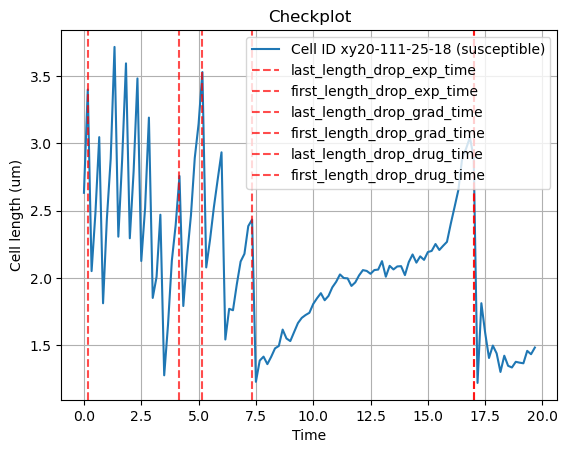

In [47]:
# Checkpoint for vusializing the last and first drops in length 

# Columns to use for vertical lines
timepoint_columns = [
    'last_length_drop_exp_time', 'first_length_drop_exp_time',
    'last_length_drop_grad_time', 'first_length_drop_grad_time',
    'last_length_drop_stat_time', 'first_length_drop_stat_time',
    'last_length_drop_drug_time', 'first_length_drop_drug_time',
    'last_length_drop_recov_time', 'first_length_drop_recov_time'
]

# Make df for each random persister and non_persister
random_non_persister= random.choice(calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['cell_type'] == 'susceptible']['unique_lineage_id'])
df_non_persister = calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['unique_lineage_id'] == random_non_persister]
df_persister = calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['unique_lineage_id'] == random_persister]

# Create a new figure and axis
fig, ax = plt.subplots()

# Plot your data using ax.plot()
ax.plot(df_non_persister['Time'], df_non_persister['Spinelength'], label=f'Cell ID {random_non_persister} (susceptible)')

# Add vertical lines for the specified timepoints for non-persister
for column in timepoint_columns:
    if column in df_non_persister:
        timepoints = df_non_persister[column].dropna().unique()
        for tp in timepoints:
            ax.axvline(x=tp, color='r', linestyle='--', alpha=0.7, label=f'{column}' if tp == timepoints[0] else "")

# Plot data for the random persister
#ax.plot(df_persister['Timer'], df_persister['Spinelength'], label=f'Persister ID {random_persister}')

# Add vertical lines for the specified timepoints for persister
#for column in timepoint_columns:
#    if column in df_persister:
#        timepoints = df_persister[column].dropna().unique()
#        for tp in timepoints:
#            ax.axvline(x=tp, color='b', linestyle='--', alpha=0.7, label=f'{column}' if tp == timepoints[0] else "")


# Add labels, legend, etc.
ax.set_xlabel('Time')
ax.set_ylabel('Cell length (um)')
ax.set_title('Checkplot')
ax.legend()
ax.grid(True)

# Show the plot
plt.show()

### Boxplot lag time & adaptability

/scicore/home/jenal/hernan0000/miniconda3/envs/i2i_env_fluo_res/lib/python3.9/site-packages/numpy/lib/function_base.py:4655: RuntimeWarning: invalid value encountered in subtract
  diff_b_a = subtract(b, a)
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite values
posx and posy should be finite va

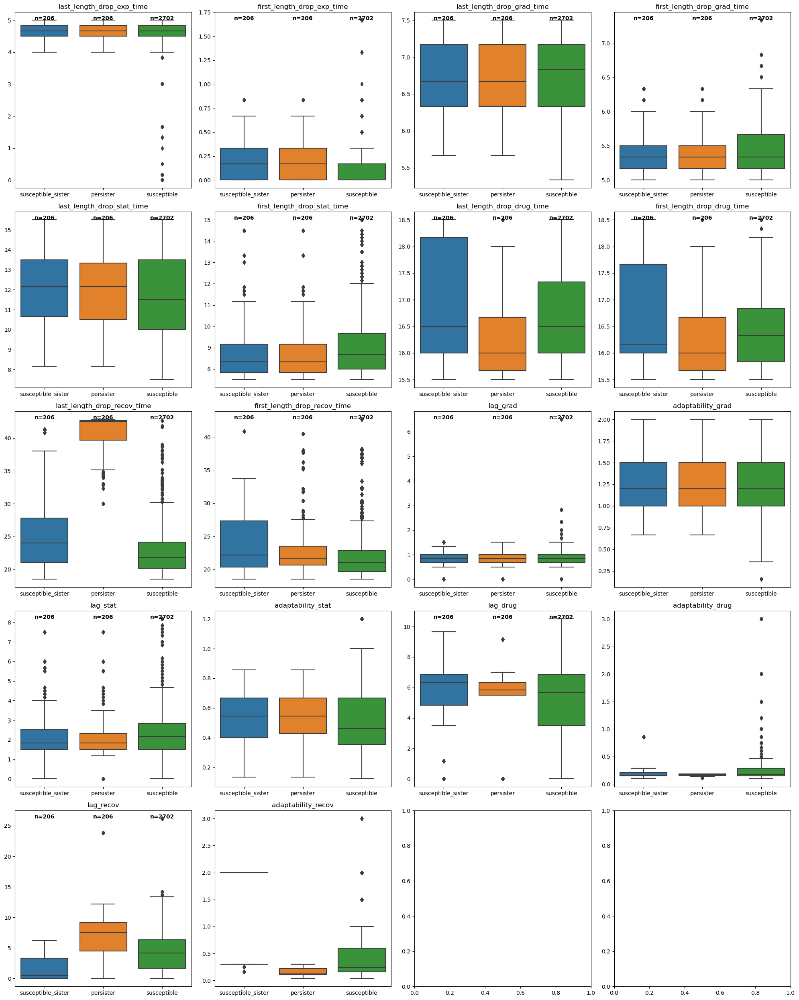

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to add number of unique 'unique_lineage_id' for each 'cell_type'
def add_unique_count(data, ax, variable):
    cell_types = data['cell_type'].unique()
    for cell_type in cell_types:
        unique_count = data[data['cell_type'] == cell_type]['unique_lineage_id'].nunique()
        x_pos = list(cell_types).index(cell_type)
        ax.text(x_pos, data[variable].max(), f'n={unique_count}', 
                horizontalalignment='center', size='medium', color='black', weight='semibold')

# Columns to plot
columns_to_plot = [
    'last_length_drop_exp_time',
    'first_length_drop_exp_time',
    'last_length_drop_grad_time',
    'first_length_drop_grad_time',
    'last_length_drop_stat_time',
    'first_length_drop_stat_time',
    'last_length_drop_drug_time',
    'first_length_drop_drug_time',
    'last_length_drop_recov_time',
    'first_length_drop_recov_time',
    'lag_grad',
    'adaptability_grad',
    'lag_stat',
    'adaptability_stat',
    'lag_drug',
    'adaptability_drug',
    'lag_recov',
    'adaptability_recov'
]

# Ensure 'cell_type' and 'unique_lineage_id' are included for counting
columns_to_plot = ['cell_type', 'unique_lineage_id'] + columns_to_plot
df_to_plot = calc_final_df_right_count_count_division[columns_to_plot]

# Create the figure with more subplots (5 rows by 4 columns)
fig, axes = plt.subplots(nrows=5, ncols=4, figsize=(20, 25))
axes = axes.flatten()

# Plot each variable
for idx, column in enumerate(columns_to_plot[2:]):  # Skip 'cell_type' and 'unique_lineage_id' for plotting
    ax = axes[idx]
    sns.boxplot(x='cell_type', y=column, data=df_to_plot, ax=ax)
    ax.set_title(column)
    ax.set_xlabel('')
    ax.set_ylabel('')

    # Add unique lineage ID count information
    add_unique_count(df_to_plot, ax, column)

plt.tight_layout()
#plt.savefig(proj_dir / 'boxplot_lag_adaptability_phases.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)
# Show the plot
plt.show()


## Boxplot time & number of divisions

In [ ]:
# Filter only 'persister' and 'non-persister' from the 'cell_type' column
only_per_and_nonper_df = calc_final_df_right_count_count_division[
    calc_final_df_right_count_count_division['cell_type'].isin(['persister', 'susceptible'])]

# Calculate number of unique lineage_id for each cell_type
data_during_treatment  = only_per_and_nonper_df[(only_per_and_nonper_df['Frame'] >= 93) & (only_per_and_nonper_df['Frame'] <= 111)] #ensure that we only conunt cells that experienced treatment
unique_lineage_counts = data_during_treatment.groupby('cell_type')['unique_lineage_id'].nunique()
print('unique_lineage_counts', unique_lineage_counts)

# Create a single boxplot for 'last_length_drop_frame' across cell types
plt.figure(figsize=(6, 6))

# Define boxplot properties
boxprops = dict(linewidth=2)
medianprops = dict(color='red', linewidth=2)

# Generate data for boxplot (last_length_drop_frame)
data = [only_per_and_nonper_df[only_per_and_nonper_df['cell_type'] == cell_type]['last_length_drop_stat_time'].dropna()
        for cell_type in unique_lineage_counts.index]

# Create boxplot and capture the artists for customization
bp = plt.boxplot(data, labels=unique_lineage_counts.index, boxprops=boxprops, medianprops=medianprops)

# Annotate each box with the count of unique lineage_id values
for i, box in enumerate(bp['boxes']):
    cell_type = unique_lineage_counts.index[i]
    num_unique_lineage_ids = unique_lineage_counts[cell_type]
    plt.annotate(f'n = {num_unique_lineage_ids}', xy=(box.get_xdata().mean(), box.get_ydata().max()), 
                 xytext=(10, 10), textcoords='offset points', ha='center', fontsize=14)

# Customize plot
plt.title('Time of last cell division before drug tratment ', fontsize=14)
plt.xlabel('Cell Type', fontsize=18)
plt.ylabel('Time (hrs)', fontsize=18)
plt.xticks(fontsize=16)  # Adjusted fontsize for x-axis labels
plt.yticks(fontsize=16)  # Adjusted fontsize for y-axis labels

# Save the plot as an SVG file
plt.savefig(proj_dir/'boxplot_last_length_drop_time.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()


In [ ]:
# Filter only 'persister' and 'non-persister' from the 'cell_type' column
only_per_and_nonper_df = calc_final_df_right_count_count_division[
    calc_final_df_right_count_count_division['cell_type'].isin(['persister', 'susceptible'])]

# Calculate number of unique lineage_id for each cell_type
unique_lineage_counts = only_per_and_nonper_df.groupby('cell_type')['unique_lineage_id'].nunique()

# Create a single boxplot for 'last_length_drop_frame' across cell types
plt.figure(figsize=(6, 6))

# Define boxplot properties
boxprops = dict(linewidth=2)
medianprops = dict(color='red', linewidth=2)

# Generate data for boxplot (last_length_drop_frame)
data = [only_per_and_nonper_df[only_per_and_nonper_df['cell_type'] == cell_type]['cell_cycle_progression'].dropna()
        for cell_type in unique_lineage_counts.index]

# Create boxplot and capture the artists for customization
bp = plt.boxplot(data, labels=unique_lineage_counts.index, boxprops=boxprops, medianprops=medianprops)

# Annotate each box with the count of unique lineage_id values
for i, box in enumerate(bp['boxes']):
    cell_type = unique_lineage_counts.index[i]
    num_unique_lineage_ids = unique_lineage_counts[cell_type]
    plt.annotate(f'n = {num_unique_lineage_ids}', xy=(box.get_xdata().mean(), box.get_ydata().max()), 
                 xytext=(10, 10), textcoords='offset points', ha='center', fontsize=14)

# Customize plot
plt.title('Cell cycle progression at drug treatment', fontsize=14)
plt.xlabel('Cell Type', fontsize=18)
plt.ylabel('Progress to division (%)', fontsize=18)
plt.xticks(fontsize=16)  # Adjusted fontsize for x-axis labels
plt.yticks(fontsize=16)  # Adjusted fontsize for y-axis labels

# Save the plot as an SVG file
plt.savefig(proj_dir/'boxplot_cell_cycle_progression.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

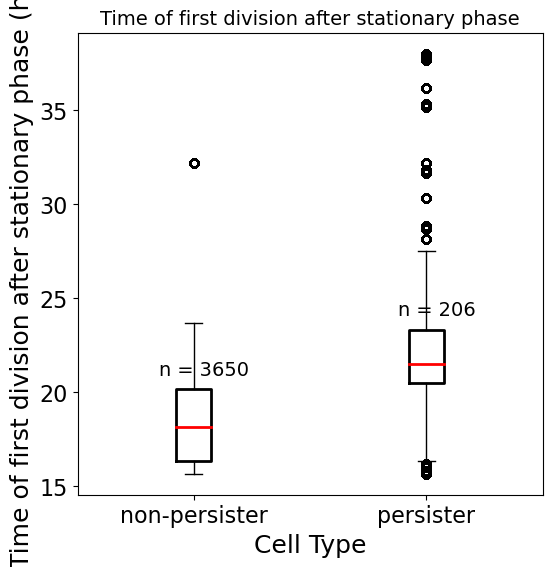

In [82]:
# Filter only 'persister' and 'non-persister' from the 'cell_type' column
only_per_and_nonper_df = calc_final_df_right_count_count_division[
    calc_final_df_right_count_count_division['cell_type'].isin(['persister', 'susceptible'])]

# Calculate number of unique lineage_id for each cell_type
unique_lineage_counts = only_per_and_nonper_df.groupby('cell_type')['unique_lineage_id'].nunique()

# Create a single boxplot for 'last_length_drop_frame' across cell types
plt.figure(figsize=(6, 6))

# Define boxplot properties
boxprops = dict(linewidth=2)
medianprops = dict(color='red', linewidth=2)

# Generate data for boxplot (last_length_drop_frame)
data = [only_per_and_nonper_df[only_per_and_nonper_df['cell_type'] == cell_type]['time_first_div_after_stat'].dropna()
        for cell_type in unique_lineage_counts.index]

# Create boxplot and capture the artists for customization
bp = plt.boxplot(data, labels=unique_lineage_counts.index, boxprops=boxprops, medianprops=medianprops)

# Annotate each box with the count of unique lineage_id values
for i, box in enumerate(bp['boxes']):
    cell_type = unique_lineage_counts.index[i]
    num_unique_lineage_ids = unique_lineage_counts[cell_type]
    plt.annotate(f'n = {num_unique_lineage_ids}', xy=(box.get_xdata().mean(), box.get_ydata().max()), 
                 xytext=(10, 10), textcoords='offset points', ha='center', fontsize=14)

# Customize plot
plt.title('Time of first division after stationary phase', fontsize=14)
plt.xlabel('Cell Type', fontsize=18)
plt.ylabel('Time (hrs)', fontsize=18)
plt.xticks(fontsize=16)  # Adjusted fontsize for x-axis labels
plt.yticks(fontsize=16)  # Adjusted fontsize for y-axis labels

# Save the plot as an SVG file
plt.savefig(proj_dir/'boxplot_time_first_div_after_stat.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()

/scicore/home/jenal/hernan0000/miniconda3/envs/i2i_env_fluo_res/lib/python3.9/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


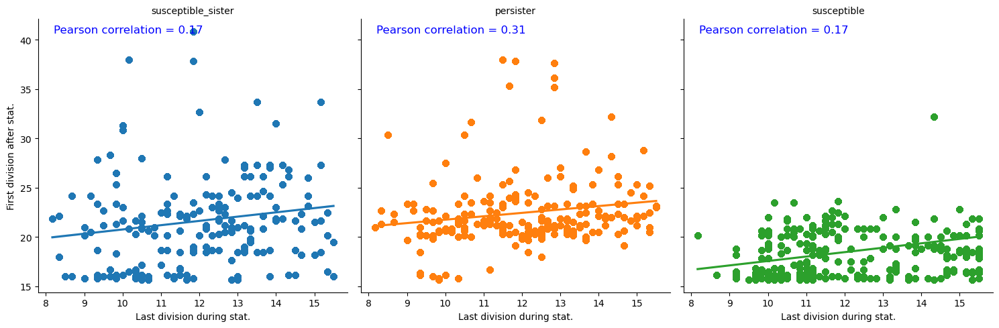

In [44]:
# Drop rows with NaN values in the relevant columns
cleaned_data = calc_final_df_right_count_count_division.dropna(subset=['last_length_drop_stat_time', 'time_first_div_after_stat'])

# Create scatter plots with line of best fit and correlation coefficient
g = sns.lmplot(data=cleaned_data, x='last_length_drop_stat_time', y='time_first_div_after_stat',
               col='cell_type', hue='cell_type', height=5)

# Add titles to each plot
g.set_titles("{col_name}")

# Set axis labels
g.set_axis_labels("Last division during stat.", "First division after stat.")

# Calculate and display Pearson correlation coefficient on each plot
for ax, (_, subdata) in zip(g.axes.flat, cleaned_data.groupby('cell_type')):
    corr_coef = stats.pearsonr(subdata['last_length_drop_stat_time'], subdata['time_first_div_after_stat'])[0]
    ax.annotate(f"Pearson correlation = {corr_coef:.2f}", xy=(0.05, 0.95), xycoords='axes fraction', fontsize=12, color='blue')

# Show the plot
plt.show()

/scratch/hernan0000/slurm-job.55617532/ipykernel_221020/1834855137.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), fontsize=10)  # Adjust fontsize of y-axis tick labels
/scratch/hernan0000/slurm-job.55617532/ipykernel_221020/1834855137.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), fontsize=10)  # Adjust fontsize of y-axis tick labels
/scratch/hernan0000/slurm-job.55617532/ipykernel_221020/1834855137.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), fontsize=10)  # Adjust fontsize of y-axis tick labels
/scratch/hernan0000/slurm-job.55617532/ipykernel_221020/1834855137.py:42: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(ax.get_yticks(), fontsize=10)  # Adjust fontsize of y-axis tick labels


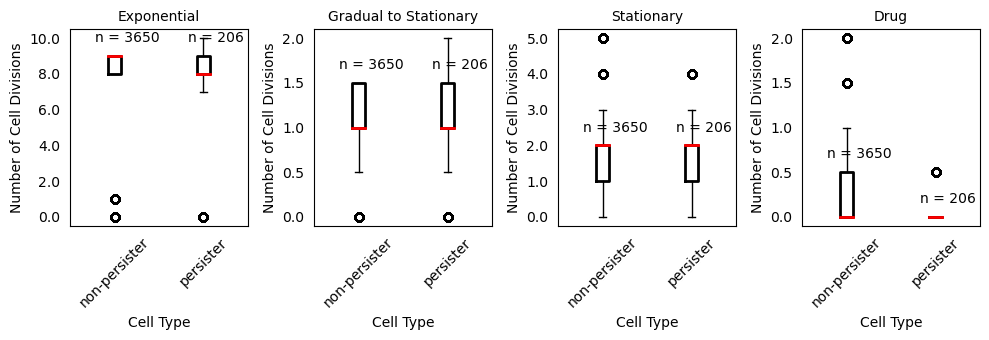

In [84]:
# Filter only 'persister' and 'non-persister' from the 'cell_type' column
only_per_and_nonper_df = calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['cell_type'].isin(['persister', 'susceptible'])]

# Calculate number of unique lineage_id for each cell_type
unique_lineage_counts = only_per_and_nonper_df.groupby('cell_type')['unique_lineage_id'].nunique()

# Create subplots for each cell_type
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 3.5))

# Define boxplot properties
boxprops = dict(linewidth=2)
medianprops = dict(color='red', linewidth=2)

# Iterate over each phase and corresponding axis
for ax, phase, title in zip(axes, ['num_div_exp_phase_length_drop', 'num_div_grad_phase_length_drop', 
                                   'num_div_stat_phase_length_drop', 'num_div_drug_phase_length_drop'], ['Exponential', 'Gradual to Stationary', 'Stationary', 'Drug']):
    
    # Get data for boxplot
    data = [only_per_and_nonper_df[only_per_and_nonper_df['cell_type'] == cell_type][phase].dropna() for cell_type in unique_lineage_counts.index]
    
    # Create boxplot and capture the artists for customization
    bp = ax.boxplot(data, labels=unique_lineage_counts.index, boxprops=boxprops, medianprops=medianprops)
    
    # Annotate each box with the count of unique lineage_id values
    for i, box in enumerate(bp['boxes']):
        cell_type = unique_lineage_counts.index[i]
        num_unique_lineage_ids = unique_lineage_counts[cell_type]
        ax.annotate(f'n = {num_unique_lineage_ids}', xy=(box.get_xdata().mean(), box.get_ydata().max()), 
                    xytext=(10, 10), textcoords='offset points', ha='center', fontsize=10)
    
    ax.set_xlabel('Cell Type', fontsize=10)  # Adjusted x-axis label fontsize
    ax.set_ylabel('Number of Cell Divisions', fontsize=10)  # Adjusted y-axis label fontsize
    ax.set_title(title, fontsize=10)  # Adjusted title fontsize
    
    # Set custom tick labels and tick parameters for x-axis
    ax.set_xticklabels(unique_lineage_counts.index, fontsize=10, rotation=45)  # Rotate and adjust fontsize of x-axis tick labels
    ax.tick_params(axis='x', which='both', bottom=False, top=False)  # Hide x-axis ticks for better appearance
    
    # Set custom tick labels and tick parameters for y-axis
    ax.set_yticklabels(ax.get_yticks(), fontsize=10)  # Adjust fontsize of y-axis tick labels
    ax.tick_params(axis='y', which='both', left=False, right=False)  # Hide y-axis ticks for better appearance

# Set common title
#fig.suptitle('Distribution of Cell Divisions Across Phases', fontsize=18)

# Adjust layout
plt.tight_layout()
plt.savefig(proj_dir/'bp_cell_div_phases.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)

plt.show()


In [ ]:
# Define the experimental phase ranges

phase_ranges = {
    'exp': (0, 30),
    'grad': (30, 45),
    'stat': (45, 93),
    'drug': (93, 111)
}

# Create subplots for each experimental phase
fig, axes = plt.subplots(nrows=1, ncols=len(phase_ranges), figsize=(15, 5))

# Iterate over each phase and plot the boxplot
for i, (phase_name, (start_frame, end_frame)) in enumerate(phase_ranges.items()):
    phase_data = calc_final_df_right_count_count_division[(calc_final_df_right_count_count_division['Frame'] >= start_frame) & (calc_final_df_right_count_count_division['Frame'] <= end_frame)]
    
    # Create boxplot for 'GR' grouped by 'cell_type'
    sns.boxplot(x='cell_type', y='lin_mu_spine', data=phase_data, ax=axes[i])
    axes[i].set_title(f'Phase: {phase_name}')
    axes[i].set_xlabel('Cell Type')
    axes[i].set_ylabel('lin_mu_spine')

# Adjust layout and display the plots
plt.tight_layout()
plt.savefig(proj_dir/'plt_lin_mu_spine.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)


plt.show()


In [ ]:
# Define the experimental phase ranges
phase_ranges = {
    'exp': (0, 30),
    'grad': (30, 45),
    'stat': (45, 93),
    'drug': (93, 111)
}

# Create subplots for each experimental phase
fig, axes = plt.subplots(nrows=1, ncols=len(phase_ranges), figsize=(15, 5))

# Iterate over each phase and plot the boxplot
for i, (phase_name, (start_frame, end_frame)) in enumerate(phase_ranges.items()):
    phase_data = calc_final_df_right_count_count_division[(calc_final_df_right_count_count_division['Frame'] >= start_frame) & (calc_final_df_right_count_count_division['Frame'] <= end_frame)]
    
    # Create boxplot for 'GR' grouped by 'cell_type'
    sns.boxplot(x='cell_type', y='GrowthRateSpinelength', data=phase_data, ax=axes[i])
    axes[i].set_title(f'Phase: {phase_name}')
    axes[i].set_xlabel('Cell Type')
    axes[i].set_ylabel('GrowthRateSpinelength')

# Adjust layout and display the plots
plt.tight_layout()
plt.savefig(proj_dir/'plt_growthrate_length.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)

plt.show()

## Location of cells along the trap right before drug

In [ ]:
# Filter only 'persister' and 'non-persister' from the 'cell_type' column at Frame 93
only_per_and_nonper_atfr93_df = calc_final_df_right_count_count_division[
    (calc_final_df_right_count_count_division['cell_type'].isin(['persister', 'susceptible'])) & 
    (calc_final_df_right_count_count_division['Frame'] == 93)
]

# Calculate number of unique lineage_id for each cell_type at Frame 93
unique_lineage_counts_fr93 = only_per_and_nonper_atfr93_df.groupby('cell_type')['unique_lineage_id'].nunique()

# Create subplots for each cell_type
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 6))

# Define boxplot properties
boxprops = dict(linewidth=2)
medianprops = dict(color='red', linewidth=2)

# Create boxplots for each cell_type at Frame 93
for ax, phase, title in zip(axes, ['RelativeCoordY', 'BoundsYMin', 'BoundsYMax'], ['RelativeCoordY', 'BoundsYMin', 'BoundsYMax']):
    # Get data for boxplot
    data = [only_per_and_nonper_atfr93_df[only_per_and_nonper_atfr93_df['cell_type'] == cell_type][phase].dropna() for cell_type in unique_lineage_counts_fr93.index]
    
    # Create boxplot and capture the artists for customization
    bp = ax.boxplot(data, labels=unique_lineage_counts_fr93.index, boxprops=boxprops, medianprops=medianprops)
    
    # Annotate each box with the count of unique lineage_id values at Frame 93
    for i, box in enumerate(bp['boxes']):
        cell_type = unique_lineage_counts_fr93.index[i]
        num_unique_lineage_ids = unique_lineage_counts_fr93[cell_type]
        ax.annotate(f'n = {num_unique_lineage_ids}', xy=(box.get_xdata().mean(), box.get_ydata().max()), 
                    xytext=(10, 10), textcoords='offset points', ha='center', fontsize=10)
    
    ax.set_xlabel('Cell Type', fontsize=12)
    ax.set_ylabel('Coordinates', fontsize=12)
    ax.set_title(title)  

    # Invert y-axis direction
    ax.invert_yaxis()
    
    # Calculate midpoint of y-axis
    y_mid = (ax.get_ylim()[0] + ax.get_ylim()[1]) / 2
    
    # Draw blue dotted line at the midpoint
    ax.axhline(y_mid, color='blue', linestyle='--')

# Set common title
fig.suptitle('Location of cells along the trap right before drug', fontsize=14)

# Adjust layout
plt.tight_layout()
plt.savefig(proj_dir/'bp_cells_y_coor_frm93.svg', format='svg', dpi=200, bbox_inches='tight', pad_inches=0.2)

# Show the plot
plt.show()


## Checkpoint for length_drop persisters & non-persisters

Frame 2: Spinelength = 2.34226
Frame 5: Spinelength = 2.14465
Frame 8: Spinelength = 2.01498
Frame 12: Spinelength = 2.48437
Frame 15: Spinelength = 2.17261
Frame 20: Spinelength = 2.30472
Frame 24: Spinelength = 2.21724
Frame 29: Spinelength = 2.6175
Frame 32: Spinelength = 1.98349
Frame 38: Spinelength = 1.58255
Frame 44: Spinelength = 1.24698
Frame 64: Spinelength = 1.15417
Frame 120: Spinelength = 2.501


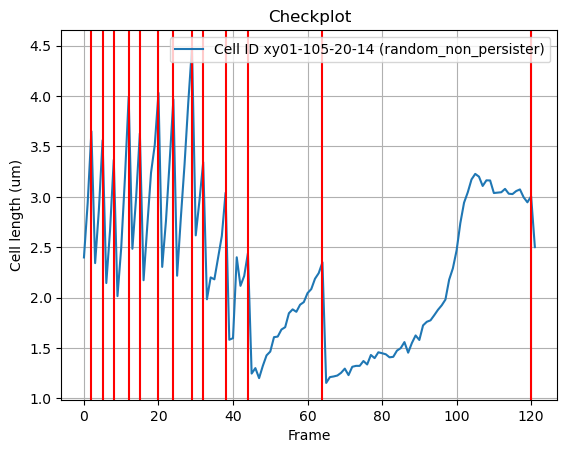

In [67]:

# Make df for each random persister and non_persister
df_non_persister = calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['unique_lineage_id'] == random_non_persister]
df_persister = calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['unique_lineage_id'] == random_persister]

# Create a new figure and axis
fig, ax = plt.subplots()

# Plot your data using ax.plot()
ax.plot(df_non_persister['Frame'], df_non_persister['Spinelength'], label=f'Cell ID {random_non_persister} (random_non_persister)')

# Find cell division frames using drops in length for plotting as vertical lines
length_drop_cell_div = [frame for frame, ld in enumerate(df_non_persister['length_drop']) if ld == 1]

# Print Spinelength values corresponding to frames in length_drop_cell_div
for frame in length_drop_cell_div:
    spinelength_value = df_non_persister.loc[df_non_persister['Frame'] == frame +1, 'Spinelength'].values
    if len(spinelength_value) > 0:
        print(f"Frame {frame}: Spinelength = {spinelength_value[0]}")
    else:
        print(f"No Spinelength value found for Frame {frame}")


# Alternatively plot PreviousDivisionFrame as vertical lines
PrevDivFrm_non_persister = df_non_persister['PreviousDivisionFrame'].dropna()
unique_PrevDivFrm_non_persister = np.unique(PrevDivFrm_non_persister)

# Add vertical lines for cell division frames
for f in length_drop_cell_div:
    ax.axvline(x=f, color='r', linestyle='-')

# Add labels, legend, etc.
ax.set_xlabel('Frame')
ax.set_ylabel('Cell length (um)')
ax.set_title('Checkplot')
ax.legend()
ax.grid(True)

# Show the plot
plt.show()


# Size-regulation strategies

Bakshi et al. (2021), probed the size-regulation principles during entry into and exit from stationary phase, and demonstrated trade-offs between the behaviors entering and exiting stationary phase. To do so they used "Pearson correlation coefficient (C) between cell size at birth (Lbirth) and division (Ldiv). The correlation metric spans a continuum of phenotypes, where the classic modes of timer, sizer, and adder corresponds to three specific values (C = 1, C = 0, C = 0.5)". We will do such measurements next.

In [ ]:
#calc_final_df[['SizeAtBirthSpinelength', 'SizeAtBirthFeretMax', 'length_drop', 'Frame', 'Spinelength', 'SizeAtDivSpinelength' ]]

In [108]:
# Filter 'non-persisters'
non_persister_group_df = calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['cell_type']=='susceptible']
# Get unique lineage ids of 'non-persisters'
unique_lineage_id_non_persisters=list(non_persister_group_df.loc[non_persister_group_df['cell_type'] == 'susceptible','unique_lineage_id'].unique())

# Filter 'persister'
persister_group_df = calc_final_df_right_count_count_division[calc_final_df_right_count_count_division['cell_type']=='persister']
# Get unique lineage ids of 'persisters'
unique_lineage_id_persisters=list(persister_group_df.loc[persister_group_df['cell_type'] == 'persister','unique_lineage_id'].unique())

## Persisters

In [99]:
# Pearson R over time (under development)
from scipy.stats import pearsonr

groups_calc_final_df = persister_group_df.groupby('unique_lineage_id')
rows = []

for group_name, group_df in groups_calc_final_df:
    #size_birth = group_df['SizeAtBirthSpinelength']
    #print("size_birth", size_birth)
    #size_nextdivframe = group_df.loc[~group_df['NextDivisionFrame'].isnull(), 'Spinelength'].tolist()
    #print("size_nextdivframe", size_nextdivframe)
    #size_previousdivframe = group_df.loc[~group_df['PreviousDivisionFrame'].isnull(), 'Spinelength'].tolist()
    #print("size_previousdivframe", size_previousdivframe)
    #size_droplength = group_df.loc[group_df['length_drop'] ==1 , 'Spinelength'].tolist()
    #print("size_droplength", size_droplength)
    #print(group_df['cell_type'].unique())
    #non_nan_values = group_df['PreviousDivisionFrame'].dropna() # NP
    frames_length_drop = list(group_df.loc[group_df['length_drop'] == 1, 'Frame'].unique()) # Find frames at which a drop in length occurs
    #print(length_drop_frame)

    # Get unique non-NaN values
    #length_drop_cell_div = np.unique(non_nan_values) # NP
    #print(length_drop_cell_div)
    
    # Filter out rows where 'Frame' is not NaN
    frames_length_drop_div = np.array(frames_length_drop) # convert to array
    
    #print('frames_length_drop_div',frames_length_drop_div)
    #print('frames_length_drop_birth',frames_length_drop_birth)
    
    #prev_division_length_df = group_df[group_df['Frame'].isin(length_drop_cell_div)] # length_drop_cell_div is prev_division_length, perhaps 1 more value than length_drop_cell_div # NP
    #print(prev_division_length_df)
    #birth_length_df = group_df[group_df['Frame'].isin(length_drop_cell_birth)] # length_drop_cell_div + 1 is birth_length # NP
    #print('birth_length_dfFrame', birth_length_df['Frame'])
    
    # Find frame of entry to stat phase at which first length drop occurs
    entry_to_stat_index_div = np.where(frames_length_drop_div > 33)[0][1] # get index of the second value > 33. This is the first divisions of the cell born after 33
    entry_to_stat_index_birth = np.where(frames_length_drop_div > 33)[0][0]  # Get index of 1st drop after frame 330
    entry_to_stat_frame_div = frames_length_drop_div[entry_to_stat_index_div] # get frame of 1st drop after frame 33
    entry_to_stat_frame_birth = frames_length_drop_div[entry_to_stat_index_birth] + 1 # add 1 to get the length at first birth after frame 33
    
    # Find frame of exit to stat phase at which last length drop occurs
    indices = np.where(frames_length_drop_div < 93)[0]
    if len(indices) > 0:
        exit_to_stat_index_div = indices[-1]
        exit_to_stat_index_birth = indices[-2] if len(indices) > 1 else None
        exit_to_stat_frame_div = frames_length_drop_div[exit_to_stat_index_div]
    else:
        # Handle the case where no elements meet the condition
        print("No elements found with value < 93")

    #exit_to_stat_index_div = np.where(frames_length_drop_div < 93)[0][-1] # get index of the last value < 93. This is the last length drop before drug treatment
    #exit_to_stat_index_birth = np.where(frames_length_drop_div < 93)[0][-2] # get index of the last value < 93. This is the last length drop before drug treatment
    #exit_to_stat_frame_div = frames_length_drop_div[exit_to_stat_index_div]
    #exit_to_stat_frame_birth = frames_length_drop_div[exit_to_stat_index_birth] + 1 # substract 1 to get the length at the last birth before frame 93
    
    frames_of_interest = [entry_to_stat_frame_birth, entry_to_stat_frame_div, exit_to_stat_frame_birth, exit_to_stat_frame_div]
    #print(frames_of_interest)
    
    # Print 'Spinelength' column for the filtered rows
    #birth_length['Spinelength'].describe()
    
    # Ensure prev_division_length_values and birth_length_values are arrays
    #prev_division_length_values = np.array(prev_division_length['Spinelength'])
    #print('prev_division_length_values', prev_division_length_values)
    #birth_length_values = np.array(birth_length['Spinelength'])
    #print('birth_length_values', birth_length_values)

    # Get the length at birth and at division at frame of entry to stat phase
    # Filter prev_division_length_df based on frames_of_interest
    df_frames_of_interest = group_df[group_df['Frame'].isin(frames_of_interest)]
    
    # Get the 'Spinelength' column from the filtered DataFrame
    spinelength_frames_of_interest = df_frames_of_interest['Spinelength'].tolist()
    
    #print(spinelength_frames_of_interest)
    
    # Create a dictionary for the current row
    row_dict = {
    'entry_to_stat_frame_birth': entry_to_stat_frame_birth,
    'entry_to_stat_frame_div': entry_to_stat_frame_div,
    'exit_to_stat_frame_birth': exit_to_stat_frame_birth,
    'exit_to_stat_frame_div': exit_to_stat_frame_div,
    }
    
    # Check if spinelength_frames_of_interest has enough elements before accessing them
    if len(spinelength_frames_of_interest) >= 4:
        row_dict['entry_to_stat_length_birth'] = spinelength_frames_of_interest[0]
        row_dict['entry_to_stat_length_div'] = spinelength_frames_of_interest[1]
        row_dict['exit_to_stat_length_birth'] = spinelength_frames_of_interest[2]
        row_dict['exit_to_stat_length_div'] = spinelength_frames_of_interest[3]
    else:
        # Handle the case where spinelength_frames_of_interest does not have enough elements
        # For example, you could assign None to these columns
        row_dict['entry_to_stat_length_birth'] = None
        row_dict['entry_to_stat_length_div'] = None
        row_dict['exit_to_stat_length_birth'] = None
        row_dict['exit_to_stat_length_div'] = None
    
    # Append the dictionary to the list of rows
    rows.append(row_dict)

# Convert the list of dictionaries into a DataFrame
result_df = pd.DataFrame(rows)

# Print the resulting DataFrame
print(result_df.head())

    

No elements found with value < 93
   entry_to_stat_frame_birth  entry_to_stat_frame_div  \
0                         36                       44   
1                         36                       41   
2                         40                       50   
3                         39                       46   
4                         36                       43   

   exit_to_stat_frame_birth  exit_to_stat_frame_div  \
0                        42                      58   
1                        42                      78   
2                        42                      69   
3                        42                      89   
4                        42                      59   

   entry_to_stat_length_birth  entry_to_stat_length_div  \
0                     1.35012                   2.22941   
1                     1.70740                   2.77093   
2                     1.20908                   1.48645   
3                     2.04136                   2.38966 

In [144]:
# Pearson R of length at birth & length at div at the entry & exit to stationary phase (check, results depend on using if else)
from scipy.stats import pearsonr

# Filter 'non-persisters'
non_persister_group_df = final_df[final_df['cell_type']=='susceptible']
# Get unique lineage ids of 'non-persisters'
unique_lineage_id_non_persisters=list(non_persister_group_df.loc[non_persister_group_df['cell_type'] == 'susceptible','unique_lineage_id'].unique())

# Filter 'persister'
persister_group_df = final_df[final_df['cell_type']=='persister']
# Get unique lineage ids of 'persisters'
unique_lineage_id_persisters=list(persister_group_df.loc[persister_group_df['cell_type'] == 'persister','unique_lineage_id'].unique())

groups_calc_final_df = non_persister_group_df.groupby('unique_lineage_id') # issue I use calc_final_df_right_count_count_division why?
rows = []

for group_name, group_df in groups_calc_final_df:
    frames_length_drop = list(group_df.loc[group_df['length_drop'] == 1, 'Frame'].unique()) # Find frames at which a drop in length occurs
    frames_length_drop_div = np.array(frames_length_drop) # convert to array
        
    # Find frame of entry to stat phase at which first length drop occurs
    entry_to_stat_index_div = np.where(frames_length_drop_div > 33)[0][1] # get index of the second value > 33. This is the first divisions of the cell born after 33
    entry_to_stat_index_birth = np.where(frames_length_drop_div > 33)[0][0]  # Get index of 1st drop after frame 33
    entry_to_stat_frame_div = frames_length_drop_div[entry_to_stat_index_div] # get frame of 1st drop after frame 33
    entry_to_stat_frame_birth = frames_length_drop_div[entry_to_stat_index_birth] + 1 # add 1 to get the length at first birth after frame 33
    
    # Find frame of exit to stat phase at which last length drop occurs
    indices = np.where(frames_length_drop_div < 93)[0]
    if len(indices) > 0:
        exit_to_stat_index_div = indices[-1]
        exit_to_stat_index_birth = indices[-2] if len(indices) > 1 else None
        exit_to_stat_frame_div = frames_length_drop_div[exit_to_stat_index_div]
    else:
        # Handle the case where no elements meet the condition
        print("No elements found with value < 93")

    
    frames_of_interest = [entry_to_stat_frame_birth, entry_to_stat_frame_div, exit_to_stat_frame_birth, exit_to_stat_frame_div]
    
    # Filter prev_division_length_df based on frames_of_interest
    df_frames_of_interest = group_df[group_df['Frame'].isin(frames_of_interest)]
    
    # Get the 'Spinelength' column from the filtered DataFrame
    spinelength_frames_of_interest = df_frames_of_interest['Spinelength'].tolist()
    
    # Create a dictionary for the current row
    row_dict = {
    'entry_to_stat_frame_birth': entry_to_stat_frame_birth,
    'entry_to_stat_frame_div': entry_to_stat_frame_div,
    'exit_to_stat_frame_birth': exit_to_stat_frame_birth,
    'exit_to_stat_frame_div': exit_to_stat_frame_div,
    }
    
    # Check if spinelength_frames_of_interest has enough elements before accessing them
    if len(spinelength_frames_of_interest) >= 4:
        row_dict['entry_to_stat_length_birth'] = spinelength_frames_of_interest[0]
        row_dict['entry_to_stat_length_div'] = spinelength_frames_of_interest[1]
        row_dict['exit_to_stat_length_birth'] = spinelength_frames_of_interest[2]
        row_dict['exit_to_stat_length_div'] = spinelength_frames_of_interest[3]
    else:
        # Handle the case where spinelength_frames_of_interest does not have enough elements
        # For example, you could assign None to these columns
        row_dict['entry_to_stat_length_birth'] = None
        row_dict['entry_to_stat_length_div'] = None
        row_dict['exit_to_stat_length_birth'] = None
        row_dict['exit_to_stat_length_div'] = None
    
    # Append the dictionary to the list of rows
    rows.append(row_dict)

# Convert the list of dictionaries into a DataFrame
result_df = pd.DataFrame(rows)

IndexError: index 1 is out of bounds for axis 0 with size 0

### Pearson Correlation

In [143]:
from scipy.stats import pearsonr

# Drop rows with NaN or infinite values in either column
result_df_clean = result_df.dropna(subset=['entry_to_stat_length_birth', 'entry_to_stat_length_div'])
result_df_clean = result_df_clean.replace([np.inf, -np.inf], np.nan).dropna()

# Calculate Pearson correlation coefficient and p-value for entry_to_stat_length_birth vs entry_to_stat_length_div
correlation_coefficient_entry, p_value_entry = pearsonr(result_df_clean['entry_to_stat_length_birth'], result_df_clean['entry_to_stat_length_div'])

# Calculate Pearson correlation coefficient and p-value for exit_to_stat_length_birth vs exit_to_stat_length_div
correlation_coefficient_exit, p_value_exit = pearsonr(result_df_clean['exit_to_stat_length_birth'], result_df_clean['exit_to_stat_length_div'])

# Print the correlation coefficients and p-values
print("Pearson correlation coefficient for entry_to_stat_length_birth vs entry_to_stat_length_div:", correlation_coefficient_entry)
print("P-value for entry_to_stat_length_birth vs entry_to_stat_length_div:", p_value_entry)

print("Pearson correlation coefficient for exit_to_stat_length_birth vs exit_to_stat_length_div:", correlation_coefficient_exit)
print("P-value for exit_to_stat_length_birth vs exit_to_stat_length_div:", p_value_exit)


Pearson correlation coefficient for entry_to_stat_length_birth vs entry_to_stat_length_div: 0.6405057051803195
P-value for entry_to_stat_length_birth vs entry_to_stat_length_div: 8.844171212739268e-21
Pearson correlation coefficient for exit_to_stat_length_birth vs exit_to_stat_length_div: 0.2486326078361843
P-value for exit_to_stat_length_birth vs exit_to_stat_length_div: 0.0011549733509934447


## Non-persisters

### Test

In [70]:
# Assuming df_non_persister is your DataFrame
prev_division_length = df_persister[df_persister['Frame'].isin(unique_PrevDivFrm_non_persister)] # length_drop_cell_div is prev_division_length
birth_length = df_persister[df_persister['Frame'].isin(unique_PrevDivFrm_non_persister+1)] # length_drop_cell_div + 1 is birth_length

# Print 'Spinelength' column for the filtered rows
birth_length['Spinelength'].describe()

count    14.000000
mean      2.659294
std       0.588063
min       1.599990
25%       2.108470
50%       2.812495
75%       3.166867
max       3.353240
Name: Spinelength, dtype: float64

### Real

In [ ]:
# Size-regulation strategies
group_dfs_for_pearson = []
groups_lineage_id_pearson = calc_final_df.groupby('unique_lineage_id')
for group_name, group_df in groups_lineage_id_pearson:
    size_birth = group_df['SizeAtBirthSpinelength']
    print("size_birth", size_birth)
    size_nextdivframe = group_df.loc[~group_df['NextDivisionFrame'].isnull(), 'Spinelength'].tolist()
    print("size_nextdivframe", size_nextdivframe)
    size_previousdivframe = group_df.loc[~group_df['PreviousDivisionFrame'].isnull(), 'Spinelength'].tolist()
    print("size_previousdivframe", size_previousdivframe)
    size_droplength = group_df.loc[group_df['length_drop'] ==1 , 'Spinelength'].tolist()
    print("size_droplength", size_droplength)

group_dfs_for_pearson.append(group_df)

# Concatenate all DataFrames in group_dfs into a single DataFrame
calc_final_df_pearson = pd.concat(group_dfs_for_pearson)

# Extract data recursively from Frame windows

In [ ]:
final_df.columns

In [48]:
# This version is doing exactly what pablo wants

df_stat_phase = calc_final_df_right_count_count_division.copy()
# Filter the DataFrame based on the range of 'Frame' values
df_stat_phase = df_stat_phase[(df_stat_phase['Frame'] >= 30) & (df_stat_phase['Frame'] <= 111)]
# Filter the DataFrame based on the initial range of 'frames'
lower_limit_frame = 30
upper_limit_frame = 93

path = proj_dir

# Make a directory to store subset dataframes
if not os.path.exists("df_subsets_2022-05-26_produced_2024-05-23"):
    os.makedirs("df_subsets_2022-05-26_produced_2024-05-23")

# Define the frame interval and initial window size
step_size =  1
min_window_size = 6
max_window_size = upper_limit_frame - lower_limit_frame # Maximum value for 'frames' in your filter

for window_size in range(min_window_size, max_window_size, step_size):
    frame_range = [frms for frms in range(upper_limit_frame, upper_limit_frame - window_size, -step_size)]
    print(frame_range)
    frms_min= min(frame_range)
    #print(frms_min)
    frms_max= max(frame_range)
    #print(frms_max)
    
    df_subset = df_stat_phase[df_stat_phase['Frame'].isin(frame_range)]
    #print([df_subset['frames']])

    result = df_subset.groupby('cell_type')['unique_lineage_id'].nunique().reset_index(name='unique_id_count')
    # Display the result
    print(result)
    
    df_subset= calculations_windows(df_subset)
    
    # Count the number of NaN values in the 'PreviousDivisionFrame' column for each group
    num_div_window_counts = df_subset.groupby('unique_lineage_id')['length_drop'].sum()
    
    # Merge the unique counts back into the subset DataFrame
    df_subset = df_subset.merge(num_div_window_counts, on='unique_lineage_id', suffixes=('', '_div_window_counts'))

    # Count the number of length drops (>10) for each 'id_cell'
    #num_len_drops = df_subset[df_subset['dl'] > 10].groupby('id_cell').size().rename('num_len_drops')
    #print(num_len_drops)

    result2 = df_subset.groupby('cell_type')['unique_lineage_id'].nunique().reset_index(name='unique_lineage_id_window_count')
    # Display the result
    print(result2)
    

    # Define the filename for the CSV file
    file_name = f"df_subsets_2022-05-26_produced_2024-05-23/df_subset_{frms_min}_to_{frms_min + window_size - 1}.csv"

    # Save the df_subset as a CSV file in the directory
    #df_subset.to_csv(file_name, index=False)
    #df_subset.to_excel(file_name, index=False)
    df_subset.to_csv(proj_dir / file_name, index=False) #save file

    # Print a message to confirm the file has been saved
    print(f"Saved {file_name}")
    

[93, 92, 91, 90, 89, 88]
            cell_type  unique_id_count
0           persister              206
1         susceptible             3636
2  susceptible_sister              204
            cell_type  unique_lineage_id_window_count
0           persister                             206
1         susceptible                            3636
2  susceptible_sister                             204
Saved df_subsets_2022-05-26_produced_2024-05-23/df_subset_88_to_93.csv
[93, 92, 91, 90, 89, 88, 87]
            cell_type  unique_id_count
0           persister              206
1         susceptible             3636
2  susceptible_sister              204
            cell_type  unique_lineage_id_window_count
0           persister                             206
1         susceptible                            3636
2  susceptible_sister                             204
Saved df_subsets_2022-05-26_produced_2024-05-23/df_subset_87_to_93.csv
[93, 92, 91, 90, 89, 88, 87, 86]
            cell_type  uniq

KeyboardInterrupt: 

# Supplementary

## Checkpoint: compare truth persister vs built persister

In [ ]:
# Get data from prev_dict
key = next(iter(prev_dict))  # Get the key
datat = prev_dict[key]       # Get the value

import pandas as pd
dfb = pd.DataFrame(datat)

truth_persister_lin = set(data_persisters['BacteriaLineage']) #truth persister 
print(truth_persister_lin)
build_persister_lin = set(dfb["BacteriaLineage"]) #build persister
print(build_persister_lin)

# Compare data from prev_dict with truthBacteriaLineage
missing_lin = truth_persister_lin - build_persister_lin
print('Lin in truth lin but not in build lin', missing_lin)
missing_data = data_persisters[(data_persisters['BacteriaLineage'].isin(missing_lin)) & (data_persisters["Frame"] >= 40) & (data_persisters["Frame"] <= 94)]
print('Frames where different data lies:', missing_data['Frame'].unique())

# Check build_persister linages withint the Frames where different data lies
build_persister_fil = dfb[(dfb["Frame"] >= 40) & (dfb["Frame"] <= 93)]
print('build_persister_fil:', build_persister_fil['BacteriaLineage'].unique())
print('build_persister_fil Frames:', build_persister_fil['Frame'].unique())

pb= set(['AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHTT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHHT', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHHH', 'AHHHHHHHHHH', 'AHHHHHHHHHH', 'AHHHHHHHHHH', 'AHHHHHHHHHH', 'AHHHHHHHHHH', 'AHHHHHHHHHH', 'AHHHHHHHHH', 'AHHHHHHHHH', 'AHHHHHHHHH', 'AHHHHHHHHH', 'AHHHHHHHH', 'AHHHHHHHH', 'AHHHHHHHH', 'AHHHHHHHH', 'AHHHHHHHH', 'AHHHHHHH', 'AHHHHHHH', 'AHHHHHHH', 'AHHHHHH', 'AHHHHHH', 'AHHHHHH', 'AHHHHHH', 'AHHHHH', 'AHHHHH', 'AHHHHH', 'AHHHH', 'AHHHH', 'AHHHH', 'AHHHH', 'AHHH', 'AHHH', 'AHHH', 'AHH', 'AHH', 'AHH', 'AH', 'AH', 'AH', 'A'])
print(len(pb))
pt=set(['AH', 'AHH', 'AHHH', 'AHHHH', 'AHHHHH', 'AHHHHHH', 'AHHHHHHH', 'AHHHHHHHH', 'AHHHHHHHHH', 'AHHHHHHHHHH', 'AHHHHHHHHHHT', 'AHHHHHHHHHHTH', 'AHHHHHHHHHHTHT', 'AHHHHHHHHHHHTT'])
print(len(pt))
print(pt-pb)
#print(pb-pt)

## Ancestry reconstruction removing last letter of BacteriaLineage 

The following function and code works but needs to be put in a loop that iterates "Frame" backwards

In [229]:
# Function for reconstructing bacteria lineages forth using data from reconstruction backwards as start point
def reconstruct_full_BacteriaLineages(channel_df, filtered_lineage_df, lineage, reconstructed_lineage_forth, reconstructed_lineage_back):
    filtered_lineage_dfs = []
    lineage_dict = {}
    start_lineage = lineage
    
    if (filtered_lineage_df['BacteriaLineage'] == start_lineage).any():
        frames_full_lineage_exists = max(filtered_lineage_df['Frame'])   
        last_lineage_idx = filtered_lineage_df[(filtered_lineage_df['BacteriaLineage'] == start_lineage) & (filtered_lineage_df['Frame'] == max(frames_full_lineage_exists))]['Indices'].iloc[0]
        next_BacteriaLineages = channel_df[(channel_df['Prev'] == last_lineage_idx)]['BacteriaLineage'].tolist()
        reconstructed_lineage_forth = reconstructed_lineage_back.copy()
    
    if not next_BacteriaLineages:  # Base case: If there are no next lineages, stop recursion
        full_lineage=  channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_back)]
        lineage_dict['full_lineage'] = full_lineage
        #print('not next_BacteriaLineages', full_lineage, reconstructed_lineage_back)
        return full_lineage #f'Forth lineage not found, this is reconstructed lineage back: {reconstructed_lineage_back}' 
    
    next_BacteriaLineages2 = next_BacteriaLineages.copy()
    for next_lineage in next_BacteriaLineages2:
        if next_lineage:
            #print('next_lineage', next_lineage)
            # Filter the data for the next lineage
            reconstructed_lineage_forth2 = reconstructed_lineage_forth.copy() # copying dataset removes duplicated lineages in new reconstructed lienages
            reconstructed_lineage_forth2.insert(0, next_lineage)
            #print('reconstructed_lineage_forth', reconstructed_lineage_forth2)
            # Filter the data for the next lineage
            filtered_lineage_forth_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_forth)]
            frames_full_lineage_forth_exists = filtered_lineage_forth_df["Frame"].tolist()
            #print('max(frames_full_lineage_forth_exists)', max(frames_full_lineage_forth_exists))

            # Filter the DataFrame based on conditions
            filtered_lineage_forth_df = filtered_lineage_forth_df[(filtered_lineage_forth_df['BacteriaLineage'] == next_lineage)& (filtered_lineage_forth_df['Frame'] == max(frames_full_lineage_forth_exists))]
            #print('filtered_lineage_forth_df_before', filtered_lineage_forth_df)
            
            # Check if there are any values in filtered_lineage_forth_df
            if not filtered_lineage_forth_df.empty:
                #print('filtered_lineage_forth_df', filtered_lineage_forth_df['Indices'])
                last_lineage_forth_idx = filtered_lineage_forth_df['Indices'].iloc[0]
                next_BacteriaLineages2 = channel_df[(channel_df['Prev'] == last_lineage_forth_idx)]['BacteriaLineage'].tolist()
                #print('next_BacteriaLineages2', next_BacteriaLineages2)
                # Recursively call the function for the next lineage
                filtered_lineage_dfs.append(filtered_lineage_forth_df)
                lineage = next_lineage
                full_lineage = filtered_lineage_forth_df
                full_lineage.extend(reconstruct_full_BacteriaLineages(channel_df, filtered_lineage_df, lineage, reconstructed_lineage_forth2))
                lineage_dict['full_lineage'] = full_lineage
                #print('reconstructed_lineage_forth2 if reconsturction is occuring', reconstructed_lineage_forth2)
                return full_lineage
            else:
                full_lineage = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_forth2)]
                lineage_dict['full_lineage'] = full_lineage
                #print('reconstructed_lineage_forth2 if reconsturction is NOT occuring', reconstructed_lineage_forth2)
                return full_lineage


In [ ]:
# Working version
filtered_df = df_nonpersisters.copy() #df[(df['Frame'] >= 0) & (df['Frame'] <= 250)] # for tests
frame_range = list(range(111))
positions = [1]
channels=[1]
lineage_dict = {}# Create an empty dictionary

# Position data
for position in positions:
    position_df = filtered_df[filtered_df['PositionIdx'] == position]
    #print('Position Idx:', position_df['PositionIdx'].unique())

    # Microchannel data
    microchannels = position_df['ChannelIdx'].unique()
    for channel in channels: 
        channel_df = position_df[position_df['ChannelIdx'] == channel]
        print('Channel Idx:', channel_df['ChannelIdx'].unique())

        # Filter lineages that experienced drug tratment
        treated_lineages = channel_df.loc[channel_df['Frame'] == 90, 'BacteriaLineage']
        #treated_lineages = list(drug_frm_range['BacteriaLineage'].unique())
        treated_lin_id_str = channel_df.loc[channel_df['Frame'] == 90, 'lin_id_str'] 
        print('Treated Lineages:', len(treated_lineages), list(treated_lineages))
        print('treated_lin_id_str:', len(treated_lin_id_str), list(treated_lin_id_str))

        # Data of treated lineages
        for index, lineage in enumerate(treated_lineages):
            # Reconstruct lineage backwards by removing a letter from each BacteriaLineage
            reconstructed_lineage_back = [lineage[:i] for i in range(len(lineage), 0, -1)]
            print('Reconstructed lineage back:', reconstructed_lineage_back)
            
            # Filter a df that includes the data of all lineages in reconstructed lineage 
            filtered_lineage_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_back)]
            print(filtered_lineage_df['Frame'])

            # Add temporary unique_lineage_id
            full_lineage_id = treated_lin_id_str.iloc[index] # ID of full lineage that experience treatment
            filtered_lineage_df['temp_full_lineage_id'] = full_lineage_id # add to df
            #print('full_lineage_id', full_lineage_df['full_lineage_id'].unique)
            # print(filtered_lineage_df[['Frame', 'Next', 'Prev','Indices','BacteriaLineage', 'NextDivisionFrame']])
            # lineage_key = f'{position}-{"-".join(reconstructed_lineage_back)}'

            # Checkpoint: existence of lineages
            frames_full_lineage_exists = filtered_lineage_df["Frame"].tolist()
            missing_frames_lineage = [frame for frame in frame_range if frame not in frames_full_lineage_exists]

            print(filtered_lineage_df['temp_full_lineage_id'])

            plt.plot(filtered_lineage_df['Frame'], filtered_lineage_df['Spinelength'], linestyle='-') 


In [ ]:
# Working version
filtered_df = df_nonpersisters.copy() #df[(df['Frame'] >= 0) & (df['Frame'] <= 250)] # for tests
frame_range = list(range(111))
positions = [1]
channels=[1]
lineage_dict = {}# Create an empty dictionary

# Position data
for position in positions:
    position_df = filtered_df[filtered_df['PositionIdx'] == position]
    #print('Position Idx:', position_df['PositionIdx'].unique())

    # Microchannel data
    microchannels = position_df['ChannelIdx'].unique()
    for channel in channels: 
        channel_df = position_df[position_df['ChannelIdx'] == channel]
        print('Channel Idx:', channel_df['ChannelIdx'].unique())

        # Filter lineages that experienced drug tratment
        drug_frm_range = channel_df[(channel_df['Frame'] == 90)]
        treated_lineages = drug_frm_range['BacteriaLineage']
        treated_lin_id_str = drug_frm_range['lin_id_str']
        print('Treated Lineages:', len(treated_lineages), treated_lineages)
        print('treated_lin_id_str:', len(treated_lin_id_str), treated_lin_id_str)

        # Data of treated lineages
        for index, lineage in enumerate(treated_lineages):
            # Reconstruct lineage backwards by removing a letter from each BacteriaLineage
            reconstructed_lineage_back = [lineage[:i] for i in range(len(lineage), 0, -1)]
            print('Reconstructed lineage back:', reconstructed_lineage_back)
            
            # Filter a df that includes the data of all lineages in reconstructed lineage 
            filtered_lineage_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_back)]
            print(filtered_lineage_df['Frame'])

            # Add temporary unique_lineage_id
            full_lineage_id = treated_lin_id_str.iloc[index] # ID of full lineage that experience treatment
            filtered_lineage_df['temp_full_lineage_id'] = full_lineage_id # add to df
            #print('full_lineage_id', full_lineage_df['full_lineage_id'].unique)
            # print(filtered_lineage_df[['Frame', 'Next', 'Prev','Indices','BacteriaLineage', 'NextDivisionFrame']])
            # lineage_key = f'{position}-{"-".join(reconstructed_lineage_back)}'

            # Checkpoint: existence of lineages
            frames_full_lineage_exists = filtered_lineage_df["Frame"].tolist()
            missing_frames_lineage = [frame for frame in frame_range if frame not in frames_full_lineage_exists]

            print(filtered_lineage_df['temp_full_lineage_id'])

            plt.plot(filtered_lineage_df['Frame'], filtered_lineage_df['Spinelength'], linestyle='-') 

           
plt.figure(figsize=(10, 6))  # Set figure size for each plot
for name, df in lineage_dict.items():
    print(name)
    #non_null_prev_div_frames = df.loc[~df['PreviousDivisionFrame'].isnull(), 'PreviousDivisionFrame']
    #non_null_next_div_frames = df.loc[~df['NextDivisionFrame'].isnull(), 'NextDivisionFrame']
    #print('max(non_null_prev_div_frames)', max(non_null_prev_div_frames))
    #print('max(non_null_next_div_frames)', max(non_null_next_div_frames))

    # Plot cell length over frames
    plt.plot(df['Frame'], df['Spinelength'], linestyle='-', label=f'Lineage ID: {name}') 

    # Plot vertical lines if 'PreviousDivisionFrame' is not NaN
    if not df['PreviousDivisionFrame'].isnull().all():
        for prev_div_frame in df['PreviousDivisionFrame'].dropna():
            plt.axvline(x=prev_div_frame, color='r', linestyle='--')

    # Set axis labels, title, and ticks
    plt.title("Cell length over time", fontsize=16)
    plt.xlabel("Frame", fontsize=16)
    plt.ylabel("Cell length (um)", fontsize=16)
    plt.xticks(np.arange(0, 200 , step=50), fontsize=14)
    plt.yticks(fontsize=14)
    plt.grid(True)  # Add grid if needed
    plt.legend()  # Show legend if needed
    plt.show()  # Show the plot


In [ ]:
# OLD versions of lineage reconstruction function 

def reconstruct_lineage(channel_df, reconstructed_lineage_back, frame_range, reconstructed_lineages=None):
    # Initialize the list to store reconstructed lineages if not provided
    if reconstructed_lineages is None:
        reconstructed_lineages = []

    # Base case: Stop recursion if no more next lineages are found
    if not reconstructed_lineage_back:
        return reconstructed_lineages
    
    # Extract the current lineage
    lineage = reconstructed_lineage_back[0]

    # Filter the lineage data
    filtered_lineage_df = channel_df[channel_df['BacteriaLineage'] == lineage]

    if not filtered_lineage_df.empty:
        print('lineage found:', lineage)
        # Find the last lineage index
        last_lineage_idx = filtered_lineage_df['Indices'].iloc[-1]
        print('last_lineage_idx:', last_lineage_idx)
        
        # Get next lineages
        next_BacteriaLineages = channel_df[channel_df['Prev'] == last_lineage_idx]['BacteriaLineage'].tolist()
        print('next_BacteriaLineages:', next_BacteriaLineages)

        for next_lineage in next_BacteriaLineages:
            # Copy the previous lineage reconstructed
            reconstructed_lineage_forth = [next_lineage] + reconstructed_lineage_back
            
            print('Reconstructed lineage forth:', reconstructed_lineage_forth)

            # Filter the data for the next lineage
            filtered_lineage_forth_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_forth)] # Subset position-channel df to keep data from cells in each lineage
            
            # Find frames lineage exists within the specified range
            frames_full_lineage_exists = filtered_lineage_df["Frame"].tolist()

            # Recursively call the function for the next lineage
            reconstructed_lineages = reconstruct_lineage(channel_df, reconstructed_lineage_forth, frame_range, reconstructed_lineages)
    
    # Append the reconstructed lineage to the list
    reconstructed_lineages.append(reconstructed_lineage_forth)
    
    return reconstructed_lineages


# Copy df
df = data.copy()

# Dictionary to store filtered DataFrames corresponding to each lineage
lineage_data = {}

# Filter dataset. To do: use for subsetting lineages that were treated
filtered_df = df[(df['Frame'] >= 0) & (df['Frame'] <= 250)]

# Filter the DataFrame based on the initial range of 'frames'
#lower_limit_frame = 0
#upper_limit_frame = 111

# Define the frame interval and initial window size
#step_size =  1
#min_window_size = 1 
#max_window_size = upper_limit_frame - lower_limit_frame # Max 'frames' value in filter

frame_range = list(range(111)) #[frms for frms in range(upper_limit_frame, upper_limit_frame - 1, -step_size)]
print('frame_range', frame_range)
positions = [1, 2] # df['PositionIdx'].unique()

number_frames_lineage_exists= []

# Filter data for each position, microchannel, and lineage
for position in positions:
    #print('position:', position)
    position_df = filtered_df[filtered_df['PositionIdx'] == position]
    print('Position Idx:', position_df['PositionIdx'].unique())
    
    microchannels = position_df['ChannelIdx'].unique() #CHECK: some ChannelIdx missing
    #print('unique_microchannels', microchannels)

    for channel in microchannels:
        #print('channel', channel)
        channel_df = position_df[position_df['ChannelIdx'] == channel]
        print('Channel Idx:', channel_df['ChannelIdx'].unique())

        # Filter data during drug treatment 
        drug_frm_range = channel_df[(channel_df['Frame'] == 111)] # & (channel_df['Frame'] <= 111)]

        # Only use lineages that were treated with drug       
        treated_lineages = drug_frm_range['BacteriaLineage']
        print('Lineages during drug tratment:', len(treated_lineages))

        for lineage in treated_lineages:
            reconstructed_lineage_back = [lineage[:i] for i in range(len(lineage), 0, -1)] # Remove one letter from 'BacteriaLineage'
            print('Reconstructed lineage:', reconstructed_lineage_back)
            filtered_lineage_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_back)] # Subset position-channel df to keep data from cells in treated lineages
            print(filtered_lineage_df[['Frame', 'Next', 'Prev','Indices','BacteriaLineage', 'NextDivisionFrame']])
            lineage_key = f'{position}-{"-".join(reconstructed_lineage_back)}'
            
            # Find frames lineage exists within the specified range
            frames_full_lineage_exists = filtered_lineage_df["Frame"].tolist()
            
            # Find missing frames within the specified range (this number should be = upper_limit_frame - frames_full_lineage_exists)
            missing_frames_lineage = [frame for frame in frame_range if frame not in frames_full_lineage_exists]
    
            print('Position:', position, 'Channel:', channel, 'Starting lineage (back):', lineage)
            print('Min frame lineage exist', min(frames_full_lineage_exists))
            print('Max frame lineage exist', max(frames_full_lineage_exists))
            print('Frames lineage exists:', frames_full_lineage_exists)
            print('Number of frames lineage exists:', len(frames_full_lineage_exists))
            print('Frames lineage does not exist:', missing_frames_lineage)

            # Reconstructing lineage forth
            # Keep data from lineage

            if (filtered_lineage_df['BacteriaLineage'] == lineage).any():
                print('lineage found:', lineage)
                
                # Find cells that link two lineages. This is the "Indices" value corresponsing to the last Frame where the treated lineage exists
                last_lineage_idx = filtered_lineage_df[(filtered_lineage_df['BacteriaLineage'] == lineage) & (filtered_lineage_df['Frame'] == max(frames_full_lineage_exists))]['Indices'].iloc[0]
                print('last_lineage_idx', last_lineage_idx)
                
                # Get the next (i.e. descent) bacteria lineage. This occurs when 'Prev' = 'last_lineage_idx' 
                next_BacteriaLineages =channel_df[(channel_df['Prev'] == last_lineage_idx)]['BacteriaLineage'].tolist() # all data in microchannel is needed
                print('next_BacteriaLineage', next_BacteriaLineages)
                
                # After a cell division event two new lineages appear
                for next_lineage in next_BacteriaLineages:
                    # Copy the previous lineage reconstructed
                    reconstructed_lineage_forth = reconstructed_lineage_back.copy()
                    
                    # Append the new next lineage to the copied lineage
                    reconstructed_lineage_forth.insert(0, next_lineage)
                    print('Reconstructed lineage forth:', reconstructed_lineage_forth)

                    # Filter the data for the next lineage
                    filtered_lineage_df = channel_df[channel_df['BacteriaLineage'].isin(reconstructed_lineage_forth)]

                    #reconstruct_lineage(filtered_lineage_df, reconstructed_lineage_forth, frame_range) #### Under development

                    # Store or process the data for the reconstructed lineage forth as needed
                    lineage_key = f'{position}-{"-".join(reconstructed_lineage_forth)}'
            
        #plot_lineages(filtered_lineage_df, reconstructed_lineage_forth, position, channel) #### Under development

        # Rest of your code for storing or processing the reconstructed lineage forth

                 # Checking if lineage_link_next_lineage is not NaN
                #if channel_df[(channel_df['Prev'] ==  last_lineage_idx)].any(): 
                    #print('found link cell', channel_df[(channel_df['Prev'] ==  last_lineage_idx)]['BacteriaLineage'])
                    # Fetching next_BacteriaLineage from channel_df based on the value of lineage_link_next_lineage
                    #next_BacteriaLineage = channel_df[(channel_df['Frame'] == NextDivisionFrame_lineage)]#['BacteriaLineage']#.iloc[0]#.tolist()#
                    #print(next_BacteriaLineage[['Frame', 'Next', 'Prev','Indices','BacteriaLineage', 'NextDivisionFrame']])
                    #print('next_BacteriaLineage', next_BacteriaLineage)  # Printing next_BacteriaLineage
                #else: 
                    #print('lineage not found')


                #if (channel_df['Indices'] == next_BacteriaLineage).any():
                #    next_BacteriaLineage =  channel_df[channel_df['Indices'] == next_lineage]['BacteriaLineage'].iloc[0]
                #    print('next_BacteriaLineage', next_BacteriaLineage)
                    #reconstructed_lineage_forth =
                # Initialize an empty list to store the corresponding indices values

                # # Iterate over rows in the DataFrame
                # for index, row in next_lineage.iterrows():
                #     next_value = row['Next']
                #     indices_values = row['Indices']
                #     bacteria_lineage_values = row['BacteriaLineage']
                    
                #     # Check if 'next_value' is in 'indices_values'
                #     if str(next_value) in indices_values:
                #         # Find the index where 'next_value' occurs in 'indices_values'
                #         index_of_next_value = indices_values.index(next_value)
                        
                #         # Retrieve the corresponding value of 'BacteriaLineage'
                #         corresponding_bacteria_lineage = bacteria_lineage_values[index_of_next_value]
                        
                #         # Append the corresponding value of 'BacteriaLineage' to the list
                #         NextBacteriaLineage.append(corresponding_bacteria_lineage)

                # # Convert the list to a new variable
                # NextBacteriaLineage = pd.Series(NextBacteriaLineage)

                # reconstructed_lineage_forth = NextBacteriaLineage
                # print('reconstructed_lineage_forth', reconstructed_lineage_forth)

            # number_frames_lineage_exists.append(len(frames_full_lineage_exists))

            # Plot Spinelength of each treated lineage
            plt.figure(figsize=(10, 6))
            plt.plot(filtered_lineage_df['Frame'], filtered_lineage_df['Spinelength'], linestyle='-', label=f'{position} - {channel} - {"-".join(reconstructed_lineage_forth)}')
            plt.title("Cell length over time", fontsize=16)
            plt.xlabel("Frame", fontsize=16)
            plt.ylabel("Cell length (um)", fontsize=16)
            plt.xticks(fontsize=14)
            plt.yticks(fontsize=14)
            #plt.legend()
            #plt.grid(True)
            #plt.show()
            # Plot vertical line if 'PreviousDivisionFrame' is not NaN 
            if not filtered_lineage_df['PreviousDivisionFrame'].isnull().all():
                for prev_div_frame in filtered_lineage_df['PreviousDivisionFrame'].dropna():
                    plt.axvline(x=prev_div_frame, color='r', linestyle='--', label='Previous Division Frame')
            # Set specific values for x and y-axis
            plt.xticks(np.arange(0, max(filtered_lineage_df['Frame']) + 1, step=50))  
            plt.yticks(np.arange(0, 5))  
            plt.show()

# # Create a histogram 
# plt.figure(figsize=(8, 6))
# plt.hist(number_frames_lineage_exists, bins=100, color='black', edgecolor='black')
# plt.title("Histogram of the number of frames each drug-treated lineage exists", fontsize=16)
# plt.ylabel("Frequency", fontsize=16)
# plt.xlabel("Number of Frames", fontsize=16)
# plt.xticks(fontsize=14)
# plt.yticks(fontsize=14)
# plt.grid(True)
# plt.show()



## Plots 

In [ ]:
#function to check number of unique elements in list # alternative to nunique()
def lunique (ls):
    print(len(np.unique(ls)))

<Axes: xlabel='Frame', ylabel='Spinelength'>

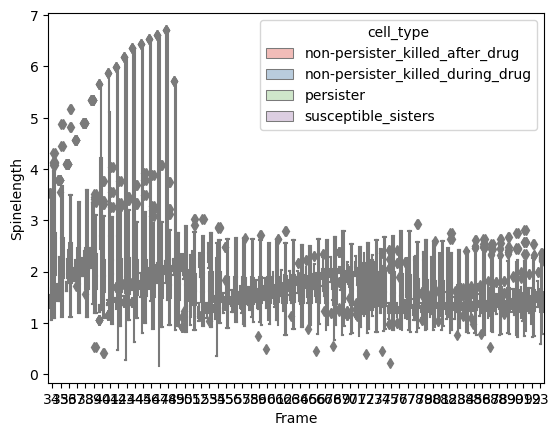

In [23]:
df_deepstat=calc_final_df[(calc_final_df['Frame'] > 33) & (calc_final_df['Frame'] < 94)]
sns.boxplot(x='Frame', y='Spinelength', hue="cell_type", data=df_deepstat, palette="Pastel1")

In [30]:
calc_final_df['num_div_stat_phase_length_drop'].max()

nan

In [ ]:
calc_final_df.columns.tolist()

In [ ]:
groups_test= calc_final_df.groupby('unique_lineage_id')

for g, df in groups_test:
    print(df['unique_lineage_id'].unique(), df['num_div_stat_phase'].max())

In [66]:
count_num_div_persisters.columns

Index(['unique_lineage_id', 'num_div_exp_phase_length_drop',
       'num_div_stat_phase_length_drop', 'num_div_drug_phase_length_drop'],
      dtype='object')

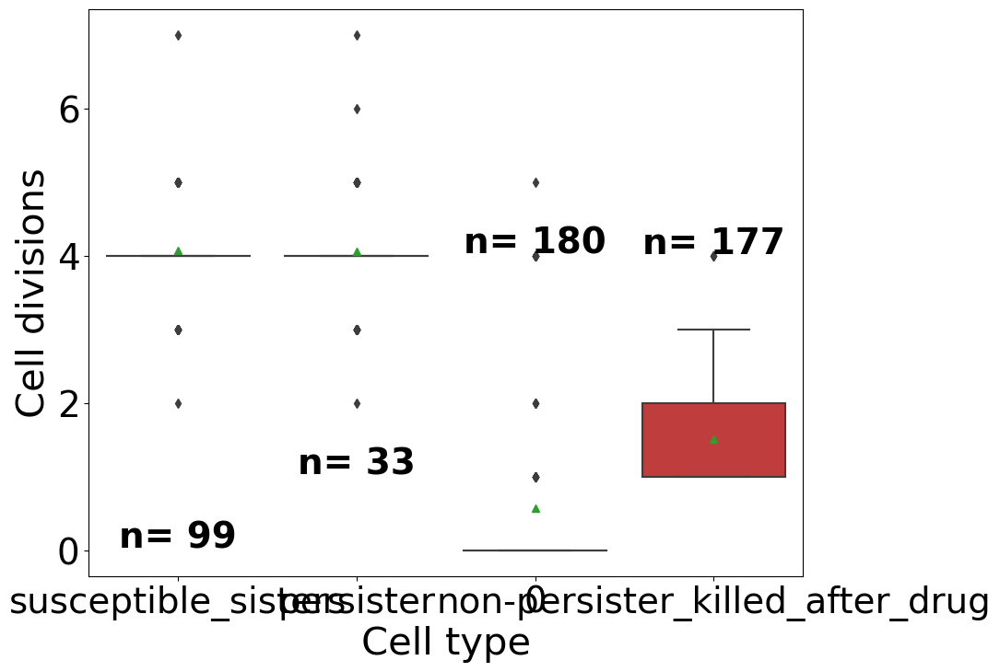

In [72]:
bp = sns.boxplot(x="cell_type", y='num_div_stat_phase_length_drop', data=result_df, showmeans=True)
bp.set_xlabel('Cell type', fontsize=30)
bp.tick_params(axis='both', which='major', labelsize=28)
bp.set_ylabel('Cell divisions',  fontsize=30)
#bp.set_title('Number of cell divisions during deep stationary phase', fontsize=22)
# Calculate number of obs per group & median to position labels
medians = result_df.groupby(['cell_type'])['num_div_stat_phase_length_drop'].median().values
nobs = result_df.groupby(['cell_type'])['num_div_stat_phase_length_drop'].count().values
nobs = [str(x) for x in nobs.tolist()]
nobs = ["n= " + i for i in nobs]

# Add it to the plot
pos = range(len(nobs))
for tick,label in zip(pos,bp.get_xticklabels()):
    bp.text(pos[tick],
            medians[tick] + 0.03,
            nobs[tick],
            horizontalalignment='center',
            size=28,
            color='k',
            weight='semibold')
plt.show
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
plt.savefig('cell_divisions_stat_phase.pdf', dpi=300)

In [ ]:
#Cell division times
df_deepstat_no_sisters=df_deepstat_no_sisters[(df_deepstat_no_sisters['NextDivisionFrame'] < 93)]
#df_deepstat['NextDivisionFrame'].fillna(0, inplace=True) #remove NaNs from 'NextDivisionFrame'
# group by 'type' and 'lin_id_str2', then sort 'NextDivisionFrame' values in descending order
t = df_deepstat_no_sisters.groupby(['type', 'lin_id_str2'])['NextDivisionFrame'].unique().reset_index(name='division_times')
# select the second-to-last value from each 'division_times' array
t['last_division_hrs'] = t['division_times'].apply(lambda x: max(x))
#frequency of divisions
t['div_freq']= t['division_times'].apply(lambda x: len(x)/10)
#Time of last division before treatment
t['last_division_before_treatment']=t['last_division_hrs']*10/60
t['time_since_last_division_before_treatment']=15.5-t['last_division_hrs']*10/60

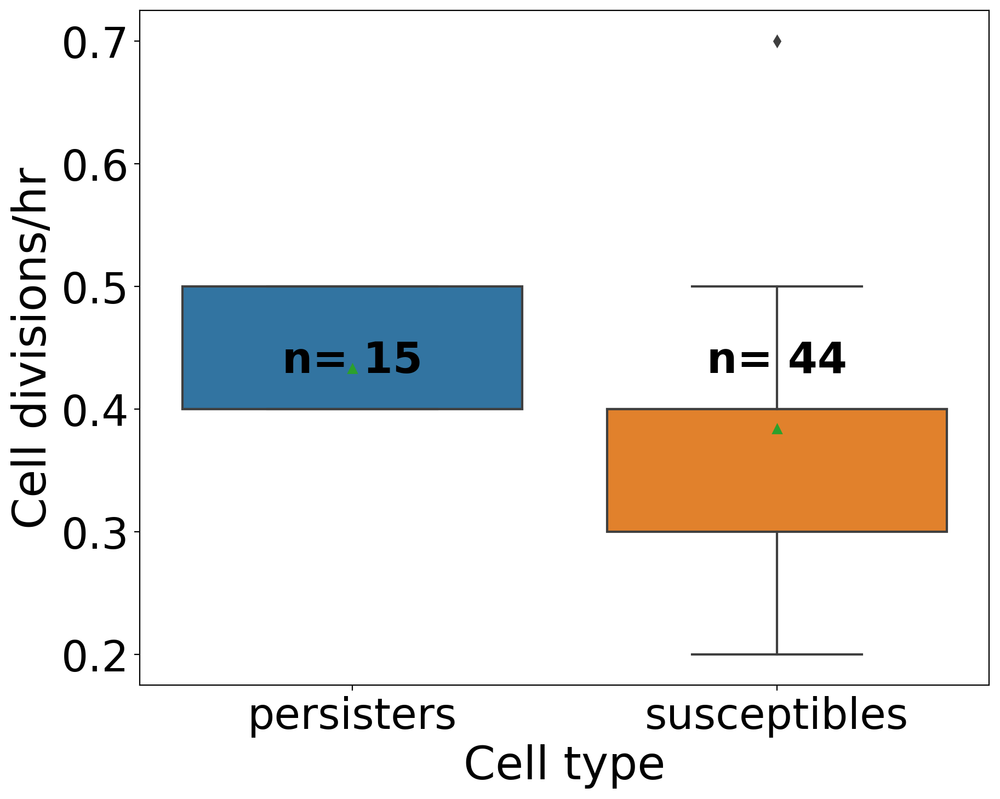

In [ ]:
bp = sns.boxplot(x="type", y='div_freq', data=t, showmeans=True)
bp.set_xlabel('Cell type', fontsize=30)
bp.tick_params(axis='both', which='major', labelsize=28)
bp.set_ylabel('Cell divisions/hr',  fontsize=30)
#bp.set_title('Frequency of cell divisions during deep stationary phase', fontsize=22)
# Calculate number of obs per group & median to position labels
medians = t.groupby(['type'])['div_freq'].median().values
nobs = t.groupby(['type'])['div_freq'].count().values
nobs = [str(x) for x in nobs.tolist()]
nobs = ["n= " + i for i in nobs]

# Add it to the plot
pos = range(len(nobs))
for tick,label in zip(pos,bp.get_xticklabels()):
    bp.text(pos[tick],
            medians[tick] + 0.03,
            nobs[tick],
            horizontalalignment='center',
            size=28,
            color='k',
            weight='semibold')
plt.show
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
plt.savefig('freq_divisions_stat_phase.pdf', dpi=300)

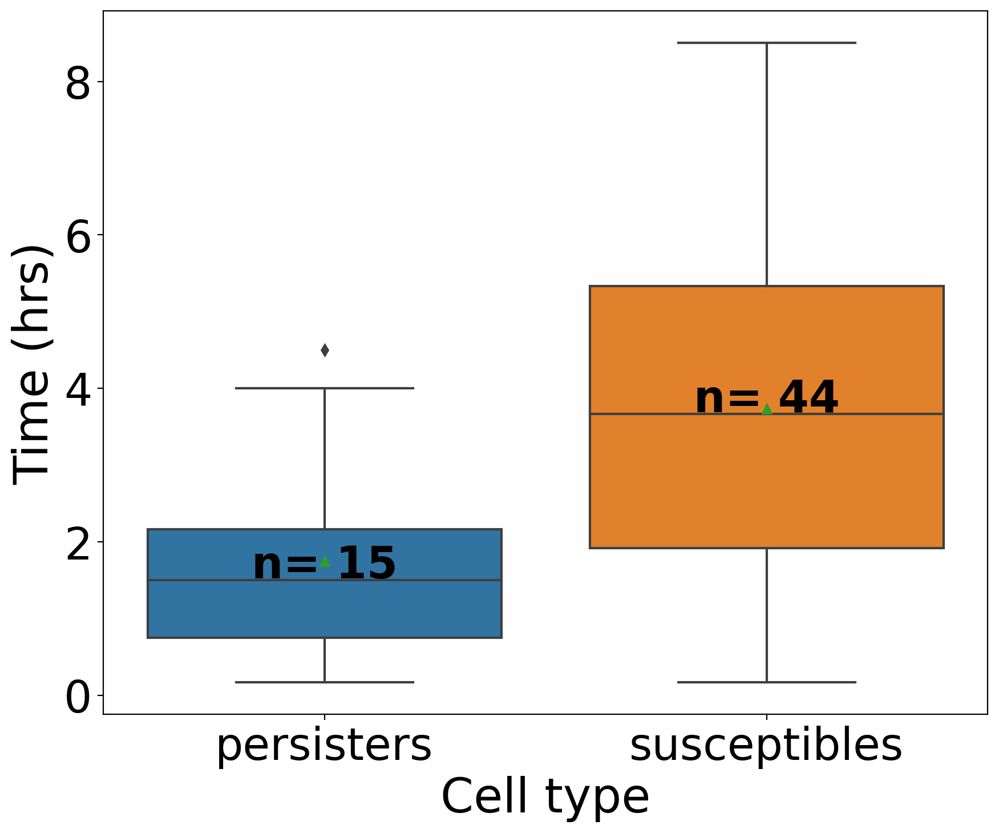

In [ ]:
bp_t_div = sns.boxplot(x="type", y='time_since_last_division_before_treatment', data=t, showmeans=True)
bp_t_div.set_xlabel('Cell type', fontsize=30)
bp_t_div.tick_params(axis='both', which='major', labelsize=28)
bp_t_div.set_ylabel('Time (hrs)',  fontsize=30)
#bp_t_div.set_title('Time since last division before drug treatment', fontsize=22)
# Calculate number of obs per group & median to position labels
medians = t.groupby(['type'])['time_since_last_division_before_treatment'].median().values
nobs = t.groupby(['type'])['time_since_last_division_before_treatment'].count().values
nobs = [str(x) for x in nobs.tolist()]
nobs = ["n= " + i for i in nobs]

# Add it to the plot
pos = range(len(nobs))
for tick,label in zip(pos,bp_t_div.get_xticklabels()):
    bp_t_div.text(pos[tick],
            medians[tick] + 0.03,
            nobs[tick],
            horizontalalignment='center',
            size=28,
            color='k',
            weight='semibold')
 
plt.show
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
plt.savefig('time_since_last_division_before_treatment.pdf', dpi=300)

In [ ]:
df.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,FeretMax_unit,NextDivisionTime,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,type,rfp_gfp_ratio
17,xy02,2,0-20-0,0,0,0.000000,A,2.0,NaN,NaN,...,3.7706,0.333333,20,0,2-20-A,xy02-0-20-0,2-20,233,persisters,0.652059
46,xy02,2,1-20-0,1,0,0.166667,A,2.0,NaN,NaN,...,4.8140,0.333333,20,0,2-20-A,xy02-1-20-0,2-20,233,persisters,0.764175
75,xy02,2,2-20-0,2,0,0.333333,AH,4.0,2.0,NaN,...,3.0557,0.666667,20,0,2-20-AH,xy02-2-20-0,2-20,234,persisters,0.559255
106,xy02,2,3-20-0,3,0,0.500000,AH,4.0,2.0,NaN,...,3.7073,0.666667,20,0,2-20-AH,xy02-3-20-0,2-20,234,persisters,0.660178
134,xy02,2,4-20-0,4,0,0.666667,AHH,15.0,4.0,NaN,...,2.4734,2.500000,20,0,2-20-AHH,xy02-4-20-0,2-20,235,persisters,0.462329


In [ ]:
#Selection of persisters, susceptible sisters, and susceptible cells
df_t = df[(df['lin_id_str2']=="6-4") | (df['lin_id_str2']=="6-14") | (df['lin_id_str2']=="30-19") | (df['lin_id_str2']=="6-11") | (df['lin_id_str2']=="3-2") | (df['lin_id_str2']=="6-0")] #select cells for plots

In [ ]:
df_t.head()
#df_t.columns
np.unique(df_t['type'])

array(['persisters', 'susceptibles'], dtype=object)

In [ ]:
g = sns.FacetGrid(df_t, col='lin_id_str2',sharex=False, sharey=False, col_wrap=3, height=3, aspect=1.5, margin_titles=True,  hue='type')
g.map_dataframe(sns.lineplot, x='Time' , y='SpineLength_unit_feature',lw=2.5)
g.add_legend(fontsize=18)
g.map(plt.axvline, x=17, color='gray', lw=3, ls='--')
g.map(plt.axvspan, xmin=3, xmax=15.5, color='gray', alpha=0.1)
g.map(plt.axvspan, xmin=15.6, xmax=18.5, color='bisque', alpha=0.4)
g.set_axis_labels('Time (hrs)','Cell length (um)', fontsize=18)
g.set(xlim=(0,45), ylim=(0,6))
#g.set_titles(col_template='Position ID: {col_name}', fontsize=18)
g.set_titles(col_template='', fontsize=18)
for ax in g.axes.flat:
    ax.tick_params(labelsize=16)
plt.show()
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
g.savefig('2022-05-26_DIMM_length.svg', format='svg')
g.savefig('2022-05-26_DIMM_length.pdf', dpi=300)


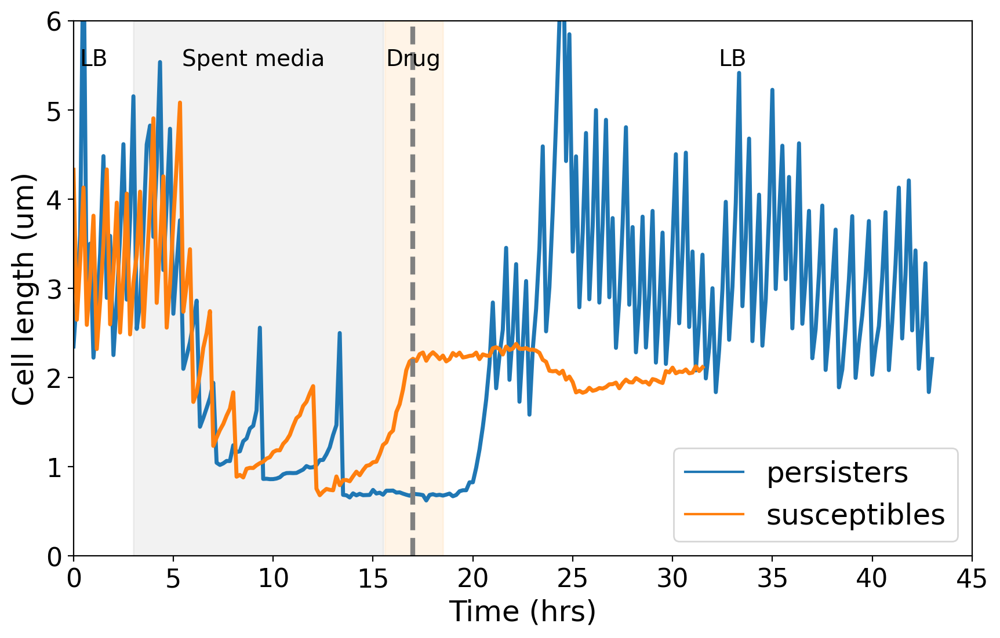

In [ ]:
#dataset without susceptible sisters
df_t_no_sisters = df[(df['type']!='susceptible_sisters')]
#examples of persister and susceptible cells pais (no susceptible sister)
df_t1 = df_t_no_sisters[(df_t_no_sisters['lin_id_str2']=="6-4") | (df_t_no_sisters['lin_id_str2']=="6-11") ] #select cells for plots 
df_t2 = df_t_no_sisters[(df_t_no_sisters['lin_id_str2']=="6-14")| (df_t_no_sisters['lin_id_str2']=="3-2")] #select cells for plots 
df_t3 = df_t_no_sisters[(df_t_no_sisters['lin_id_str2']=="30-19")| (df_t_no_sisters['lin_id_str2']=="6-0")] #select cells for plots 

# Create the line plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.lineplot(data=df_t1, x='Time', y='SpineLength_unit_feature', hue='type', lw=2.5) #modify df accordingly

# Add vertical lines and spans
plt.axvline(x=17, color='gray', lw=3, ls='--')
plt.axvspan(xmin=3, xmax=15.5, color='gray', alpha=0.1)
plt.axvspan(xmin=15.6, xmax=18.5, color='bisque', alpha=0.4)
plt.text(1, 5.5, 'LB', fontsize=14, color='black', ha='center')
plt.text(9, 5.5, 'Spent media', fontsize=14, color='black', ha='center')
plt.text(17, 5.5, 'Drug', fontsize=14, color='black', ha='center')
plt.text(33, 5.5, 'LB', fontsize=14, color='black', ha='center')


# Set labels and limits
plt.xlabel('Time (hrs)', fontsize=18)
plt.ylabel('Cell length (um)', fontsize=18)
plt.xlim(0, 45)
plt.ylim(0, 6)

# Add legend
plt.legend(loc='lower right', fontsize=18)

# Set title
#plt.title('Line Plot', fontsize=18)

# Set tick label size
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the figure
plt.savefig('peristers_ex1.svg', format='svg')  # Save as PNG
plt.savefig('peristers_ex1.pdf', format='pdf', dpi=300)  # Save as PDF

# Show the plot
plt.show()


In [ ]:
#heatmap dataframe
df_heatmap_timer = df[['lin_id_str2', 'Frame', 'rfp_gfp_ratio']].copy()
df_heatmap_timer.info()
spread_df_heatmaptimer= df_heatmap_timer.groupby('lin_id_str2').apply(lambda x: x.assign(Frame=np.arange(1,len(x)+1))).pivot(index='Frame', columns='lin_id_str2', values='rfp_gfp_ratio')
spread_df_heatmaptimer.info()
spread_df_heatmaptimer= spread_df_heatmaptimer.dropna()
spread_df_heatmaptimer.info

trans_df_heatmap_timer = spread_df_heatmaptimer.iloc[:,1:].T
# trans_df_heatmap_timer.columns = np.arange(len(trans_df_heatmap_timer.columns))
# #trans_df_heatmap_timer.index= df_heatmap_timer['lin_id_str2'].unique()

# n_frames =len(trans_df_heatmap_timer.columns)
# df_heatmaps = pd.DataFrame(trans_df_heatmap_timer)
# df_heatmaps.columns = np.arange(n_frames + 1)
# df_heatmaps.index = df_heatmap_timer['lin_id_str2'].unique()

plt.figure(figsize=(8, 6))
sns.heatmap(trans_df_heatmap_timer, cmap='coolwarm', annot=True, fmt=".1f")

# Customize labels and title
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.title('Heatmap of Rows as a Function of Columns')

# Display the heatmap
plt.show()



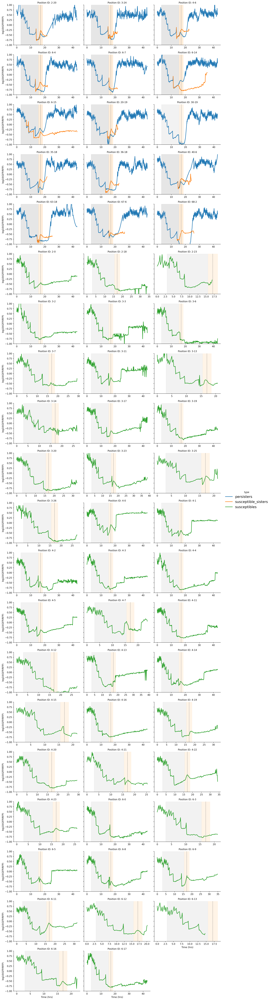

In [ ]:
g = sns.FacetGrid(df, col='lin_id_str2',sharex=False, sharey=True, col_wrap=3, height=3, aspect=1.5 , margin_titles=True,  hue='type')
g.map_dataframe(sns.lineplot, x='Time' , y='rfp_gfp_ratio',lw=2)
g.add_legend(fontsize=15)
g.map(plt.axvline, x=17, color='gray', lw=1, ls='--')
g.map(plt.axvspan, xmin=3, xmax=15.5, color='gray', alpha=0.1)
g.map(plt.axvspan, xmin=15.6,xmax=18.5, color='bisque', alpha=0.4)
g.set_axis_labels('Time (hrs)','log10(GFP/RFP)')
g.set(ylim=(-1,1))
g.set_titles(col_template='Position ID: {col_name}')
plt.show()
g.savefig('2022-05-26_DIMM_timer_gfp_rfp.pdf', dpi=300)

In [ ]:
cells_for_liveplot = df[(df['lin_id_str2']=="2-20") & (df['Frame'] > 94) & (df['Frame'] < 111)]
cells_for_liveplot.tail()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,FeretMax_unit,NextDivisionTime,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,type,rfp_gfp_ratio
3299,xy02,2,106-20-1,106,1,17.666667,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5721,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-106-20-1,2-20,378,susceptible_sisters,-0.325482
3325,xy02,2,107-20-1,107,1,17.833333,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5077,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-107-20-1,2-20,378,susceptible_sisters,-0.380927
3350,xy02,2,108-20-1,108,1,18.000000,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5077,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-108-20-1,2-20,378,susceptible_sisters,-0.384933
3375,xy02,2,109-20-1,109,1,18.166667,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5654,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-109-20-1,2-20,378,susceptible_sisters,-0.399834
3401,xy02,2,110-20-1,110,1,18.333333,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5006,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-110-20-1,2-20,378,susceptible_sisters,-0.434726


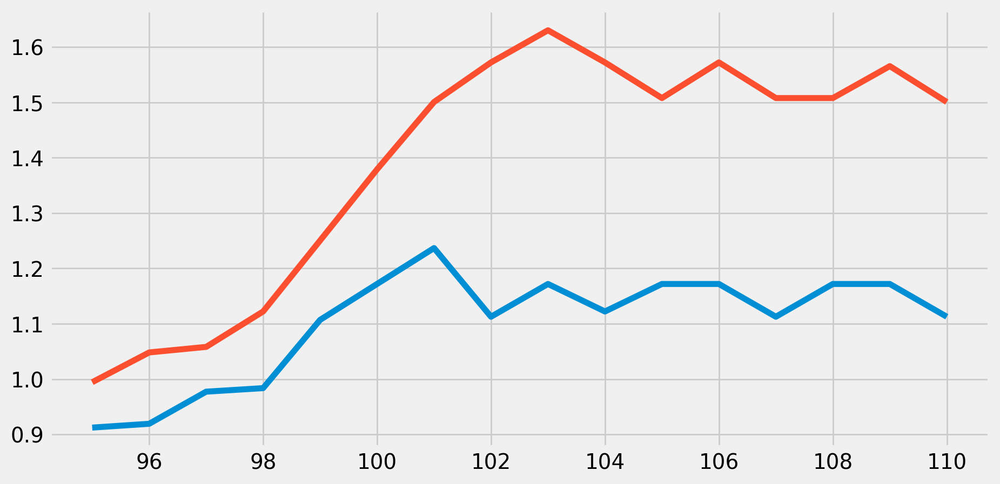

In [ ]:
#plt.plot(df[df['lin_id_str2']=="2-20"]['Frame']*10/60, df[df['lin_id_str2']=="2-20"]['FeretMax_unit'])
plt.plot(cells_for_liveplot[cells_for_liveplot['type']=='persisters']['Frame'], cells_for_liveplot[cells_for_liveplot['type']=='persisters']['FeretMax_unit'])
plt.plot(cells_for_liveplot[cells_for_liveplot['type']=='susceptible_sisters']['Frame'], cells_for_liveplot[cells_for_liveplot['type']=='susceptible_sisters']['FeretMax_unit'])


In [ ]:


#liveplot of 2 sister cells with different fates
def animate(i):
    plt.cla()
    data = cells_for_liveplot
    x =  data['Frame']
    y1 = data[data['type']=='persisters']['FeretMax_unit'] 
    y2 = data[data['type']=='susceptible_sisters']['FeretMax_unit']

    plt.plot(x, y1, label='persisters')
    plt.plot(x, y2, label='susceptible_sister')

    plt.legend(loc='upper left')
    plt.tight_layout()

ani = FuncAnimation(plt.gcf(), animate, interval=1000, frames= 10, repeat= False)

plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

/Users/hernan0000/miniconda3/envs/i2i_env/lib/python3.9/site-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


: 

In [ ]:
#sister cells during treatment
df_deepstat_only_sisters=df[(df['Frame'] > 94) & (df['Frame'] < 111) & (df['type']!='susceptibles')] #exclude 'susceptibles' 

#elongation rate of sisters cells

frm_interval = 10./60 #frame interval in minutes
gamma = 0.0015 #protein degradation constant in 1/min

mu = df_deepstat_only_sisters.groupby('lin_id_str2')['SpineLength_unit_feature'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
df_deepstat_only_sisters['mu'] = mu

#et_ddt_gfp_rfp = df.groupby(['type', 'lin_id_str2'])['rfp_gfp_ratio'].rolling(5, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['et_ddt_gfp'] = et_ddt_gfp

/var/folders/yb/_xf4lxss6n9g0n8frp24vv7w0000gn/T/ipykernel_31928/2377877166.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_deepstat_only_sisters['mu'] = mu


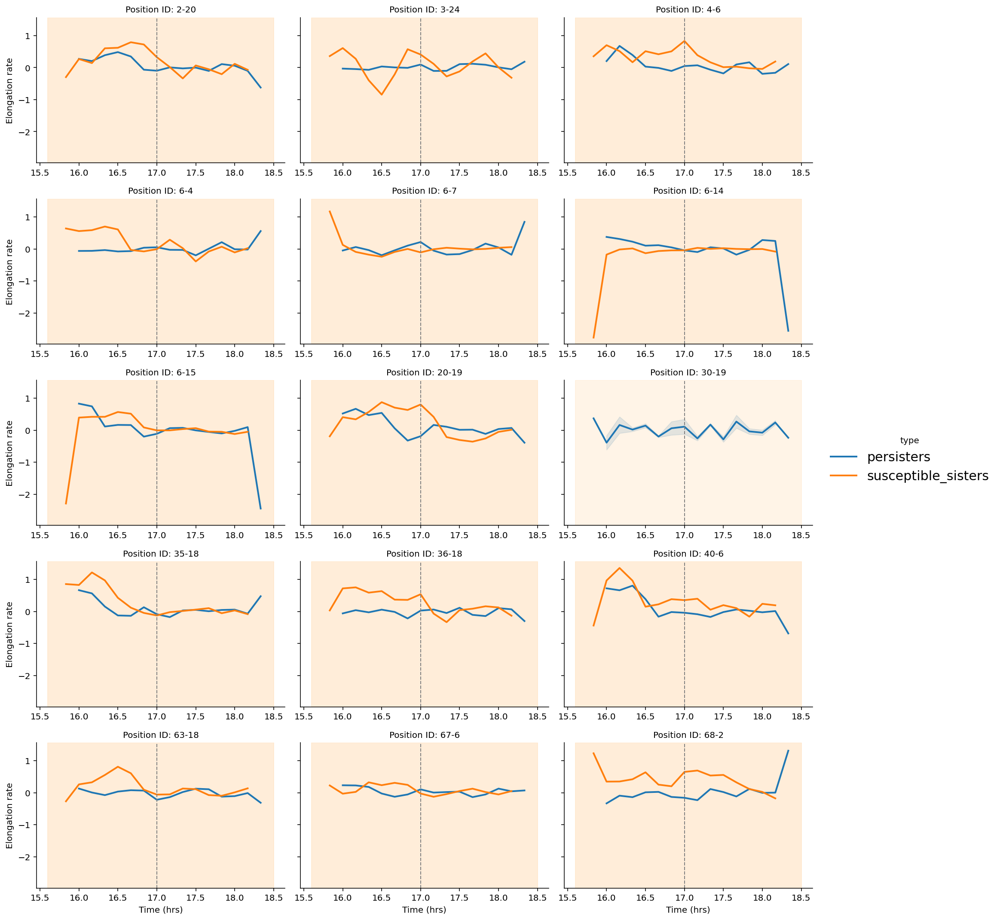

In [ ]:
#plot elongation rates
g = sns.FacetGrid(df_deepstat_only_sisters, col='lin_id_str2',sharex=False, sharey=True, col_wrap=3, height=3, aspect=1.5 , margin_titles=True,  hue='type')
g.map_dataframe(sns.lineplot, x='Time' , y='mu',lw=2)
g.add_legend(fontsize=15)
g.map(plt.axvline, x=17, color='gray', lw=1, ls='--')
#g.map(plt.axvspan, xmin=3, xmax=15.5, color='gray', alpha=0.1)
g.map(plt.axvspan, xmin=15.6,xmax=18.5, color='bisque', alpha=0.4)
g.set_axis_labels('Time (hrs)','Elongation rate')
#g.set(ylim=(-1,1))
g.set_titles(col_template='Position ID: {col_name}')
plt.show()
g.savefig('2022-05-26_DIMM_timer_elongation_rate.pdf', dpi=300)

In [ ]:
#
persisters_17=result.loc[(result['Frame']== 103) & (result['type'] == 'persisters')]
susceptible_sisters_17=result.loc[(result['Frame']== 103) & (result['type'] == 'susceptible_sisters')]
susceptible_17=result.loc[(result['Frame']== 103) & (result['type'] == 'susceptibles')]
t_17 = [persisters_17, susceptible_sisters_17, susceptible_17]
result_t_17 = pd.concat(t_17)

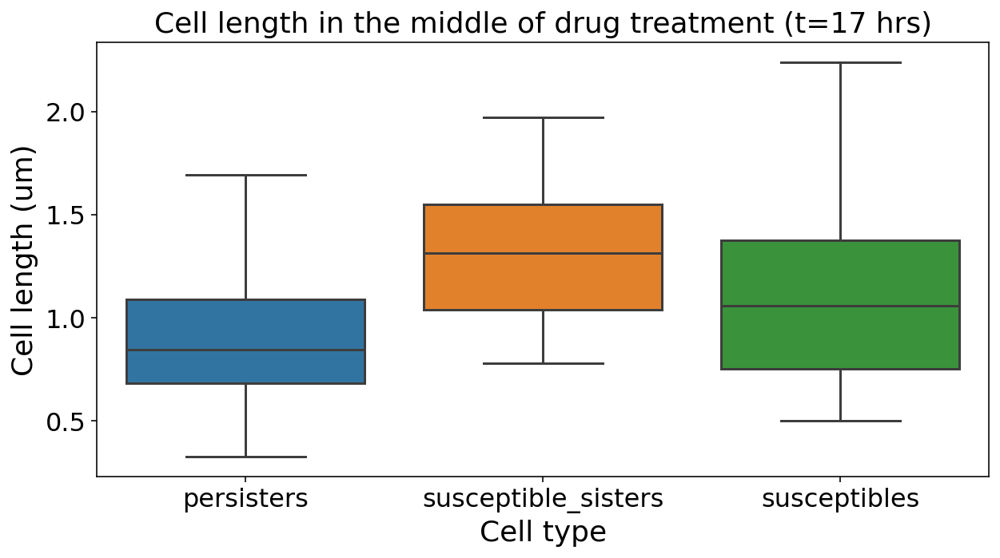

In [ ]:
bp = sns.boxplot(x="type", y='Spinelength_unit', data=result_t_17)
bp.set_xlabel('Cell type', fontsize=18)
bp.tick_params(axis='both', which='major', labelsize=16)
bp.set_ylabel('Cell length (um)',  fontsize=18)
bp.set_title('Cell length in the middle of drug treatment (t=17 hrs)', fontsize=18)
plt.show
plt.savefig('2022-05-26_DIMM_timer_17hrs.pdf', dpi=300)

<AxesSubplot:xlabel='Frame', ylabel='Spinelength'>

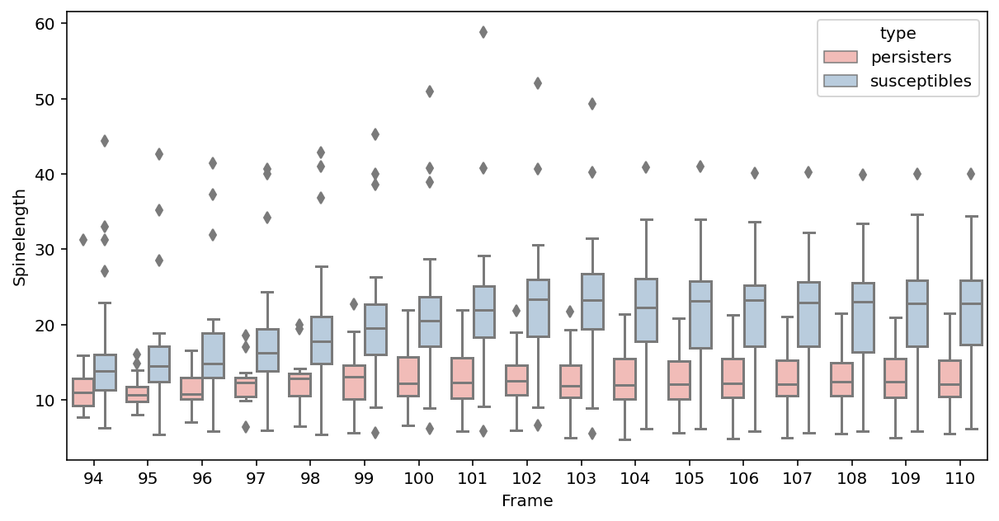

In [ ]:
result1=(result[(result['Frame'] > 93) & (result['Frame'] < 111)])
sns.boxplot(x="Frame", y='Spinelength', hue="type", data=result1, palette="Pastel1")
#plt.ylim(200, 360)
#plt.show()

<AxesSubplot:xlabel='Frame', ylabel='Spinelength'>

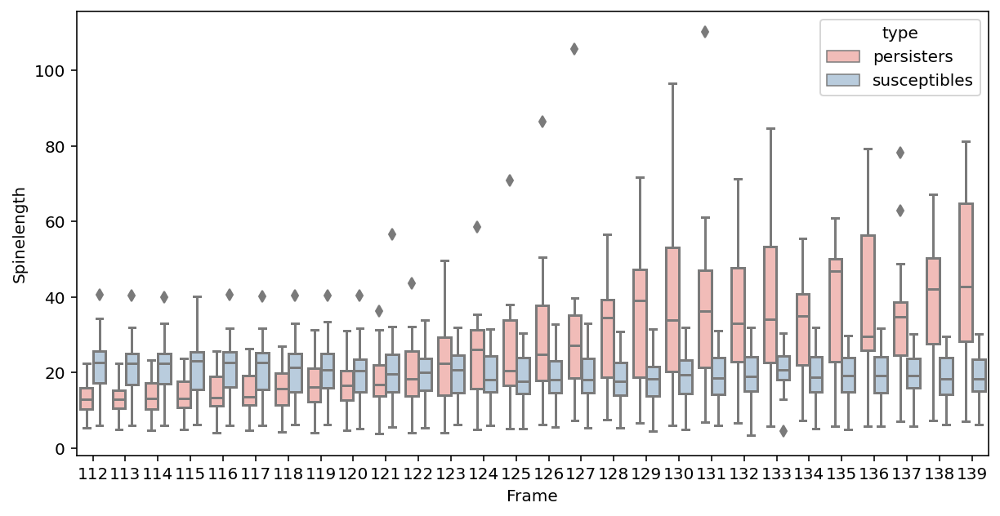

In [ ]:
result2=(result[(result['Frame'] > 111) & (result['Frame'] < 140)])
sns.boxplot(x="Frame", y='Spinelength', hue="type", data=result2, palette="Pastel1")
#plt.ylim(200, 360)
#plt.show()

In [ ]:
resultx = result.groupby(['type','Frame'])['Spinelength'].describe().unstack()
resultx.tail()

count                                               ...      max  \
Frame          12   13   14   15   16   17   18   19   20   21   ...      249   
type                                                             ...            
persisters     1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  ...  67.0172   
susceptibles   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...      NaN   

                                                                               \
Frame              250      251      252      253      254      255       256   
type                                                                            
persisters    100.4455  64.8152  70.0069  77.1293  83.3822  93.4729  115.7504   
susceptibles       NaN      NaN      NaN      NaN      NaN      NaN       NaN   

                                
Frame              257     258  
type                            
persisters    150.0013  54.183  
susceptibles       NaN     NaN  

[2 rows x 1976 columns]

In [ ]:
persisters1 = result.query('type == "persisters"')['Spinelength']
susceptibles1 = result.query('type == "susceptibles"')['Spinelength']
test = result.groupby(['PositionIdx', 'type'])
test.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,FeretMax_unit,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,type,rfp_gfp_ratio,scaled
17,xy02,2,0-20-0,0,0,0.000000,A,2.0,NaN,NaN,...,3.7706,20,0,2-20-A,xy02-0-20-0,2-20,233,persisters,-0.307834,55.779944
46,xy02,2,1-20-0,1,0,0.166667,A,2.0,NaN,NaN,...,4.8140,20,0,2-20-A,xy02-1-20-0,2-20,233,persisters,-0.323820,71.413775
75,xy02,2,2-20-0,2,0,0.333333,AH,4.0,2.0,NaN,...,3.0557,20,0,2-20-AH,xy02-2-20-0,2-20,238,persisters,-0.321701,44.616878
106,xy02,2,3-20-0,3,0,0.500000,AH,4.0,2.0,NaN,...,3.7073,20,0,2-20-AH,xy02-3-20-0,2-20,238,persisters,-0.363945,54.664561
134,xy02,2,4-20-0,4,0,0.666667,AHH,NaN,4.0,NaN,...,2.4734,20,0,2-20-AHH,xy02-4-20-0,2-20,239,persisters,-0.343125,35.166119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54111,xy06,6,0-0-0,0,0,0.000000,A,3.0,NaN,NaN,...,3.3175,0,0,6-0-A,xy06-0-0-0,6-0,20812,susceptibles,-0.315100,48.739951
54123,xy06,6,0-3-0,0,0,0.000000,A,4.0,NaN,NaN,...,2.7424,3,0,6-3-A,xy06-0-3-0,6-3,22653,susceptibles,-0.214025,40.461498
54130,xy06,6,0-5-0,0,0,0.000000,A,3.0,NaN,NaN,...,2.2186,5,0,6-5-A,xy06-0-5-0,6-5,23012,susceptibles,-0.063119,31.732276
54140,xy06,6,0-8-0,0,0,0.000000,A,1.0,NaN,NaN,...,3.5803,8,0,6-8-A,xy06-0-8-0,6-8,23371,susceptibles,-0.144419,52.978409


In [ ]:
#tt_df.groupby('Frame').apply(lambda result: stats.ttest_ind(result['type'], result['Spinelength']))
from scipy.stats import ttest_ind

#ttest_ind(persisters1['Spinelength'], susceptibles1['Spinelength'], equal_var=False)


NameError: name 'tt_df' is not defined

In [ ]:
df_persisters =pd.read_csv(selections, sep=';')
df_persisters.tail()
df_susceptibles = df_persisters
df_susceptibles.PositionIdx = df_susceptibles.PositionIdx + 1
df_susceptibles.tail()

In [ ]:
#filtering persister cells that is not mother
persisters = df[df['lin_id_str'].isin(df_selections['lin_id_str'])]
print(len(np.unique(persisters['lin_id_str'])))

#df = df[df['ChannelIdx'] == 15]
#df = df[df['CellPosChannel'] == 3]
#df= df[(df['Frame'] > 87)& (df['Frame'] < 105)]
#df.tail()
#mask = df['Position'].str.contains('xy[14-15]', regex = True, case=False, na=False)
#df[mask].sample(3)
#data['type'].isin(['TV Show'])
#df[mask].head()
#df['Position'].str.contains('String').tolist()
#print([pattern in i for i in df['Position']])

1861


In [ ]:
test = persisters[persisters['lin_id_str']==np.unique(persisters['lin_id_str'])[0]]
test.head()
len(test['Frame'])

1

In [ ]:
print(np.unique(persisters['lin_id_str2']))

['2-20' '20-19' '3-24' '30-19' '35-18' '36-18' '4-6' '40-6' '6-14' '6-15'
 '6-4' '6-7' '63-18' '67-6' '68-2' '7-10']


In [ ]:
persisters= persisters[(persisters['Frame'] > 60) & (persisters['Frame'] < 104)]
#persisters.set_index('Frame', inplace=True)
#persisters.groupby('lin_id_str2')['Spinelength'].plot(legend=True)
persisters.groupby(['lin_id_str2'], sort=False)['Frame'].max()

lin_id_str2
40-6     103
63-18    103
30-19    103
20-19    103
7-10     103
67-6     103
35-18    103
2-20     103
68-2     103
3-24     103
36-18    103
4-6      103
6-15     103
6-7      103
6-4      103
6-14     103
Name: Frame, dtype: int64

In [ ]:
import seaborn as sns

df['Length'] = df['Spinelength']

#get first and last frame of all cells
df_first_frame = df.groupby('lin_id_str').first()
df_last_frame = df.groupby('lin_id_str').last()

#we only want cells of which we have observed the full lineage
#and exclude the ones that have no offspring (d1_lin_id=-1)
#we can filter these out with:
df_first_frame = df_first_frame.loc[~np.isnan(df_first_frame['NextDivisionFrame'])]
df_last_frame = df_last_frame.loc[~np.isnan(df_last_frame['NextDivisionFrame'])]

fig, axs = plt.subplots(1,3, figsize=(12,4))
sns.histplot(ax=axs[0], data=df_first_frame, x='Length', )
sns.histplot(ax=axs[1], data=df_last_frame, x='Length')
sns.scatterplot(ax=axs[2], x=df_first_frame['Length'], y=df_last_frame['Length'])

for ax in axs: ax.set(xlim=(0,20)) 
axs[2].set(ylim=(0,20))

titles = ['length at birth', 'length at division', 'length at division vs length at birth'] 
for idx, title in enumerate(titles): axs[idx].set_title(title)

In [ ]:
def derivative(y, frm_interval=1, log = False):
    if y.size > 2:
        y = np.log(y) if log else y
        x = np.arange(y.size) * frm_interval
        p = np.polyfit(x, y, 1) #simply 1st order polynomial fit / regression (numpy.polyfit)
        ddt = p[0] #slope of first order fit in python p[0]
    else: 
        ddt = np.nan 
    return ddt


In [ ]:
frm_interval = 10./60 #frame interval in minutes
gamma = 0.0015 #protein degradation constant in 1/min

lin_mu = df_deepstat.groupby('lin_id_str2')['Spinelength_unit_feature'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
result0['lin_mu'] = lin_mu
result0['lin_mu'].tail()
plt.plot(range(0, len(result0['lin_mu'])), result0['lin_mu'])

#lin_mu_size = df.groupby('lin_id_str')['Size'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
#df['lin_mu_size'] = lin_mu_size

#lin_ddt_gfp = df.groupby('lin_id_str')['MeanIntensityGFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['lin_ddt_gfp'] = lin_ddt_gfp

#lin_ddt_rfp = df.groupby('lin_id_str')['MeanIntensityRFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['lin_ddt_rfp'] = lin_ddt_rfp

#df['lin_promoter_act_G'] = (gamma + df['lin_mu'] ) * df['MeanIntensityGFP'] + df['lin_ddt_gfp']
#df['lin_promoter_act_R'] = (gamma + df['lin_mu'] ) * df['MeanIntensityRFP'] + df['lin_ddt_rfp']



In [ ]:
frm_interval = 10./60 #frame interval in minutes
gamma = 0.0015 #protein degradation constant in 1/min

lin_mu = persisters.groupby('lin_id_str')['Spinelength'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
df['lin_mu'] = lin_mu

lin_mu_size = persisters.groupby('lin_id_str')['Size'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
df['lin_mu_size'] = lin_mu_size

lin_ddt_gfp = persisters.groupby('lin_id_str')['MeanIntensityGFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
df['lin_ddt_gfp'] = lin_ddt_gfp

#lin_ddt_rfp = df.groupby('lin_id_str')['MeanIntensityRFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['lin_ddt_rfp'] = lin_ddt_rfp

#df['lin_promoter_act_G'] = (gamma + df['lin_mu'] ) * df['MeanIntensityGFP'] + df['lin_ddt_gfp']
#df['lin_promoter_act_R'] = (gamma + df['lin_mu'] ) * df['MeanIntensityRFP'] + df['lin_ddt_rfp']

In [ ]:
p1=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[0])]
plt.plot(p1["Frame"],np.log(p1["Spinelength"]),'.')
p1= p1[p1['Frame'] > 85]
p1['cumsum'] = sum(np.log(p1["Spinelength"]))
p1.head()

In [ ]:
p2=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[1])]
plt.plot(p2["Frame"],np.log(p2["Spinelength"]),'.')
p2= p2[p2['Frame'] > 80]
p2['cumsum'] = sum(np.log(p2["Spinelength"]))
p2.head()

In [ ]:
p3=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[2])]
plt.plot(p3["Frame"],np.log(p3["Spinelength"]),'.')
p3= p3[p3['Frame'] > 88]
p3['cumsum'] = sum(np.log(p3["Spinelength"]))
p3.head()

In [ ]:
p4=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[3])]
plt.plot(p4["Frame"],np.log(p4["Spinelength"]),'.')
p4= p4[p4['Frame'] > 69]
p4['cumsum'] = sum(np.log(p4["Spinelength"]))
p4.head()

In [ ]:
p5=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[4])]
plt.plot(p5["Frame"],np.log(p5["Spinelength"]),'.')
p5= p5[p5['Frame'] > 70]
p5['cumsum'] = sum(np.log(p5["Spinelength"]))
p5.head()

In [ ]:
p6=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[5])]
plt.plot(p6["Frame"],np.log(p6["Spinelength"]),'.')
p6= p6[p6['Frame'] > 88]
p6['cumsum'] = sum(np.log(p6["Spinelength"]))
p6.head()

In [ ]:
p1= p1.loc[p1['lin_mu'] < -2.2, ['lin_id_str', 'Frame', 'lin_mu']]
sum(np.log(p1["Spinelength"]))

In [ ]:
p1= p1[(p1['Frame'] > 60) & (p1['Frame'] < 102)]
plt.plot(p1["Frame"],p1["Spinelength"])
sum(np.log(p1["Spinelength"]))

In [ ]:
#trying to use mean of previous adn future growth rates to filter out strange growth rates.
gr_before = df.groupby('lin_id_str')['lin_mu'].rolling(3, min_periods=3, center=False).apply(np.mean).reset_index(0,drop=True)
indexer = pd.api.indexers.FixedForwardWindowIndexer(window_size=3)
gr_after = df.groupby('lin_id_str')['lin_mu'].rolling(window=indexer, min_periods=3).apply(np.mean).reset_index(0,drop=True)
df['gr_before'] = gr_before
df['gr_after'] = gr_after
df = df[(df["lin_mu"]-gr_before) > 0.3*np.mean(df.loc[:,"lin_mu"]) < (df["lin_mu"]-gr_after)]
#df = df[df.gr_clean > 0.3*np.mean(df.loc[:,"lin_mu"]) & df.gr_clean < 0.3*np.mean(df.loc[:,"lin_mu"])]


In [ ]:
len(np.unique(df.loc[:,"et_id_string"]))

In [ ]:
#negative_gr= df[(df['lin_mu'] < 0)][['lin_id_str','et_id_string', 'lin_mu']]
#negative_gr
#negative_gr.to_csv('2022-08-05_negative_gr.csv',sep=';')
positive_gr= df[(df['lin_mu'] >= 0)]
positive_gr.head()
negative_gr= df[(df['lin_mu'] < 0)]
negative_gr.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,id_cell,et_id_string,et_id_cell,Length,lin_mu,lin_mu_size,lin_ddt_gfp,lin_ddt_rfp,lin_promoter_act_G,lin_promoter_act_R
117,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-6-4,1,4,4.0,E,NaN,NaN,NaN,...,2147,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,23,32.4959,-0.848528,-0.916145,NaN,NaN,NaN,NaN
131,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-10-4,1,4,4.0,E,NaN,NaN,NaN,...,326,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,2,38.3029,-1.479078,-1.459303,NaN,NaN,NaN,NaN
137,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-11-5,1,5,4.0,D,NaN,NaN,NaN,...,367,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,3,33.2958,-0.676216,0.050001,NaN,NaN,NaN,NaN
153,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-16-4,1,4,4.0,E,NaN,NaN,NaN,...,750,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,8,41.3873,-0.816560,-0.771135,NaN,NaN,NaN,NaN
160,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-19-0,1,0,4.0,A,5.0,NaN,NaN,...,974,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,11,32.3751,-1.643733,-0.361091,NaN,NaN,NaN,NaN


In [ ]:
positive_gr.to_csv('2022-08-05_1_positive_gr.csv', sep=';')
#df.to_csv('2022-08-05_1_python.csv',sep=';')

<AxesSubplot:xlabel='lin_mu', ylabel='Count'>

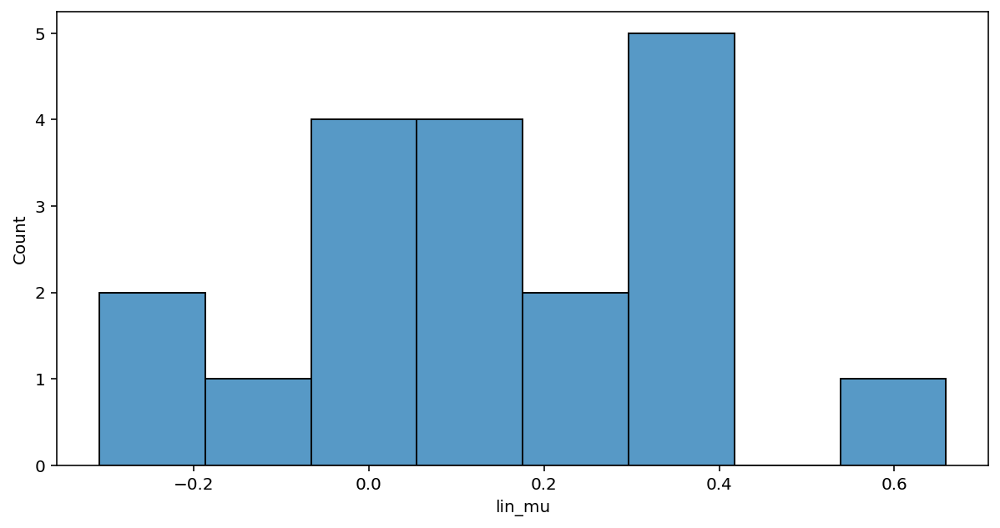

In [ ]:
sns.histplot(data=df, x='lin_mu', bins=8)

In [ ]:
tdf = df[['lin_id_str', 'lin_mu']]

In [ ]:
negative_gr['lin_id_str']=="0-5-A"

117        False
131        False
137        False
153         True
160        False
           ...  
1024990    False
1024995    False
1025005    False
1025011    False
1025020    False
Name: lin_id_str, Length: 107409, dtype: bool

In [ ]:
#c1 = df[df['et_id_string']=="xy00-0-5"]
c1 = p1[(p1['lin_id_str']==("2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46-15"))&(c1['Frame'] ==85)]
print(np.unique(c1["lin_id_str"]))
#print(df[df['et_id_cell']==20]['id_cell'])
c1= c1.loc[c1['lin_mu'] < -2.2, ['lin_id_str', 'Frame', 'lin_mu']]
c1.tail()

[]


,lin_id_str,Frame,lin_mu


In [ ]:
c1 = df[df['Position']=="2022-05-05_bcmm_isa_crop_all_001_002_crop_xy45"]
print(c1)
t_selection= c1[(c1['Frame'] >= 85) & (c1['Frame'] < 140)]
t_selection.head()

In [ ]:
plt.plot(df[df['lin_id_str']=="0-16-E"]['Frame'], df[df['lin_id_str']=="0-16-E"]['Spinelength'])

In [ ]:
plt.plot(df[df['et_id_string']=="xy00-0-5"]['Frame']*10/60, df[df['et_id_string']=="xy00-0-5"]['Spinelength'])

In [ ]:
x= np.log(df[df['id_cell']==999]['MeanIntensityGFP'])
y= df[df['id_cell']==999]['mu']
plt.scatter(x, y)

In [ ]:
plt.plot(df['Frame']*10./60, mu, '.')

In [ ]:
def grfilter(y, frm_interval=1):
    if y.size > 2:
        y = np.log(y) if log else y
        x = np.arange(y.size) * frm_interval
        p = np.mean(x, y, 1) #simply 1st order polynomial fit / regression (numpy.polyfit)
        ddt = p[0] #slope of first order fit in python p[0]
    else: 
        ddt = np.nan 
    return ddt


In [ ]:
from pybacmman.selections import saveAndOpenSelection
data_subset = data[data.Length>8]
print(f"number of objects: {data_subset.shape[0]}")
saveAndOpenSelection(data_subset, dsName, 1, "long cells", address='127.0.0.1', port=25335, python_proxy_port=25334)

In [ ]:
#add cell type to data from selections dataframe
#create a new column in df1
data['type'] = 'na'

# iterate over the rows of df1
for index, row in data.iterrows():
    # check if the value in 'col1' exists in df2
    if row['lin_id_str2'] in df_selections['lin_id_str2'].values:
        # find the corresponding row in df2
        df_selections_row = df_selections.loc[df_selections['lin_id_str2'] == row['lin_id_str2']]
        # add the value in 'col2' to the new column in df1
        data.at[index, 'type'] = df_selections_row['SelectionName'].iloc[0]

# print the updated dataframe


In [ ]:
#make separate list with rows that belong to persisters, susceptible sisters, and suscpetible cells
persisters = df_selections.loc[df_selections['SelectionName']== 'persisters']
susceptibles_sisters = df_selections.loc[df_selections['SelectionName']== 'susceptible_sisters']
susceptibles = df_selections.loc[df_selections['SelectionName']== 'susceptibles']

In [ ]:
#look for persisters and susceptibles and add labels in data
data_persisters = data_pos_ch_focus[data_pos_ch_focus['lin_id_str'].isin(persisters['lin_id_str'])]
data_persisters['type'] = 'persisters'
data_susceptible_sis = data_pos_ch_focus[data_pos_ch_focus['lin_id_str'].isin(susceptibles_sisters['lin_id_str'])]
data_susceptible_sis['type'] = 'susceptible_sisters'
data_susceptible = data_pos_ch_focus[data_pos_ch_focus['lin_id_str'].isin(susceptibles['lin_id_str'])]
data_susceptible['type'] = 'susceptibles'
#merge data of persisters and susceptibles labelled
merged = [data_persisters, data_susceptible_sis, data_susceptible]
df = pd.concat(merged)

In [ ]:
#add log10(GF/RFP) ratio correcting for cell length
df['rfp_gfp_ratio'] = np.log10(df['MeanIntensityGFP']/df['MeanIntensityRFP']*df['SpineLength_unit_feature'])
#print(result.columns)

In [ ]:
#conversion from Spinelength unit to pixels
#df['Spinelength_pixels']= df['Spinelength'] / df['Spinelength_unit'] 
#df['Spinelength_pixels'] = 15.3846  * df['Spinelength_unit']
#df[[ 'Spinelength', 'Spinelength_unit', 'Spinelength_pixels']]

<Axes: xlabel='Frame', ylabel='Spinelength_unit'>

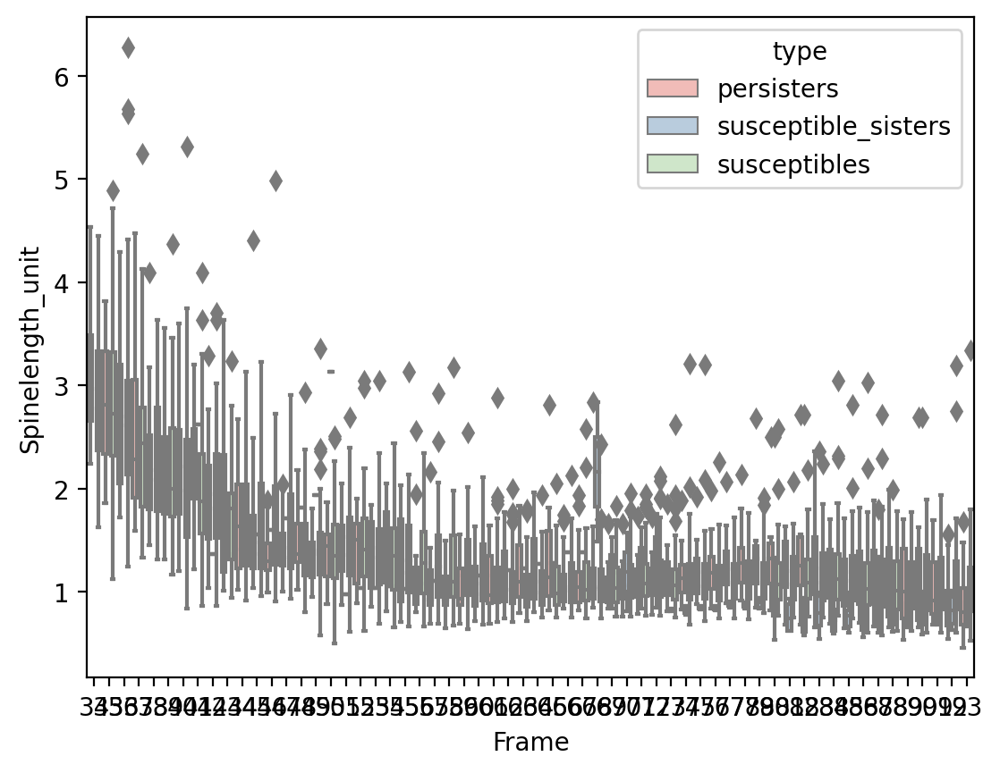

In [ ]:
df_deepstat=df[(df['Frame'] > 33) & (df['Frame'] < 94)]
sns.boxplot(x='Frame', y='Spinelength_unit', hue="type", data=df_deepstat, palette="Pastel1")

In [ ]:
#Number of cell divisions during deep stationary phase
df_deepstat_no_sisters=df[(df['Frame'] > 33) & (df['Frame'] < 98) & (df['type']!='susceptible_sisters')] #exclude 'susceptible_sisters' in boxplots
counts= df_deepstat_no_sisters.groupby(['type','lin_id_str2'])['NextDivisionFrame'].nunique().reset_index(name='count')
counts[counts['type']=='susceptible_sisters']['lin_id_str2'].nunique()
#counts.to_csv('grouped_data.csv') #save 
#df[df['lin_id_str2']=="2-20"]['NextDivisionFrame'].nunique() #checkup

0

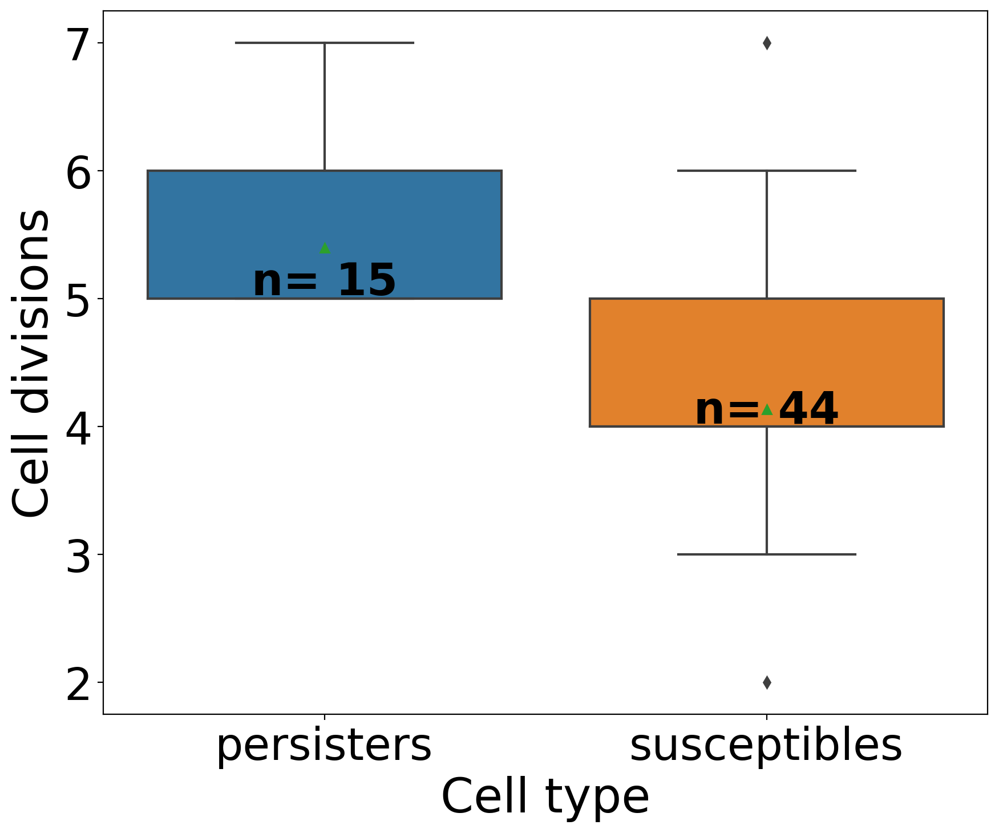

In [ ]:
bp = sns.boxplot(x="type", y='count', data=counts, showmeans=True)
bp.set_xlabel('Cell type', fontsize=30)
bp.tick_params(axis='both', which='major', labelsize=28)
bp.set_ylabel('Cell divisions',  fontsize=30)
#bp.set_title('Number of cell divisions during deep stationary phase', fontsize=22)
# Calculate number of obs per group & median to position labels
medians = counts.groupby(['type'])['count'].median().values
nobs = counts.groupby(['type'])['count'].count().values
nobs = [str(x) for x in nobs.tolist()]
nobs = ["n= " + i for i in nobs]

# Add it to the plot
pos = range(len(nobs))
for tick,label in zip(pos,bp.get_xticklabels()):
    bp.text(pos[tick],
            medians[tick] + 0.03,
            nobs[tick],
            horizontalalignment='center',
            size=28,
            color='k',
            weight='semibold')
plt.show
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
plt.savefig('cell_divisions_stat_phase.pdf', dpi=300)

In [ ]:
#Cell division times
df_deepstat_no_sisters=df_deepstat_no_sisters[(df_deepstat_no_sisters['NextDivisionFrame'] < 93)]
#df_deepstat['NextDivisionFrame'].fillna(0, inplace=True) #remove NaNs from 'NextDivisionFrame'
# group by 'type' and 'lin_id_str2', then sort 'NextDivisionFrame' values in descending order
t = df_deepstat_no_sisters.groupby(['type', 'lin_id_str2'])['NextDivisionFrame'].unique().reset_index(name='division_times')
# select the second-to-last value from each 'division_times' array
t['last_division_hrs'] = t['division_times'].apply(lambda x: max(x))
#frequency of divisions
t['div_freq']= t['division_times'].apply(lambda x: len(x)/10)
#Time of last division before treatment
t['last_division_before_treatment']=t['last_division_hrs']*10/60
t['time_since_last_division_before_treatment']=15.5-t['last_division_hrs']*10/60

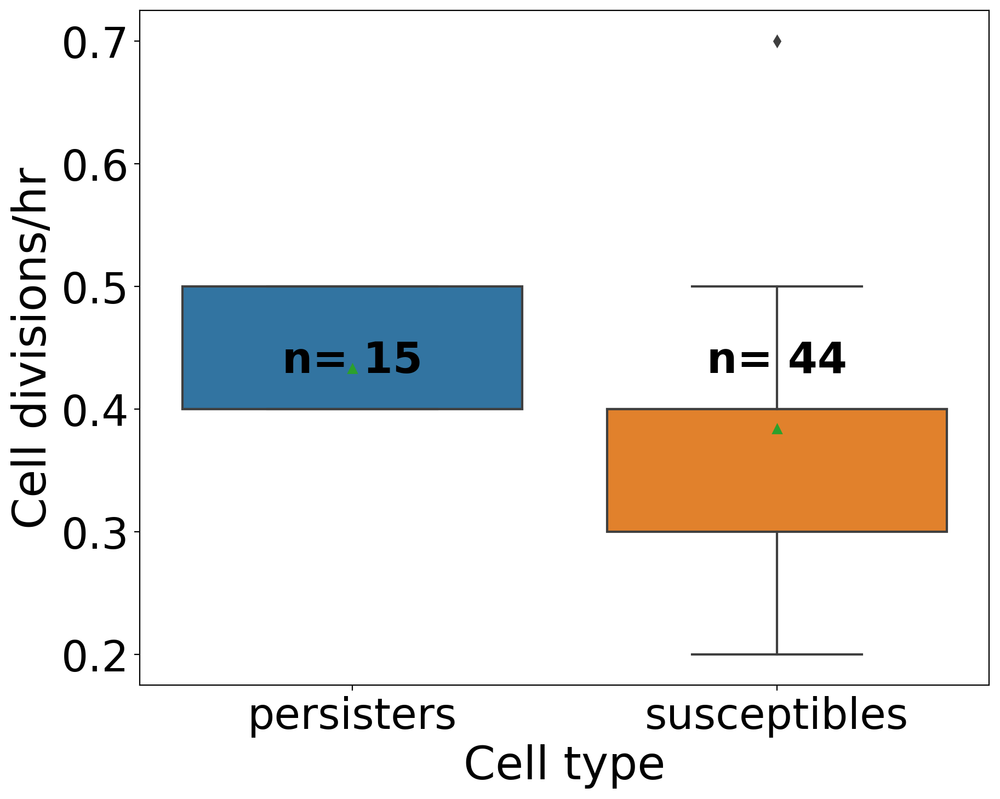

In [ ]:
bp = sns.boxplot(x="type", y='div_freq', data=t, showmeans=True)
bp.set_xlabel('Cell type', fontsize=30)
bp.tick_params(axis='both', which='major', labelsize=28)
bp.set_ylabel('Cell divisions/hr',  fontsize=30)
#bp.set_title('Frequency of cell divisions during deep stationary phase', fontsize=22)
# Calculate number of obs per group & median to position labels
medians = t.groupby(['type'])['div_freq'].median().values
nobs = t.groupby(['type'])['div_freq'].count().values
nobs = [str(x) for x in nobs.tolist()]
nobs = ["n= " + i for i in nobs]

# Add it to the plot
pos = range(len(nobs))
for tick,label in zip(pos,bp.get_xticklabels()):
    bp.text(pos[tick],
            medians[tick] + 0.03,
            nobs[tick],
            horizontalalignment='center',
            size=28,
            color='k',
            weight='semibold')
plt.show
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
plt.savefig('freq_divisions_stat_phase.pdf', dpi=300)

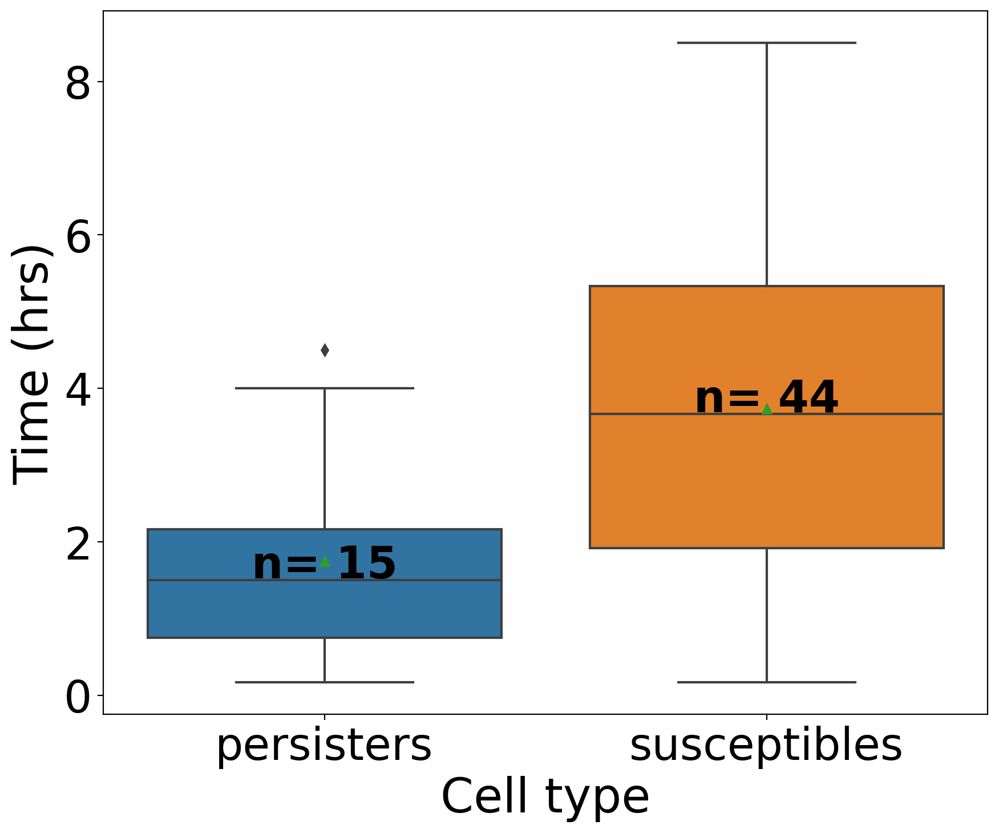

In [ ]:
bp_t_div = sns.boxplot(x="type", y='time_since_last_division_before_treatment', data=t, showmeans=True)
bp_t_div.set_xlabel('Cell type', fontsize=30)
bp_t_div.tick_params(axis='both', which='major', labelsize=28)
bp_t_div.set_ylabel('Time (hrs)',  fontsize=30)
#bp_t_div.set_title('Time since last division before drug treatment', fontsize=22)
# Calculate number of obs per group & median to position labels
medians = t.groupby(['type'])['time_since_last_division_before_treatment'].median().values
nobs = t.groupby(['type'])['time_since_last_division_before_treatment'].count().values
nobs = [str(x) for x in nobs.tolist()]
nobs = ["n= " + i for i in nobs]

# Add it to the plot
pos = range(len(nobs))
for tick,label in zip(pos,bp_t_div.get_xticklabels()):
    bp_t_div.text(pos[tick],
            medians[tick] + 0.03,
            nobs[tick],
            horizontalalignment='center',
            size=28,
            color='k',
            weight='semibold')
 
plt.show
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
plt.savefig('time_since_last_division_before_treatment.pdf', dpi=300)

In [ ]:
df.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,FeretMax_unit,NextDivisionTime,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,type,rfp_gfp_ratio
17,xy02,2,0-20-0,0,0,0.000000,A,2.0,NaN,NaN,...,3.7706,0.333333,20,0,2-20-A,xy02-0-20-0,2-20,233,persisters,0.652059
46,xy02,2,1-20-0,1,0,0.166667,A,2.0,NaN,NaN,...,4.8140,0.333333,20,0,2-20-A,xy02-1-20-0,2-20,233,persisters,0.764175
75,xy02,2,2-20-0,2,0,0.333333,AH,4.0,2.0,NaN,...,3.0557,0.666667,20,0,2-20-AH,xy02-2-20-0,2-20,234,persisters,0.559255
106,xy02,2,3-20-0,3,0,0.500000,AH,4.0,2.0,NaN,...,3.7073,0.666667,20,0,2-20-AH,xy02-3-20-0,2-20,234,persisters,0.660178
134,xy02,2,4-20-0,4,0,0.666667,AHH,15.0,4.0,NaN,...,2.4734,2.500000,20,0,2-20-AHH,xy02-4-20-0,2-20,235,persisters,0.462329


In [ ]:
#Selection of persisters, susceptible sisters, and susceptible cells
df_t = df[(df['lin_id_str2']=="6-4") | (df['lin_id_str2']=="6-14") | (df['lin_id_str2']=="30-19") | (df['lin_id_str2']=="6-11") | (df['lin_id_str2']=="3-2") | (df['lin_id_str2']=="6-0")] #select cells for plots

In [ ]:
df_t.head()
#df_t.columns
np.unique(df_t['type'])

array(['persisters', 'susceptibles'], dtype=object)

In [ ]:
g = sns.FacetGrid(df_t, col='lin_id_str2',sharex=False, sharey=False, col_wrap=3, height=3, aspect=1.5, margin_titles=True,  hue='type')
g.map_dataframe(sns.lineplot, x='Time' , y='SpineLength_unit_feature',lw=2.5)
g.add_legend(fontsize=18)
g.map(plt.axvline, x=17, color='gray', lw=3, ls='--')
g.map(plt.axvspan, xmin=3, xmax=15.5, color='gray', alpha=0.1)
g.map(plt.axvspan, xmin=15.6, xmax=18.5, color='bisque', alpha=0.4)
g.set_axis_labels('Time (hrs)','Cell length (um)', fontsize=18)
g.set(xlim=(0,45), ylim=(0,6))
#g.set_titles(col_template='Position ID: {col_name}', fontsize=18)
g.set_titles(col_template='', fontsize=18)
for ax in g.axes.flat:
    ax.tick_params(labelsize=16)
plt.show()
fig = plt.gcf()  # Get the current figure
fig.set_size_inches(10, 8)
g.savefig('2022-05-26_DIMM_length.svg', format='svg')
g.savefig('2022-05-26_DIMM_length.pdf', dpi=300)


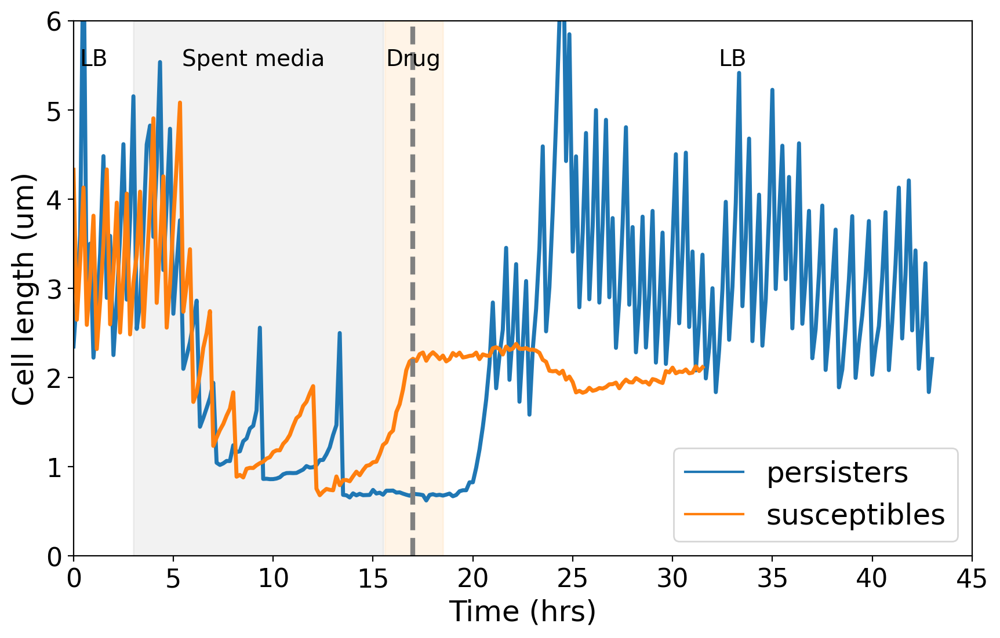

In [ ]:
#dataset without susceptible sisters
df_t_no_sisters = df[(df['type']!='susceptible_sisters')]
#examples of persister and susceptible cells pais (no susceptible sister)
df_t1 = df_t_no_sisters[(df_t_no_sisters['lin_id_str2']=="6-4") | (df_t_no_sisters['lin_id_str2']=="6-11") ] #select cells for plots 
df_t2 = df_t_no_sisters[(df_t_no_sisters['lin_id_str2']=="6-14")| (df_t_no_sisters['lin_id_str2']=="3-2")] #select cells for plots 
df_t3 = df_t_no_sisters[(df_t_no_sisters['lin_id_str2']=="30-19")| (df_t_no_sisters['lin_id_str2']=="6-0")] #select cells for plots 

# Create the line plot
plt.figure(figsize=(10, 6))  # Set the figure size
sns.lineplot(data=df_t1, x='Time', y='SpineLength_unit_feature', hue='type', lw=2.5) #modify df accordingly

# Add vertical lines and spans
plt.axvline(x=17, color='gray', lw=3, ls='--')
plt.axvspan(xmin=3, xmax=15.5, color='gray', alpha=0.1)
plt.axvspan(xmin=15.6, xmax=18.5, color='bisque', alpha=0.4)
plt.text(1, 5.5, 'LB', fontsize=14, color='black', ha='center')
plt.text(9, 5.5, 'Spent media', fontsize=14, color='black', ha='center')
plt.text(17, 5.5, 'Drug', fontsize=14, color='black', ha='center')
plt.text(33, 5.5, 'LB', fontsize=14, color='black', ha='center')


# Set labels and limits
plt.xlabel('Time (hrs)', fontsize=18)
plt.ylabel('Cell length (um)', fontsize=18)
plt.xlim(0, 45)
plt.ylim(0, 6)

# Add legend
plt.legend(loc='lower right', fontsize=18)

# Set title
#plt.title('Line Plot', fontsize=18)

# Set tick label size
plt.xticks(fontsize=16)
plt.yticks(fontsize=16)

# Save the figure
plt.savefig('peristers_ex1.svg', format='svg')  # Save as PNG
plt.savefig('peristers_ex1.pdf', format='pdf', dpi=300)  # Save as PDF

# Show the plot
plt.show()


<class 'pandas.core.frame.DataFrame'>
Index: 14059 entries, 17 to 80743
Data columns (total 3 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   lin_id_str2    14059 non-null  object 
 1   Frame          14059 non-null  int64  
 2   rfp_gfp_ratio  14059 non-null  float64
dtypes: float64(1), int64(1), object(1)
memory usage: 439.3+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 477 entries, 1 to 477
Data columns (total 59 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2-0     259 non-null    float64
 1   2-18    205 non-null    float64
 2   2-20    307 non-null    float64
 3   2-23    102 non-null    float64
 4   20-19   305 non-null    float64
 5   3-11    259 non-null    float64
 6   3-13    125 non-null    float64
 7   3-14    184 non-null    float64
 8   3-17    259 non-null    float64
 9   3-19    259 non-null    float64
 10  3-2     259 non-null    float64
 11  3-20    194 non-null    fl

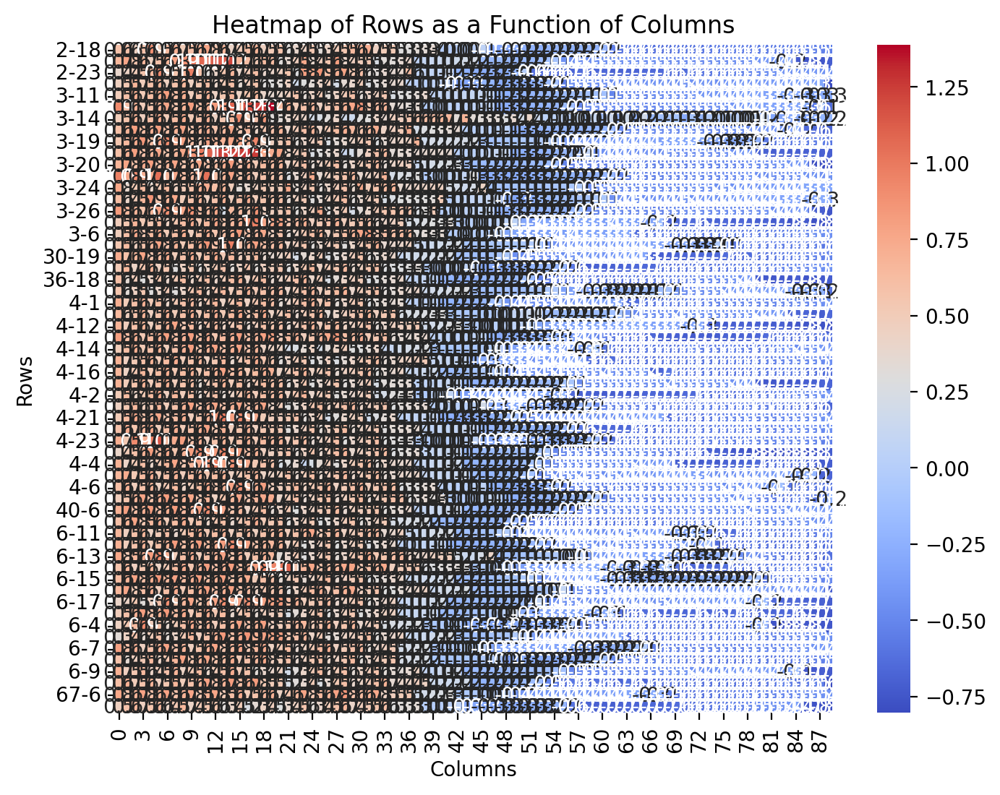

: 

In [ ]:
#heatmap dataframe
df_heatmap_timer = df[['lin_id_str2', 'Frame', 'rfp_gfp_ratio']].copy()
df_heatmap_timer.info()
spread_df_heatmaptimer= df_heatmap_timer.groupby('lin_id_str2').apply(lambda x: x.assign(Frame=np.arange(1,len(x)+1))).pivot(index='Frame', columns='lin_id_str2', values='rfp_gfp_ratio')
spread_df_heatmaptimer.info()
spread_df_heatmaptimer= spread_df_heatmaptimer.dropna()
spread_df_heatmaptimer.info

trans_df_heatmap_timer = spread_df_heatmaptimer.iloc[:,1:].T
# trans_df_heatmap_timer.columns = np.arange(len(trans_df_heatmap_timer.columns))
# #trans_df_heatmap_timer.index= df_heatmap_timer['lin_id_str2'].unique()

# n_frames =len(trans_df_heatmap_timer.columns)
# df_heatmaps = pd.DataFrame(trans_df_heatmap_timer)
# df_heatmaps.columns = np.arange(n_frames + 1)
# df_heatmaps.index = df_heatmap_timer['lin_id_str2'].unique()

plt.figure(figsize=(8, 6))
sns.heatmap(trans_df_heatmap_timer, cmap='coolwarm', annot=True, fmt=".1f")

# Customize labels and title
plt.xlabel('Columns')
plt.ylabel('Rows')
plt.title('Heatmap of Rows as a Function of Columns')

# Display the heatmap
plt.show()



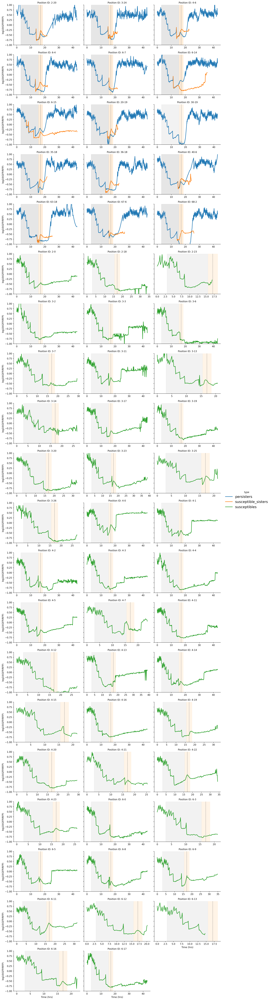

In [ ]:
g = sns.FacetGrid(df, col='lin_id_str2',sharex=False, sharey=True, col_wrap=3, height=3, aspect=1.5 , margin_titles=True,  hue='type')
g.map_dataframe(sns.lineplot, x='Time' , y='rfp_gfp_ratio',lw=2)
g.add_legend(fontsize=15)
g.map(plt.axvline, x=17, color='gray', lw=1, ls='--')
g.map(plt.axvspan, xmin=3, xmax=15.5, color='gray', alpha=0.1)
g.map(plt.axvspan, xmin=15.6,xmax=18.5, color='bisque', alpha=0.4)
g.set_axis_labels('Time (hrs)','log10(GFP/RFP)')
g.set(ylim=(-1,1))
g.set_titles(col_template='Position ID: {col_name}')
plt.show()
g.savefig('2022-05-26_DIMM_timer_gfp_rfp.pdf', dpi=300)

In [ ]:
cells_for_liveplot = df[(df['lin_id_str2']=="2-20") & (df['Frame'] > 94) & (df['Frame'] < 111)]
cells_for_liveplot.tail()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,FeretMax_unit,NextDivisionTime,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,type,rfp_gfp_ratio
3299,xy02,2,106-20-1,106,1,17.666667,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5721,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-106-20-1,2-20,378,susceptible_sisters,-0.325482
3325,xy02,2,107-20-1,107,1,17.833333,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5077,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-107-20-1,2-20,378,susceptible_sisters,-0.380927
3350,xy02,2,108-20-1,108,1,18.000000,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5077,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-108-20-1,2-20,378,susceptible_sisters,-0.384933
3375,xy02,2,109-20-1,109,1,18.166667,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5654,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-109-20-1,2-20,378,susceptible_sisters,-0.399834
3401,xy02,2,110-20-1,110,1,18.333333,AHHHHHHHHHHHT,NaN,84.0,NaN,...,1.5006,NaN,20,1,2-20-AHHHHHHHHHHHT,xy02-110-20-1,2-20,378,susceptible_sisters,-0.434726


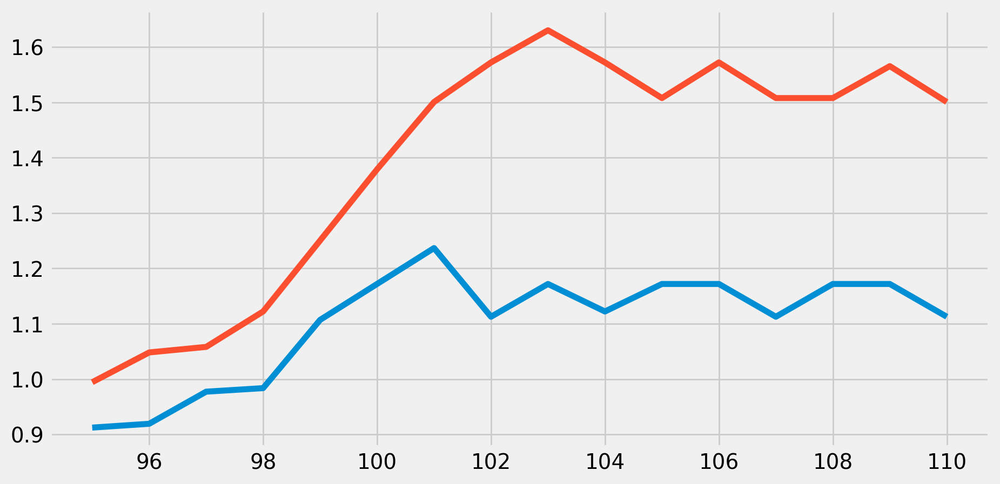

In [ ]:
#plt.plot(df[df['lin_id_str2']=="2-20"]['Frame']*10/60, df[df['lin_id_str2']=="2-20"]['FeretMax_unit'])
plt.plot(cells_for_liveplot[cells_for_liveplot['type']=='persisters']['Frame'], cells_for_liveplot[cells_for_liveplot['type']=='persisters']['FeretMax_unit'])
plt.plot(cells_for_liveplot[cells_for_liveplot['type']=='susceptible_sisters']['Frame'], cells_for_liveplot[cells_for_liveplot['type']=='susceptible_sisters']['FeretMax_unit'])


In [ ]:


#liveplot of 2 sister cells with different fates
def animate(i):
    plt.cla()
    data = cells_for_liveplot
    x =  data['Frame']
    y1 = data[data['type']=='persisters']['FeretMax_unit'] 
    y2 = data[data['type']=='susceptible_sisters']['FeretMax_unit']

    plt.plot(x, y1, label='persisters')
    plt.plot(x, y2, label='susceptible_sister')

    plt.legend(loc='upper left')
    plt.tight_layout()

ani = FuncAnimation(plt.gcf(), animate, interval=1000, frames= 10, repeat= False)

plt.tight_layout()
plt.show()

<IPython.core.display.Javascript object>

/Users/hernan0000/miniconda3/envs/i2i_env/lib/python3.9/site-packages/matplotlib/animation.py:884: UserWarning: Animation was deleted without rendering anything. This is most likely not intended. To prevent deletion, assign the Animation to a variable, e.g. `anim`, that exists until you output the Animation using `plt.show()` or `anim.save()`.
  warnings.warn(


: 

In [ ]:
#sister cells during treatment
df_deepstat_only_sisters=df[(df['Frame'] > 94) & (df['Frame'] < 111) & (df['type']!='susceptibles')] #exclude 'susceptibles' 

#elongation rate of sisters cells

frm_interval = 10./60 #frame interval in minutes
gamma = 0.0015 #protein degradation constant in 1/min

mu = df_deepstat_only_sisters.groupby('lin_id_str2')['SpineLength_unit_feature'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
df_deepstat_only_sisters['mu'] = mu

#et_ddt_gfp_rfp = df.groupby(['type', 'lin_id_str2'])['rfp_gfp_ratio'].rolling(5, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['et_ddt_gfp'] = et_ddt_gfp

/var/folders/yb/_xf4lxss6n9g0n8frp24vv7w0000gn/T/ipykernel_31928/2377877166.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_deepstat_only_sisters['mu'] = mu


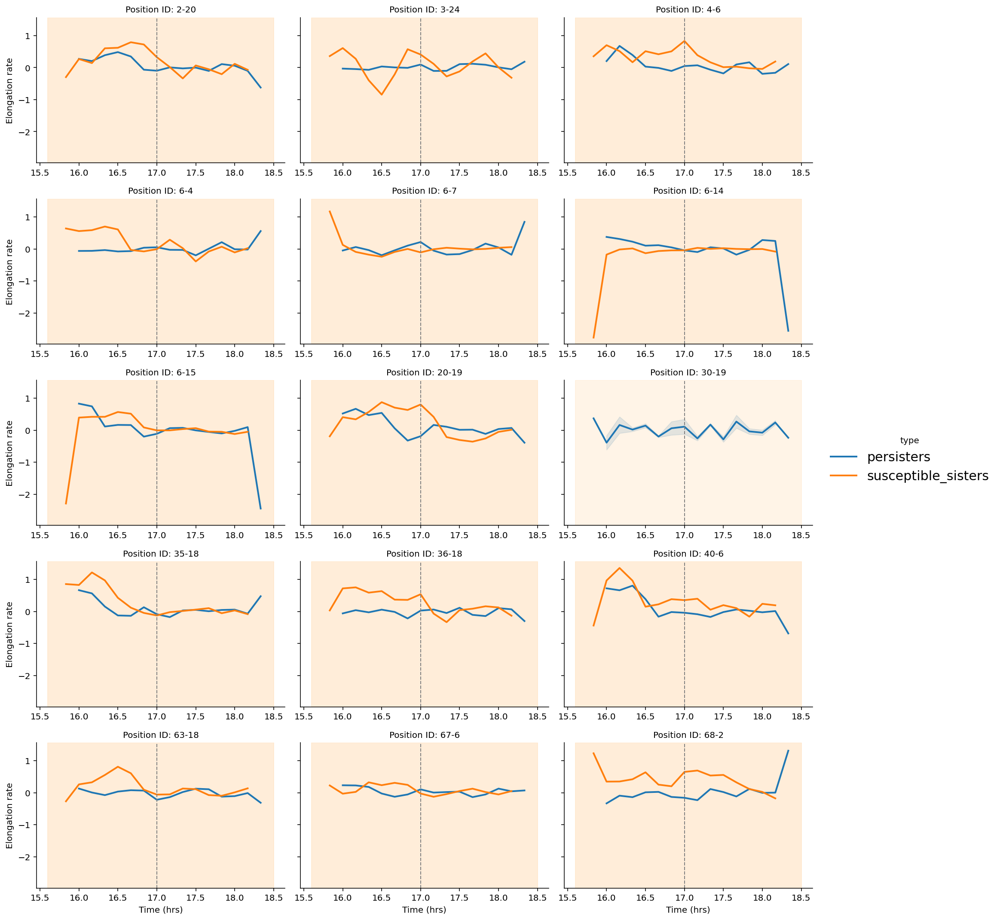

In [ ]:
#plot elongation rates
g = sns.FacetGrid(df_deepstat_only_sisters, col='lin_id_str2',sharex=False, sharey=True, col_wrap=3, height=3, aspect=1.5 , margin_titles=True,  hue='type')
g.map_dataframe(sns.lineplot, x='Time' , y='mu',lw=2)
g.add_legend(fontsize=15)
g.map(plt.axvline, x=17, color='gray', lw=1, ls='--')
#g.map(plt.axvspan, xmin=3, xmax=15.5, color='gray', alpha=0.1)
g.map(plt.axvspan, xmin=15.6,xmax=18.5, color='bisque', alpha=0.4)
g.set_axis_labels('Time (hrs)','Elongation rate')
#g.set(ylim=(-1,1))
g.set_titles(col_template='Position ID: {col_name}')
plt.show()
g.savefig('2022-05-26_DIMM_timer_elongation_rate.pdf', dpi=300)

In [ ]:
#
persisters_17=result.loc[(result['Frame']== 103) & (result['type'] == 'persisters')]
susceptible_sisters_17=result.loc[(result['Frame']== 103) & (result['type'] == 'susceptible_sisters')]
susceptible_17=result.loc[(result['Frame']== 103) & (result['type'] == 'susceptibles')]
t_17 = [persisters_17, susceptible_sisters_17, susceptible_17]
result_t_17 = pd.concat(t_17)

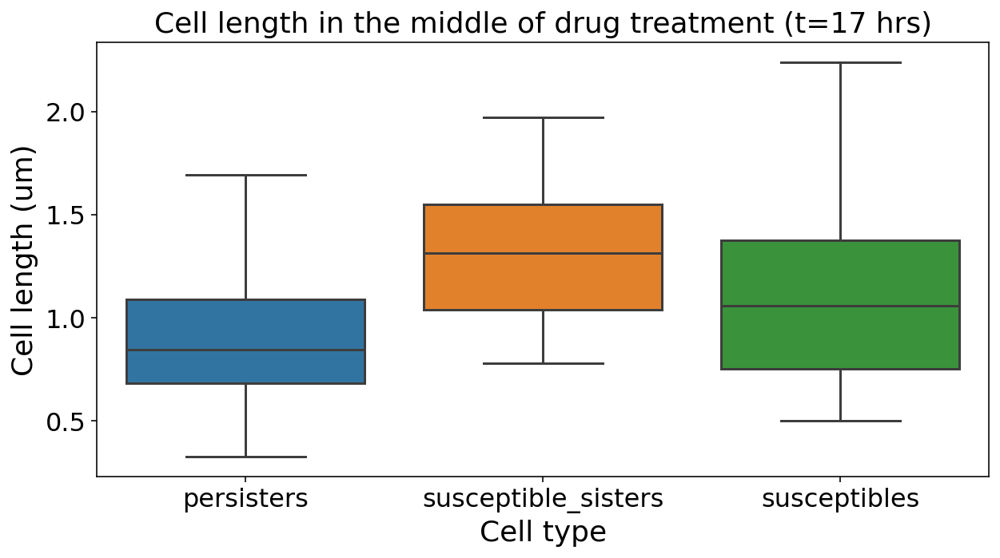

In [ ]:
bp = sns.boxplot(x="type", y='Spinelength_unit', data=result_t_17)
bp.set_xlabel('Cell type', fontsize=18)
bp.tick_params(axis='both', which='major', labelsize=16)
bp.set_ylabel('Cell length (um)',  fontsize=18)
bp.set_title('Cell length in the middle of drug treatment (t=17 hrs)', fontsize=18)
plt.show
plt.savefig('2022-05-26_DIMM_timer_17hrs.pdf', dpi=300)

<AxesSubplot:xlabel='Frame', ylabel='Spinelength'>

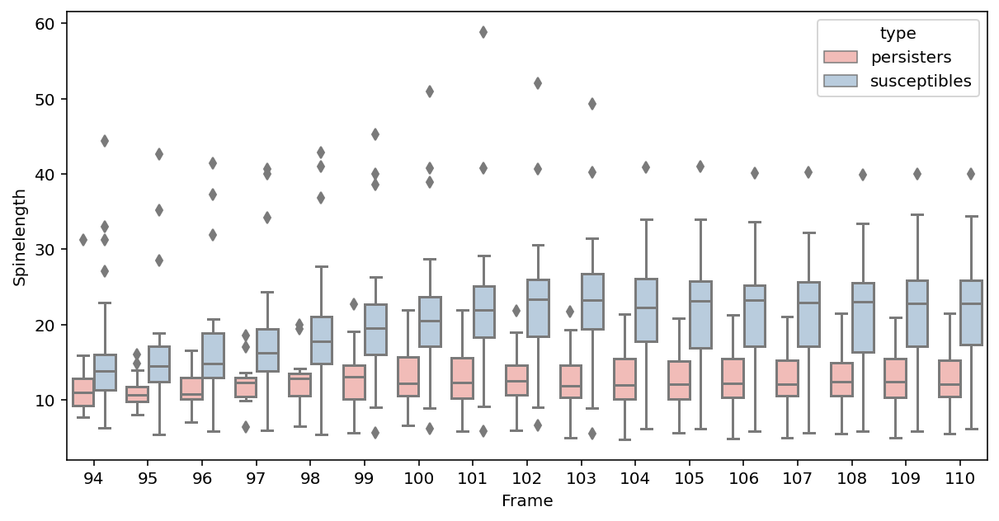

In [ ]:
result1=(result[(result['Frame'] > 93) & (result['Frame'] < 111)])
sns.boxplot(x="Frame", y='Spinelength', hue="type", data=result1, palette="Pastel1")
#plt.ylim(200, 360)
#plt.show()

<AxesSubplot:xlabel='Frame', ylabel='Spinelength'>

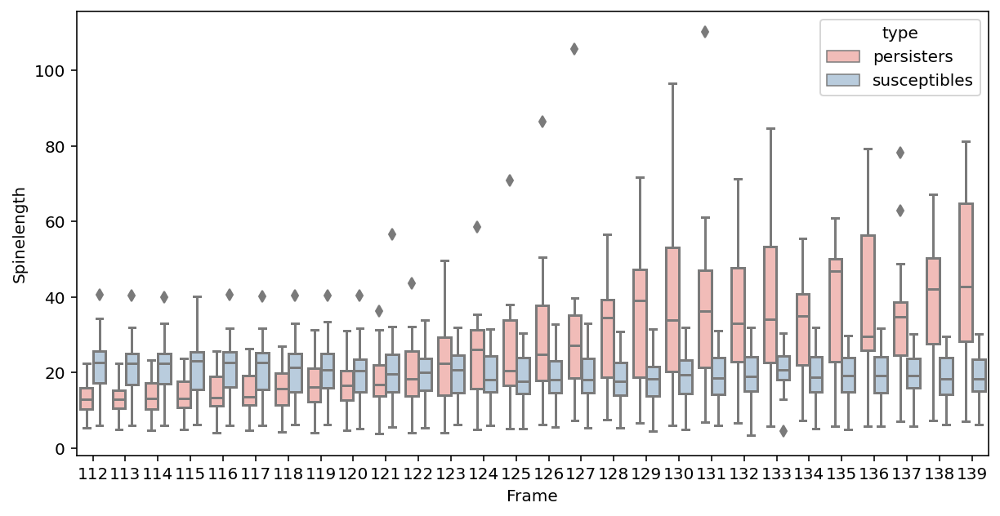

In [ ]:
result2=(result[(result['Frame'] > 111) & (result['Frame'] < 140)])
sns.boxplot(x="Frame", y='Spinelength', hue="type", data=result2, palette="Pastel1")
#plt.ylim(200, 360)
#plt.show()

In [ ]:
resultx = result.groupby(['type','Frame'])['Spinelength'].describe().unstack()
resultx.tail()

count                                               ...      max  \
Frame          12   13   14   15   16   17   18   19   20   21   ...      249   
type                                                             ...            
persisters     1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  1.0  ...  67.0172   
susceptibles   NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  ...      NaN   

                                                                               \
Frame              250      251      252      253      254      255       256   
type                                                                            
persisters    100.4455  64.8152  70.0069  77.1293  83.3822  93.4729  115.7504   
susceptibles       NaN      NaN      NaN      NaN      NaN      NaN       NaN   

                                
Frame              257     258  
type                            
persisters    150.0013  54.183  
susceptibles       NaN     NaN  

[2 rows x 1976 columns]

In [ ]:
persisters1 = result.query('type == "persisters"')['Spinelength']
susceptibles1 = result.query('type == "susceptibles"')['Spinelength']
test = result.groupby(['PositionIdx', 'type'])
test.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,FeretMax_unit,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,type,rfp_gfp_ratio,scaled
17,xy02,2,0-20-0,0,0,0.000000,A,2.0,NaN,NaN,...,3.7706,20,0,2-20-A,xy02-0-20-0,2-20,233,persisters,-0.307834,55.779944
46,xy02,2,1-20-0,1,0,0.166667,A,2.0,NaN,NaN,...,4.8140,20,0,2-20-A,xy02-1-20-0,2-20,233,persisters,-0.323820,71.413775
75,xy02,2,2-20-0,2,0,0.333333,AH,4.0,2.0,NaN,...,3.0557,20,0,2-20-AH,xy02-2-20-0,2-20,238,persisters,-0.321701,44.616878
106,xy02,2,3-20-0,3,0,0.500000,AH,4.0,2.0,NaN,...,3.7073,20,0,2-20-AH,xy02-3-20-0,2-20,238,persisters,-0.363945,54.664561
134,xy02,2,4-20-0,4,0,0.666667,AHH,NaN,4.0,NaN,...,2.4734,20,0,2-20-AHH,xy02-4-20-0,2-20,239,persisters,-0.343125,35.166119
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54111,xy06,6,0-0-0,0,0,0.000000,A,3.0,NaN,NaN,...,3.3175,0,0,6-0-A,xy06-0-0-0,6-0,20812,susceptibles,-0.315100,48.739951
54123,xy06,6,0-3-0,0,0,0.000000,A,4.0,NaN,NaN,...,2.7424,3,0,6-3-A,xy06-0-3-0,6-3,22653,susceptibles,-0.214025,40.461498
54130,xy06,6,0-5-0,0,0,0.000000,A,3.0,NaN,NaN,...,2.2186,5,0,6-5-A,xy06-0-5-0,6-5,23012,susceptibles,-0.063119,31.732276
54140,xy06,6,0-8-0,0,0,0.000000,A,1.0,NaN,NaN,...,3.5803,8,0,6-8-A,xy06-0-8-0,6-8,23371,susceptibles,-0.144419,52.978409


In [ ]:
#tt_df.groupby('Frame').apply(lambda result: stats.ttest_ind(result['type'], result['Spinelength']))
from scipy.stats import ttest_ind

#ttest_ind(persisters1['Spinelength'], susceptibles1['Spinelength'], equal_var=False)


NameError: name 'tt_df' is not defined

In [ ]:
df_persisters =pd.read_csv(selections, sep=';')
df_persisters.tail()
df_susceptibles = df_persisters
df_susceptibles.PositionIdx = df_susceptibles.PositionIdx + 1
df_susceptibles.tail()

In [ ]:
#filtering persister cells that is not mother
persisters = df[df['lin_id_str'].isin(df_selections['lin_id_str'])]
print(len(np.unique(persisters['lin_id_str'])))

#df = df[df['ChannelIdx'] == 15]
#df = df[df['CellPosChannel'] == 3]
#df= df[(df['Frame'] > 87)& (df['Frame'] < 105)]
#df.tail()
#mask = df['Position'].str.contains('xy[14-15]', regex = True, case=False, na=False)
#df[mask].sample(3)
#data['type'].isin(['TV Show'])
#df[mask].head()
#df['Position'].str.contains('String').tolist()
#print([pattern in i for i in df['Position']])

1861


In [ ]:
test = persisters[persisters['lin_id_str']==np.unique(persisters['lin_id_str'])[0]]
test.head()
len(test['Frame'])

1

In [ ]:
print(np.unique(persisters['lin_id_str2']))

['2-20' '20-19' '3-24' '30-19' '35-18' '36-18' '4-6' '40-6' '6-14' '6-15'
 '6-4' '6-7' '63-18' '67-6' '68-2' '7-10']


In [ ]:
persisters= persisters[(persisters['Frame'] > 60) & (persisters['Frame'] < 104)]
#persisters.set_index('Frame', inplace=True)
#persisters.groupby('lin_id_str2')['Spinelength'].plot(legend=True)
persisters.groupby(['lin_id_str2'], sort=False)['Frame'].max()

lin_id_str2
40-6     103
63-18    103
30-19    103
20-19    103
7-10     103
67-6     103
35-18    103
2-20     103
68-2     103
3-24     103
36-18    103
4-6      103
6-15     103
6-7      103
6-4      103
6-14     103
Name: Frame, dtype: int64

AttributeError: module 'seaborn' has no attribute 'histplot'

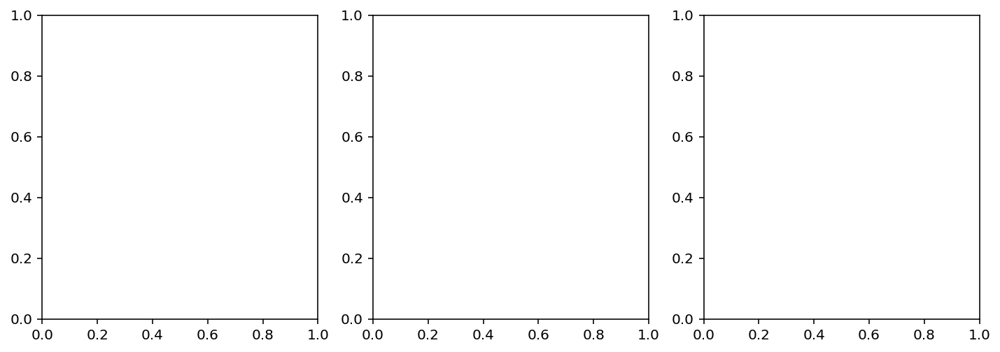

In [ ]:
import seaborn as sns

df['Length'] = df['Spinelength']

#get first and last frame of all cells
df_first_frame = df.groupby('lin_id_str').first()
df_last_frame = df.groupby('lin_id_str').last()

#we only want cells of which we have observed the full lineage
#and exclude the ones that have no offspring (d1_lin_id=-1)
#we can filter these out with:
df_first_frame = df_first_frame.loc[~np.isnan(df_first_frame['NextDivisionFrame'])]
df_last_frame = df_last_frame.loc[~np.isnan(df_last_frame['NextDivisionFrame'])]

fig, axs = plt.subplots(1,3, figsize=(12,4))
sns.histplot(ax=axs[0], data=df_first_frame, x='Length', )
sns.histplot(ax=axs[1], data=df_last_frame, x='Length')
sns.scatterplot(ax=axs[2], x=df_first_frame['Length'], y=df_last_frame['Length'])

for ax in axs: ax.set(xlim=(0,20)) 
axs[2].set(ylim=(0,20))

titles = ['length at birth', 'length at division', 'length at division vs length at birth'] 
for idx, title in enumerate(titles): axs[idx].set_title(title)

In [ ]:
def derivative(y, frm_interval=1, log = False):
    if y.size > 2:
        y = np.log(y) if log else y
        x = np.arange(y.size) * frm_interval
        p = np.polyfit(x, y, 1) #simply 1st order polynomial fit / regression (numpy.polyfit)
        ddt = p[0] #slope of first order fit in python p[0]
    else: 
        ddt = np.nan 
    return ddt


/var/folders/pj/9g_0_z050zx43lq_qyxg5zzw002m_z/T/ipykernel_25998/3340614786.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  result0['lin_mu'] = lin_mu


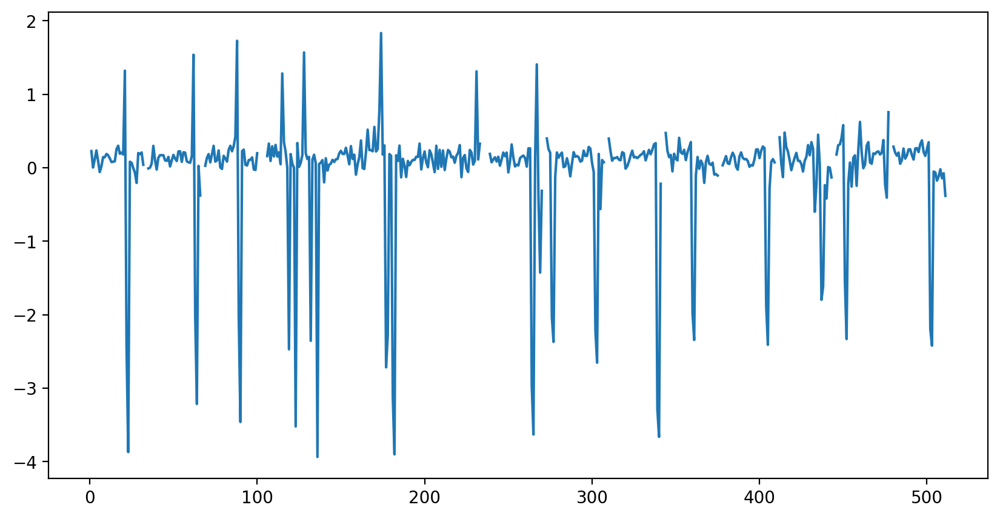

In [ ]:
frm_interval = 10./60 #frame interval in minutes
gamma = 0.0015 #protein degradation constant in 1/min

lin_mu = df_deepstat.groupby('lin_id_str2')['Spinelength_unit_feature'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
result0['lin_mu'] = lin_mu
result0['lin_mu'].tail()
plt.plot(range(0, len(result0['lin_mu'])), result0['lin_mu'])

#lin_mu_size = df.groupby('lin_id_str')['Size'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
#df['lin_mu_size'] = lin_mu_size

#lin_ddt_gfp = df.groupby('lin_id_str')['MeanIntensityGFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['lin_ddt_gfp'] = lin_ddt_gfp

#lin_ddt_rfp = df.groupby('lin_id_str')['MeanIntensityRFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['lin_ddt_rfp'] = lin_ddt_rfp

#df['lin_promoter_act_G'] = (gamma + df['lin_mu'] ) * df['MeanIntensityGFP'] + df['lin_ddt_gfp']
#df['lin_promoter_act_R'] = (gamma + df['lin_mu'] ) * df['MeanIntensityRFP'] + df['lin_ddt_rfp']



In [ ]:
frm_interval = 10./60 #frame interval in minutes
gamma = 0.0015 #protein degradation constant in 1/min

lin_mu = persisters.groupby('lin_id_str')['Spinelength'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
df['lin_mu'] = lin_mu

lin_mu_size = persisters.groupby('lin_id_str')['Size'].rolling(3, min_periods=3, center=True).apply(derivative, kwargs={'frm_interval':frm_interval,'log':True}).reset_index(0,drop=True)
df['lin_mu_size'] = lin_mu_size

lin_ddt_gfp = persisters.groupby('lin_id_str')['MeanIntensityGFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
df['lin_ddt_gfp'] = lin_ddt_gfp

#lin_ddt_rfp = df.groupby('lin_id_str')['MeanIntensityRFP'].rolling(5, min_periods=5, center=True).apply(derivative, kwargs={'frm_interval':frm_interval}).reset_index(0,drop=True)
#df['lin_ddt_rfp'] = lin_ddt_rfp

#df['lin_promoter_act_G'] = (gamma + df['lin_mu'] ) * df['MeanIntensityGFP'] + df['lin_ddt_gfp']
#df['lin_promoter_act_R'] = (gamma + df['lin_mu'] ) * df['MeanIntensityRFP'] + df['lin_ddt_rfp']

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,Spinelength,MeanIntensityGFP,SpineWidth,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,cumsum
7878,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46,0,86-15-2,86,2,344.0,AHHHHHHHHHHHHHTHH,NaN,86.0,NaN,...,14.1165,295.2784,4.9396,15,2,0-15-AHHHHHHHHHHHHHTHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46-15,16465,48.986018
8010,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46,0,87-15-2,87,2,348.0,AHHHHHHHHHHHHHTHH,NaN,86.0,NaN,...,13.6497,276.3939,5.5906,15,2,0-15-AHHHHHHHHHHHHHTHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46-15,16596,48.986018
8147,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46,0,88-15-2,88,2,352.0,AHHHHHHHHHHHHHTHH,NaN,86.0,NaN,...,14.6016,283.8077,5.5807,15,2,0-15-AHHHHHHHHHHHHHTHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46-15,16730,48.986018
8285,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46,0,89-15-2,89,2,356.0,AHHHHHHHHHHHHHTHH,NaN,86.0,NaN,...,13.9694,281.5743,5.5251,15,2,0-15-AHHHHHHHHHHHHHTHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46-15,16869,48.986018
8418,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46,0,90-15-2,90,2,360.0,AHHHHHHHHHHHHHTHH,NaN,86.0,NaN,...,14.1122,280.1100,5.4143,15,2,0-15-AHHHHHHHHHHHHHTHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46-15,17082,48.986018


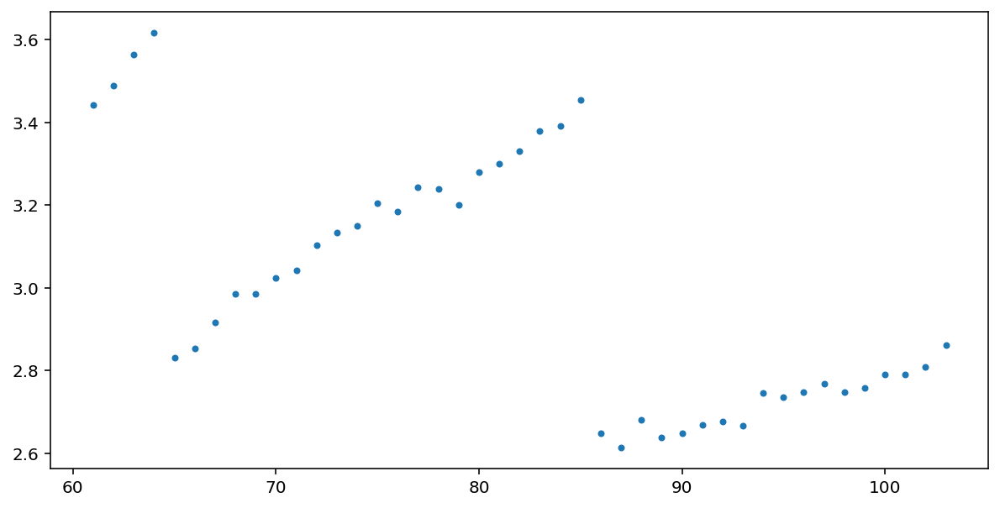

In [ ]:
p1=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[0])]
plt.plot(p1["Frame"],np.log(p1["Spinelength"]),'.')
p1= p1[p1['Frame'] > 85]
p1['cumsum'] = sum(np.log(p1["Spinelength"]))
p1.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,Spinelength,MeanIntensityGFP,SpineWidth,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,cumsum
24735,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,80-1-1,80,1,320.0,AHHHHHHHHHHHHHHHT,NaN,80.0,NaN,...,10.2250,271.2703,5.1055,1,1,1-1-AHHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-1,34018,53.773967
24858,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,81-1-1,81,1,324.0,AHHHHHHHHHHHHHHHT,NaN,80.0,NaN,...,11.3915,267.7407,5.1139,1,1,1-1-AHHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-1,34141,53.773967
24985,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,82-1-1,82,1,328.0,AHHHHHHHHHHHHHHHT,NaN,80.0,NaN,...,12.2259,273.7143,4.9485,1,1,1-1-AHHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-1,34268,53.773967
25099,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,83-1-1,83,1,332.0,AHHHHHHHHHHHHHHHT,NaN,80.0,NaN,...,10.7482,265.8961,4.7917,1,1,1-1-AHHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-1,34382,53.773967
25220,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,84-1-1,84,1,336.0,AHHHHHHHHHHHHHHHT,NaN,80.0,NaN,...,12.9696,268.3407,5.2794,1,1,1-1-AHHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-1,34503,53.773967


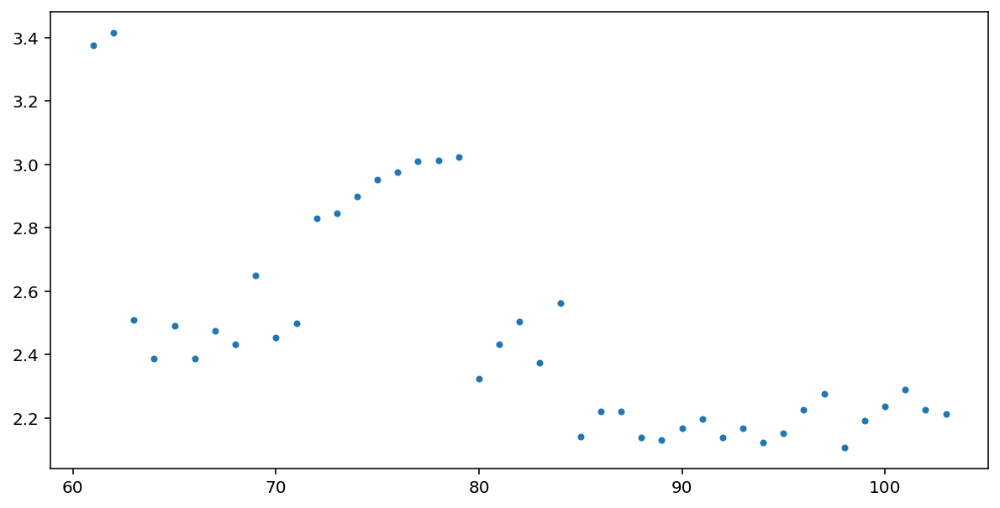

In [ ]:
p2=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[1])]
plt.plot(p2["Frame"],np.log(p2["Spinelength"]),'.')
p2= p2[p2['Frame'] > 80]
p2['cumsum'] = sum(np.log(p2["Spinelength"]))
p2.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,Spinelength,MeanIntensityGFP,SpineWidth,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,cumsum
25813,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,89-7-4,89,4,356.0,AHHHHHHHHHHHHHTTHT,99.0,89.0,NaN,...,17.7340,319.7788,4.5853,7,4,1-7-AHHHHHHHHHHHHHTTHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-7,35145,45.798258
25927,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,90-7-4,90,4,360.0,AHHHHHHHHHHHHHTTTH,NaN,90.0,NaN,...,17.7541,329.1000,4.6484,7,4,1-7-AHHHHHHHHHHHHHTTTH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-7,35332,45.798258
26040,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,91-7-4,91,4,364.0,AHHHHHHHHHHHHHTTTH,NaN,90.0,NaN,...,19.1822,321.7931,4.6408,7,4,1-7-AHHHHHHHHHHHHHTTTH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-7,35444,45.798258
26155,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,92-7-4,92,4,368.0,AHHHHHHHHHHHHHTTTH,NaN,90.0,NaN,...,19.5629,316.4769,5.1222,7,4,1-7-AHHHHHHHHHHHHHTTTH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-7,35564,45.798258
26272,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51,1,93-7-4,93,4,372.0,AHHHHHHHHHHHHHTTTH,NaN,90.0,NaN,...,20.2122,323.2910,5.0763,7,4,1-7-AHHHHHHHHHHHHHTTTH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy51-7,35679,45.798258


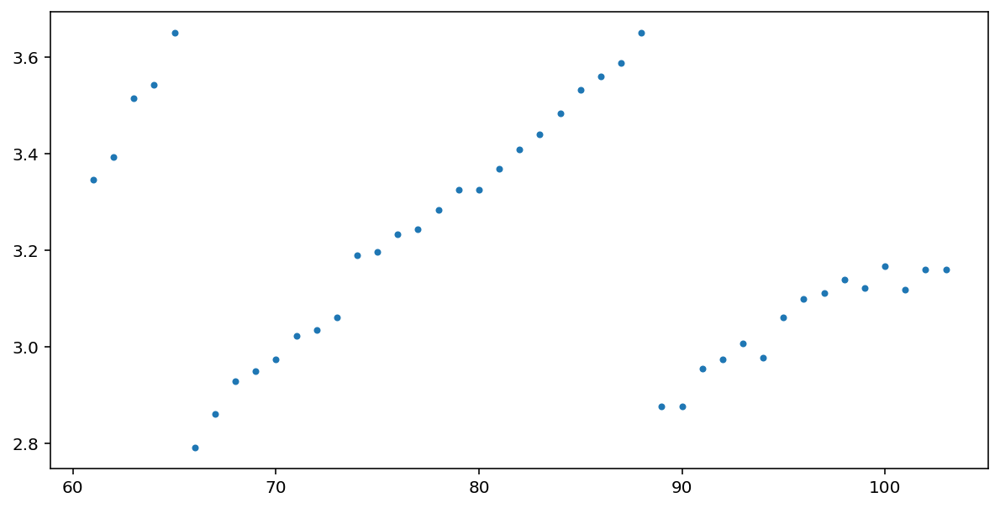

In [ ]:
p3=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[2])]
plt.plot(p3["Frame"],np.log(p3["Spinelength"]),'.')
p3= p3[p3['Frame'] > 88]
p3['cumsum'] = sum(np.log(p3["Spinelength"]))
p3.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,MeanIntensityGFP,SpineWidth,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,id_cell,lin_id_str2,Length,cumsum
50874,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67,3,70-13-1,70,1,280.0,AHHHHHHHHHHHHHHT,NaN,70.0,NaN,...,344.4574,6.4913,13,1,3-13-AHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67...,57860,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67-13,15.9757,101.212809
50984,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67,3,71-13-1,71,1,284.0,AHHHHHHHHHHHHHHT,NaN,70.0,NaN,...,336.9328,6.0904,13,1,3-13-AHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67...,57967,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67-13,17.6417,101.212809
51093,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67,3,72-13-1,72,1,288.0,AHHHHHHHHHHHHHHT,NaN,70.0,NaN,...,332.9855,6.2271,13,1,3-13-AHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67...,58080,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67-13,17.7074,101.212809
51205,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67,3,73-13-1,73,1,292.0,AHHHHHHHHHHHHHHT,NaN,70.0,NaN,...,327.6484,5.7474,13,1,3-13-AHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67...,58189,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67-13,16.7312,101.212809
51314,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67,3,74-13-1,74,1,296.0,AHHHHHHHHHHHHHHT,NaN,70.0,NaN,...,326.0486,6.4506,13,1,3-13-AHHHHHHHHHHHHHHT,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67...,58299,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy67-13,17.8005,101.212809


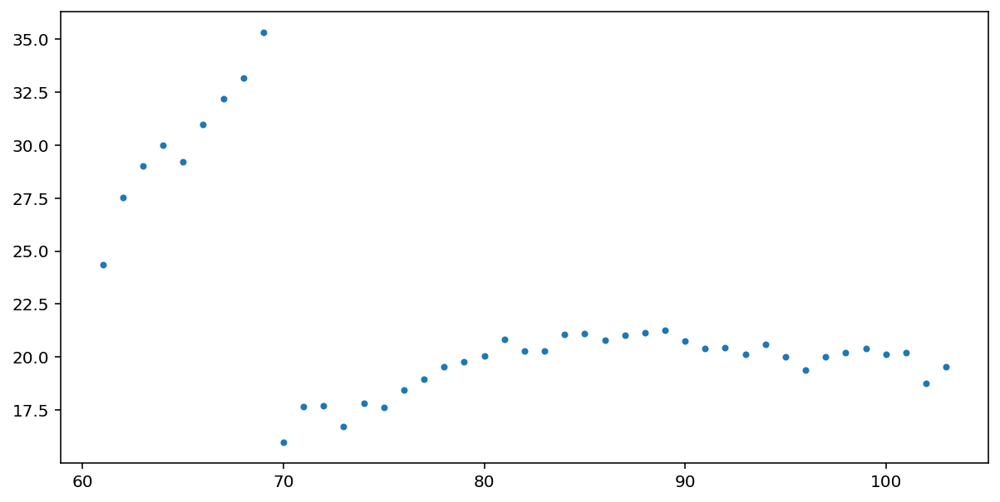

In [ ]:
p4=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[3])]
plt.plot(p4["Frame"],np.log(p4["Spinelength"]),'.')
p4= p4[p4['Frame'] > 69]
p4['cumsum'] = sum(np.log(p4["Spinelength"]))
p4.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,Spinelength,MeanIntensityGFP,SpineWidth,ChannelIdx,CellPosChannel,lin_id_str_long,lin_id_str,lin_id_str2,id_cell,cumsum
74682,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76,5,71-17-0,71,0,284.0,AHHHHHHHHHHHHHHH,101.0,71.0,NaN,...,11.0496,334.4701,8.7448,17,0,5-17-AHHHHHHHHHHHHHHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76-17,77722,93.015728
74722,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76,5,72-17-0,72,0,288.0,AHHHHHHHHHHHHHHH,101.0,71.0,NaN,...,10.7497,324.9256,9.2654,17,0,5-17-AHHHHHHHHHHHHHHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76-17,77762,93.015728
74763,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76,5,73-17-0,73,0,292.0,AHHHHHHHHHHHHHHH,101.0,71.0,NaN,...,14.6060,317.3071,8.2741,17,0,5-17-AHHHHHHHHHHHHHHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76-17,77803,93.015728
74808,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76,5,74-17-0,74,0,296.0,AHHHHHHHHHHHHHHH,101.0,71.0,NaN,...,14.8111,309.4894,8.0283,17,0,5-17-AHHHHHHHHHHHHHHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76-17,77847,93.015728
74847,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76,5,75-17-0,75,0,300.0,AHHHHHHHHHHHHHHH,101.0,71.0,NaN,...,15.1086,303.8836,8.1169,17,0,5-17-AHHHHHHHHHHHHHHH,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76...,2022-05-05_bcmm_isa_crop_all_001_001_crop_xy76-17,77886,93.015728


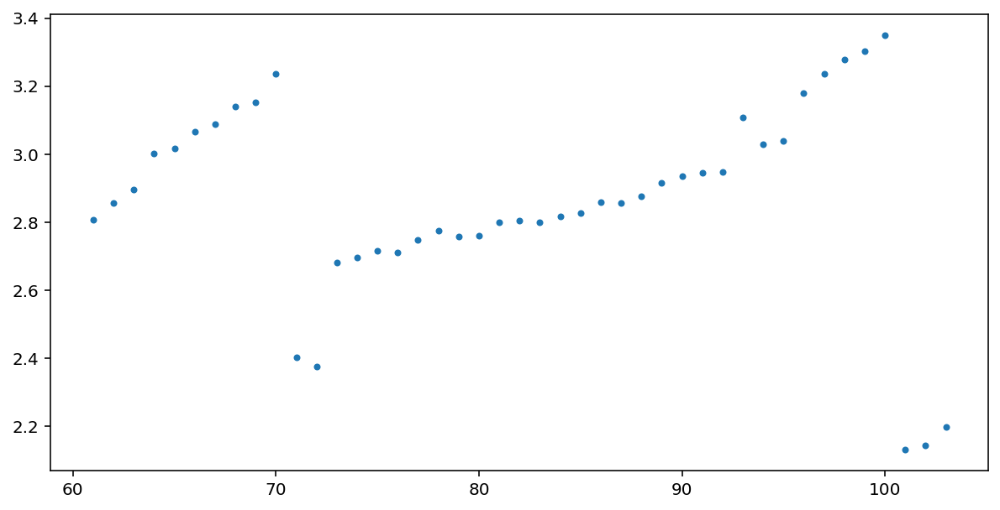

In [ ]:
p5=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[4])]
plt.plot(p5["Frame"],np.log(p5["Spinelength"]),'.')
p5= p5[p5['Frame'] > 70]
p5['cumsum'] = sum(np.log(p5["Spinelength"]))
p5.head()

In [ ]:
p6=persisters[(persisters['lin_id_str2']==np.unique(persisters['lin_id_str2'])[5])]
plt.plot(p6["Frame"],np.log(p6["Spinelength"]),'.')
p6= p6[p6['Frame'] > 88]
p6['cumsum'] = sum(np.log(p6["Spinelength"]))
p6.head()

In [ ]:
p1= p1.loc[p1['lin_mu'] < -2.2, ['lin_id_str', 'Frame', 'lin_mu']]
sum(np.log(p1["Spinelength"]))

In [ ]:
p1= p1[(p1['Frame'] > 60) & (p1['Frame'] < 102)]
plt.plot(p1["Frame"],p1["Spinelength"])
sum(np.log(p1["Spinelength"]))

In [ ]:
#trying to use mean of previous adn future growth rates to filter out strange growth rates.
gr_before = df.groupby('lin_id_str')['lin_mu'].rolling(3, min_periods=3, center=False).apply(np.mean).reset_index(0,drop=True)
indexer = pd.api.indexers.FixedForwardWindowIndexer(window_size=3)
gr_after = df.groupby('lin_id_str')['lin_mu'].rolling(window=indexer, min_periods=3).apply(np.mean).reset_index(0,drop=True)
df['gr_before'] = gr_before
df['gr_after'] = gr_after
df = df[(df["lin_mu"]-gr_before) > 0.3*np.mean(df.loc[:,"lin_mu"]) < (df["lin_mu"]-gr_after)]
#df = df[df.gr_clean > 0.3*np.mean(df.loc[:,"lin_mu"]) & df.gr_clean < 0.3*np.mean(df.loc[:,"lin_mu"])]


In [ ]:
len(np.unique(df.loc[:,"et_id_string"]))

In [ ]:
#negative_gr= df[(df['lin_mu'] < 0)][['lin_id_str','et_id_string', 'lin_mu']]
#negative_gr
#negative_gr.to_csv('2022-08-05_negative_gr.csv',sep=';')
positive_gr= df[(df['lin_mu'] >= 0)]
positive_gr.head()
negative_gr= df[(df['lin_mu'] < 0)]
negative_gr.head()

,Position,PositionIdx,Indices,Frame,Idx,Time,BacteriaLineage,NextDivisionFrame,PreviousDivisionFrame,SizeRatio,...,id_cell,et_id_string,et_id_cell,Length,lin_mu,lin_mu_size,lin_ddt_gfp,lin_ddt_rfp,lin_promoter_act_G,lin_promoter_act_R
117,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-6-4,1,4,4.0,E,NaN,NaN,NaN,...,2147,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,23,32.4959,-0.848528,-0.916145,NaN,NaN,NaN,NaN
131,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-10-4,1,4,4.0,E,NaN,NaN,NaN,...,326,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,2,38.3029,-1.479078,-1.459303,NaN,NaN,NaN,NaN
137,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-11-5,1,5,4.0,D,NaN,NaN,NaN,...,367,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,3,33.2958,-0.676216,0.050001,NaN,NaN,NaN,NaN
153,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-16-4,1,4,4.0,E,NaN,NaN,NaN,...,750,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,8,41.3873,-0.816560,-0.771135,NaN,NaN,NaN,NaN
160,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy01,0,1-19-0,1,0,4.0,A,5.0,NaN,NaN,...,974,2022-08-05_dimm_ujp7534_dgapc_001_001_crop_xy0...,11,32.3751,-1.643733,-0.361091,NaN,NaN,NaN,NaN


In [ ]:
positive_gr.to_csv('2022-08-05_1_positive_gr.csv', sep=';')
#df.to_csv('2022-08-05_1_python.csv',sep=';')

<AxesSubplot:xlabel='lin_mu', ylabel='Count'>

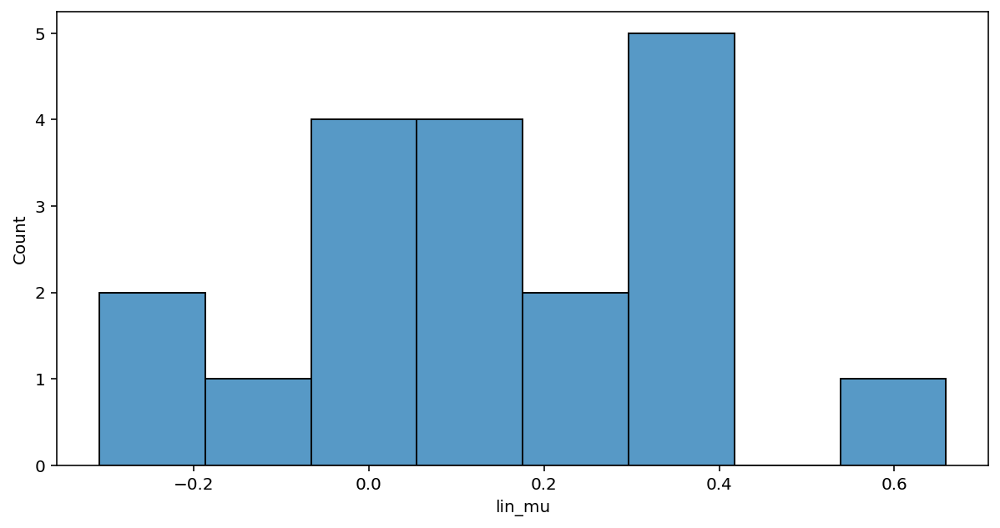

In [ ]:
sns.histplot(data=df, x='lin_mu', bins=8)

In [ ]:
tdf = df[['lin_id_str', 'lin_mu']]

In [ ]:
negative_gr['lin_id_str']=="0-5-A"

117        False
131        False
137        False
153         True
160        False
           ...  
1024990    False
1024995    False
1025005    False
1025011    False
1025020    False
Name: lin_id_str, Length: 107409, dtype: bool

In [ ]:
#c1 = df[df['et_id_string']=="xy00-0-5"]
c1 = p1[(p1['lin_id_str']==("2022-05-05_bcmm_isa_crop_all_001_001_crop_xy46-15"))&(c1['Frame'] ==85)]
print(np.unique(c1["lin_id_str"]))
#print(df[df['et_id_cell']==20]['id_cell'])
c1= c1.loc[c1['lin_mu'] < -2.2, ['lin_id_str', 'Frame', 'lin_mu']]
c1.tail()

[]


,lin_id_str,Frame,lin_mu


In [ ]:
c1 = df[df['Position']=="2022-05-05_bcmm_isa_crop_all_001_002_crop_xy45"]
print(c1)
t_selection= c1[(c1['Frame'] >= 85) & (c1['Frame'] < 140)]
t_selection.head()

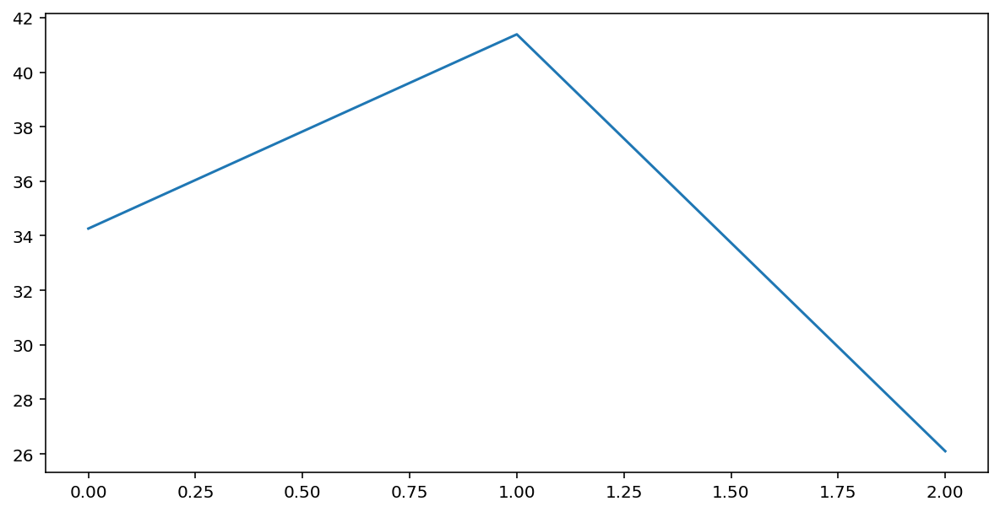

In [ ]:
plt.plot(df[df['lin_id_str']=="0-16-E"]['Frame'], df[df['lin_id_str']=="0-16-E"]['Spinelength'])

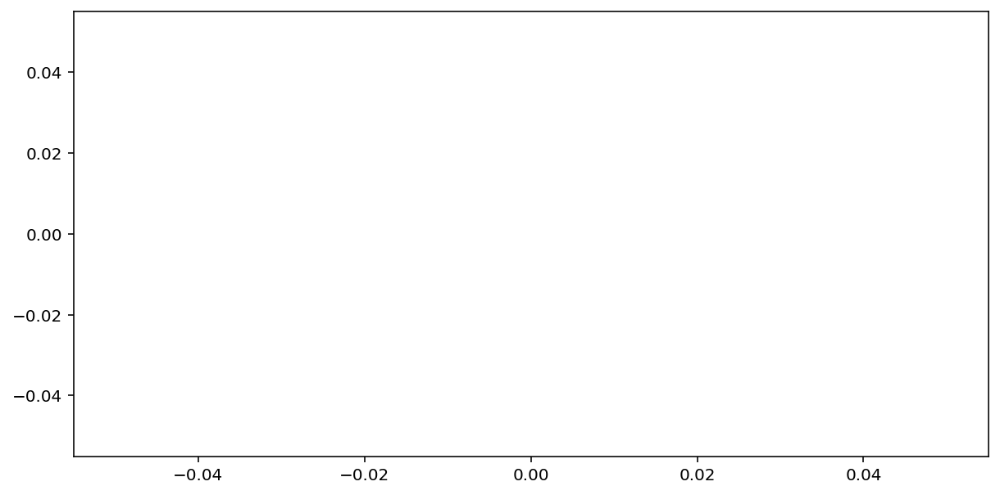

In [ ]:
plt.plot(df[df['et_id_string']=="xy00-0-5"]['Frame']*10/60, df[df['et_id_string']=="xy00-0-5"]['Spinelength'])

In [ ]:
test = df.groupby('lin_id_str')

In [ ]:
list(test.columns)

AttributeError: 'DataFrameGroupBy' object has no attribute 'columns'

In [ ]:
len(test[test['id_cell']==439]['Frame'])

KeyError: 'Column not found: False'

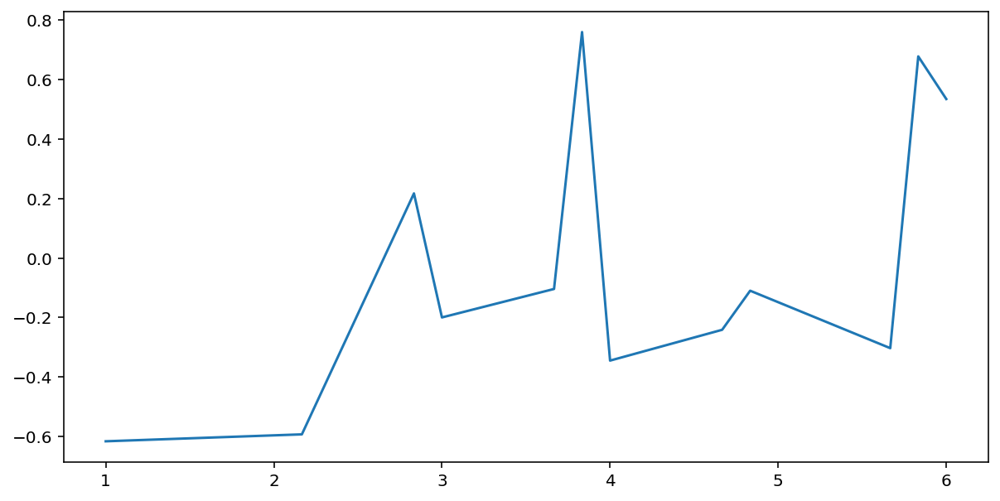

In [ ]:
plt.plot(df[df['id_cell']==439]['Frame']*10/60, df[df['id_cell']==439]['lin_mu'])

In [ ]:
x= np.log(df[df['id_cell']==999]['MeanIntensityGFP'])
y= df[df['id_cell']==999]['mu']
plt.scatter(x, y)

KeyError: 'mu'

In [ ]:
plt.plot(df['Frame']*10./60, mu, '.')

In [ ]:
def grfilter(y, frm_interval=1):
    if y.size > 2:
        y = np.log(y) if log else y
        x = np.arange(y.size) * frm_interval
        p = np.mean(x, y, 1) #simply 1st order polynomial fit / regression (numpy.polyfit)
        ddt = p[0] #slope of first order fit in python p[0]
    else: 
        ddt = np.nan 
    return ddt


In [ ]:
from pybacmman.selections import saveAndOpenSelection
data_subset = data[data.Length>8]
print(f"number of objects: {data_subset.shape[0]}")
saveAndOpenSelection(data_subset, dsName, 1, "long cells", address='127.0.0.1', port=25335, python_proxy_port=25334)